# Multi-Site Aethalometer and Filter Data Analysis

This notebook analyzes aethalometer and filter data from four global sites:
- Beijing, China (CHTS)
- Delhi, India (INDH)
- JPL, California (USPA)
- Addis Ababa, Ethiopia (ETAD)

Each visualization creates:
1. A combined plot with all sites
2. Individual plots for each site

---

## Available Data Variables

### **Aethalometer Data** (`aethalometer_data` dictionary)
Access via: `aethalometer_data['Beijing']`, `aethalometer_data['Delhi']`, etc.

**Temporal:**
- `datetime_local` - Local timestamp (timezone-aware)
- `day_9am` - Date of 9 AM measurement
- `data_completeness_pct` - % of 1440 minutes with data (Beijing, Delhi, JPL only)
- `minutes_with_data` - Number of minutes with BC data

**Black Carbon Measurements (ng/m³):**
- `IR BCc`, `Blue BCc`, `Green BCc`, `Red BCc`, `UV BCc` - Raw BC concentrations
- `IR BCc smoothed`, `Blue BCc smoothed`, `UV BCc smoothed` - Smoothed BC (site-dependent)
- `BC1`, `BC2` variants - Dual-spot measurements
- `Biomass BCc (ng/m^3)`, `Fossil fuel BCc (ng/m^3)` - Source apportionment

**Attenuation (ATN):**
- `[Wavelength] ATN1`, `[Wavelength] ATN2` - Spot 1 and 2 attenuation
- `delta [Wavelength] ATN1/2` - ATN changes
- `[Wavelength] ATN1/2 rolling mean` - Smoothed ATN

**Environmental Sensors:**
- `Internal temp (C)`, `Sample temp (C)` - Temperature
- `Sample RH (%)` - Relative humidity
- `Sample dewpoint (C)` - Dewpoint
- `Internal pressure (Pa)` - Pressure

**Flow Measurements (mL/min):**
- `Flow total (mL/min)` - Total flow (~100)
- `Flow1 (mL/min)`, `Flow2 (mL/min)` - Dual-spot flows
- `Flow setpoint (mL/min)` - Target flow
- `ratio_flow` - Flow ratio

**Particulate Matter:**
- `opc.bins.i0` through `opc.bins.i23` - OPC size bins
- `opc.pms.i0/i1/i2` - PM mass concentrations
- `particulate.counts.i0-i23` - Particle counts by size
- `particulate.masses.i0/i1/i2` - Mass by size

**Additional Sensors:**
- `Accel X/Y/Z` - Accelerometer (device movement)
- `co2.co2` - CO2 concentration
- `co2.temperature`, `co2.relativeHumidity` - CO2 sensor

**Absorption Metrics:**
- `AAE` - Absorption Angstrom Exponent
- `AAE biomass`, `AAE fossil fuel` - Source-specific AAE
- `BB (%)` - Biomass burning percentage
- `Delta-C (ng/m^3)` - Delta-C marker

**Quality Flags:**
- `high_rough_period` - Boolean flag for high roughness
- `[Wavelength] ATN1/2_roughness` - Roughness metrics
- `Status` - Instrument status code

**Metadata:**
- `Site_Code` - Site code (CHTS, INDH, USPA, ETAD)
- `Site_Name` - Full site name
- `Device_ID` - Aethalometer serial number
- `Serial number` - Device serial
- `Firmware version` - Firmware version

---

### **Filter Data** (`filter_data` DataFrame)
Single DataFrame with all sites and parameters

**Identifiers:**
- `Site` - Site code (CHTS, ETAD, INDH, USPA)
- `FilterId` - Unique filter ID (e.g., ETAD-0017)
- `Barcode` - Filter barcode
- `SampleDate` - Date sample collected

**Measurement Info:**
- `Parameter` - What was measured (see categories below)
- `Concentration` - Value (ug/m³)
- `Concentration_Units` - Units (typically ug/m³)
- `MDL` - Minimum Detection Limit
- `MDL_Units` - MDL units
- `Uncertainty` - Measurement uncertainty

**Sample Details:**
- `FilterType` - Type of filter used
- `LotId` - Filter lot number
- `DepositArea_cm2` - Deposition area
- `Volume_m3` - Air volume sampled
- `MassLoading_ug` - Total mass on filter

**Analysis Info:**
- `AnalysisDate` - When analyzed
- `AnalysisTime` - Time analyzed
- `DataSource` - Source (ChemSpec, FTIR, HIPS)
- `CalibrationSetId` - Calibration used
- `FilterComments` - Comments (e.g., "SGP")

**Parameter Categories:**

**ChemSpec EC/OC:**
- `ChemSpec_EC_PM2.5` - Elemental Carbon
- `ChemSpec_OC_PM2.5` - Organic Carbon  
- `ChemSpec_OM_PM2.5` - Organic Matter
- `ChemSpec_BC_PM2.5` - Black Carbon

**FTIR EC/OC:**
- `EC_ftir` - Elemental Carbon (FTIR)
- `OC_ftir` - Organic Carbon (FTIR)
- `OM` - Organic Matter

**FTIR Functional Groups:**
- `alcoholCOH` - Alcohol groups
- `alkaneCH` - Alkane groups
- `carboxylicCOOH` - Carboxylic acid groups
- `naCO` - Carbonyl groups

**HIPS (Absorption):**
- `HIPS_T1`, `HIPS_Slope`, `HIPS_Intercept`
- `HIPS_R1`, `HIPS_t`, `HIPS_tau`, `HIPS_r`
- `HIPS_Fabs`, `HIPS_Uncertainty`, `HIPS_MDL`

**ChemSpec Ions:**
- `ChemSpec_Sulfate_Ion_PM2.5`, `ChemSpec_Nitrate_Ion_PM2.5`
- `ChemSpec_Ammonium_Ion_PM2.5`, `ChemSpec_Chloride_Ion_PM2.5`
- `ChemSpec_Sodium_Ion_PM2.5`, `ChemSpec_Potassium_Ion_PM2.5`
- `ChemSpec_Magnesium_Ion_PM2.5`, `ChemSpec_Calcium_Ion_PM2.5`

**ChemSpec Metals (XRF):**
- Major: Iron, Aluminum, Silicon, Sulfur, Calcium, Potassium
- Trace: Zinc, Lead, Copper, Manganese, Chromium, Nickel
- Ultra-trace: Arsenic, Cadmium, Selenium, Vanadium, etc.

---

## Data Quality Notes

**Aethalometer:**
- Beijing: 37.6% of days have BC data (gaps in record)
- Delhi: 39.1% of days have BC data
- JPL: 63.9% of days have BC data (best coverage)
- Addis Ababa: 100% of days have BC data

**Filter:**
- EC values < 0.5 µg/m³ are excluded (blanks/below MDL)
- Each filter typically has multiple parameters measured
- Sampling frequency varies by site (typically every 3 days)

---

## Site Information

| Site | Code | Location | Timezone | Device |
|------|------|----------|----------|--------|
| Beijing | CHTS | Beijing, China | Asia/Shanghai | WF0010 |
| Delhi | INDH | Delhi, India | Asia/Kolkata | MA350-0216 |
| JPL | USPA | Pasadena, USA | America/Los_Angeles | MA350-0229 |
| Addis Ababa | ETAD | Addis Ababa, Ethiopia | Africa/Addis_Ababa | MA350-0238 |

## Setup and Data Loading

In [61]:
# Import libraries
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from datetime import datetime

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Configure matplotlib
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

print("Libraries imported successfully!")

Libraries imported successfully!


In [62]:
# Define paths
PROCESSED_SITES_DIR = Path('/Users/ahmadjalil/Github/aethmodular/FTIR_HIPS_Chem/processed_sites')
FILTER_DATA_PATH = Path('/Users/ahmadjalil/Github/aethmodular/FTIR_HIPS_Chem/Filter Data/unified_filter_dataset.pkl')

# Site configurations
SITES = {
    'Beijing': {
        'file': 'df_Beijing_9am_resampled.pkl',
        'code': 'CHTS',
        'color': '#E74C3C',  # Red
        'location': 'Beijing, China'
    },
    'Delhi': {
        'file': 'df_Delhi_9am_resampled.pkl',
        'code': 'INDH',
        'color': '#3498DB',  # Blue
        'location': 'Delhi, India'
    },
    'JPL': {
        'file': 'df_JPL_9am_resampled.pkl',
        'code': 'USPA',
        'color': '#2ECC71',  # Green
        'location': 'Pasadena, USA'
    },
    'Addis_Ababa': {
        'file': 'df_Addis_Ababa_9am_resampled.pkl',
        'code': 'ETAD',
        'color': '#F39C12',  # Orange
        'location': 'Addis Ababa, Ethiopia'
    }
}

print("Paths and configurations defined!")

Paths and configurations defined!


In [63]:
# Load all aethalometer datasets
aethalometer_data = {}

for site_name, config in SITES.items():
    file_path = PROCESSED_SITES_DIR / config['file']
    
    if file_path.exists():
        with open(file_path, 'rb') as f:
            df = pickle.load(f)
        
        # Ensure day_9am is datetime
        df['day_9am'] = pd.to_datetime(df['day_9am'])
        
        aethalometer_data[site_name] = df
        print(f"✓ Loaded {site_name}: {len(df)} records, {df['day_9am'].min().date()} to {df['day_9am'].max().date()}")
    else:
        print(f"✗ File not found: {file_path}")

print(f"\nTotal sites loaded: {len(aethalometer_data)}")

✓ Loaded Beijing: 590 records, 2022-02-23 to 2024-10-07
✓ Loaded Delhi: 289 records, 2022-06-27 to 2024-07-01
✓ Loaded JPL: 765 records, 2021-11-08 to 2024-08-14
✓ Loaded Addis_Ababa: 515 records, 2022-12-06 to 2024-09-22

Total sites loaded: 4


In [64]:
# Load filter dataset
with open(FILTER_DATA_PATH, 'rb') as f:
    filter_data = pickle.load(f)

# Convert SampleDate to datetime
filter_data['SampleDate'] = pd.to_datetime(filter_data['SampleDate'])

print(f"Filter dataset loaded: {len(filter_data)} measurements")
print(f"Sites in filter data: {filter_data['Site'].unique()}")
print(f"Date range: {filter_data['SampleDate'].min().date()} to {filter_data['SampleDate'].max().date()}")
print(f"\nTotal unique parameters: {filter_data['Parameter'].nunique()}")

# Categorize parameters by measurement method/type
print("\n" + "="*80)
print("FILTER DATA BREAKDOWN BY MEASUREMENT TYPE")
print("="*80)

# Define categories
categories = {
    'ChemSpec EC/OC': ['ChemSpec_EC_PM2.5', 'ChemSpec_OC_PM2.5', 'ChemSpec_OM_PM2.5', 'ChemSpec_BC_PM2.5'],
    'FTIR EC/OC': ['EC_ftir', 'OC_ftir', 'OM'],
    'FTIR Functional Groups': ['alcoholCOH', 'alkaneCH', 'carboxylicCOOH', 'naCO'],
    'HIPS': ['HIPS_T1', 'HIPS_Slope', 'HIPS_Intercept', 'HIPS_R1', 'HIPS_t', 'HIPS_tau',
             'HIPS_r', 'HIPS_Fabs', 'HIPS_Uncertainty', 'HIPS_MDL'],
    'ChemSpec Ions': ['ChemSpec_Sulfate_Ion_PM2.5', 'ChemSpec_Nitrate_Ion_PM2.5',
                      'ChemSpec_Ammonium_Ion_PM2.5', 'ChemSpec_Chloride_Ion_PM2.5',
                      'ChemSpec_Sodium_Ion_PM2.5', 'ChemSpec_Potassium_Ion_PM2.5',
                      'ChemSpec_Magnesium_Ion_PM2.5', 'ChemSpec_Calcium_Ion_PM2.5'],
    'ChemSpec Metals': ['ChemSpec_Iron_PM2.5', 'ChemSpec_Aluminum_PM2.5',
                        'ChemSpec_Silicon_PM2.5', 'ChemSpec_Sulfur_PM2.5',
                        'ChemSpec_Calcium_PM2.5', 'ChemSpec_Potassium_PM2.5',
                        'ChemSpec_Zinc_PM2.5', 'ChemSpec_Lead_PM2.5',
                        'ChemSpec_Copper_PM2.5', 'ChemSpec_Manganese_PM2.5']
}

# Print breakdown for each category
for category, params in categories.items():
    # Get parameters that exist in the dataset
    existing_params = [p for p in params if p in filter_data['Parameter'].values]
    
    if len(existing_params) > 0:
        category_data = filter_data[filter_data['Parameter'].isin(existing_params)]
        
        print(f"\n{category}:")
        print(f"  Total measurements: {len(category_data)}")
        print(f"  Parameters ({len(existing_params)}):")
        
        param_counts = category_data['Parameter'].value_counts()
        for param in existing_params[:10]:  # Show first 10
            if param in param_counts.index:
                count = param_counts[param]
                print(f"    - {param}: {count}")
        
        if len(existing_params) > 10:
            print(f"    ... and {len(existing_params) - 10} more parameters")

# Show uncategorized parameters
all_categorized = []
for params in categories.values():
    all_categorized.extend(params)

uncategorized = filter_data[~filter_data['Parameter'].isin(all_categorized)]['Parameter'].unique()
if len(uncategorized) > 0:
    print(f"\nOther Parameters ({len(uncategorized)}):")
    print(f"  {list(uncategorized[:10])}")
    if len(uncategorized) > 10:
        print(f"  ... and {len(uncategorized) - 10} more")

print("\n" + "="*80)
print("BREAKDOWN BY SITE")
print("="*80)

for site in sorted(filter_data['Site'].unique()):
    site_data = filter_data[filter_data['Site'] == site]
    print(f"\n{site}:")
    print(f"  Total measurements: {len(site_data)}")
    print(f"  Unique filters: {site_data['FilterId'].nunique()}")
    print(f"  Date range: {site_data['SampleDate'].min().date()} to {site_data['SampleDate'].max().date()}")
    
    # Show top measurement types
    print(f"  Top measurement types:")
    for category, params in categories.items():
        category_count = len(site_data[site_data['Parameter'].isin(params)])
        if category_count > 0:
            print(f"    - {category}: {category_count} measurements")

Filter dataset loaded: 44493 measurements
Sites in filter data: ['CHTS' 'ETAD' 'INDH' 'USPA']
Date range: 2013-06-28 to 2024-12-08

Total unique parameters: 62

FILTER DATA BREAKDOWN BY MEASUREMENT TYPE

ChemSpec EC/OC:
  Total measurements: 3265
  Parameters (4):
    - ChemSpec_EC_PM2.5: 1043
    - ChemSpec_OC_PM2.5: 1043
    - ChemSpec_OM_PM2.5: 427
    - ChemSpec_BC_PM2.5: 752

FTIR EC/OC:
  Total measurements: 2250
  Parameters (3):
    - EC_ftir: 750
    - OC_ftir: 750
    - OM: 750

FTIR Functional Groups:
  Total measurements: 3000
  Parameters (4):
    - alcoholCOH: 750
    - alkaneCH: 750
    - carboxylicCOOH: 750
    - naCO: 750

HIPS:
  Total measurements: 6470
  Parameters (10):
    - HIPS_T1: 683
    - HIPS_Slope: 683
    - HIPS_Intercept: 683
    - HIPS_R1: 683
    - HIPS_t: 683
    - HIPS_tau: 683
    - HIPS_r: 683
    - HIPS_Fabs: 546
    - HIPS_Uncertainty: 546
    - HIPS_MDL: 597

ChemSpec Ions:
  Total measurements: 6448
  Parameters (7):
    - ChemSpec_Sulfate_Ion_P

## Helper Functions for Plotting

In [65]:
def plot_combined_and_individual(plot_function, title_base, **kwargs):
    """
    Create combined plot and individual plots for each site.
    
    Parameters:
    -----------
    plot_function : callable
        Function that takes (ax, site_name, df, config, **kwargs) and creates a plot
    title_base : str
        Base title for the plots
    **kwargs : dict
        Additional arguments to pass to plot_function
    """
    
    # 1. Combined plot
    fig, ax = plt.subplots(figsize=(14, 7))
    
    for site_name, df in aethalometer_data.items():
        config = SITES[site_name]
        plot_function(ax, site_name, df, config, **kwargs)
    
    ax.set_title(f"{title_base} - All Sites", fontsize=14, fontweight='bold')
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # 2. Individual plots
    for site_name, df in aethalometer_data.items():
        config = SITES[site_name]
        
        fig, ax = plt.subplots(figsize=(12, 6))
        plot_function(ax, site_name, df, config, **kwargs)
        
        ax.set_title(f"{title_base} - {site_name}", fontsize=14, fontweight='bold')
        ax.legend(loc='best')
        ax.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

print("Helper functions defined!")

Helper functions defined!


## 1. Time Series: Black Carbon Concentrations

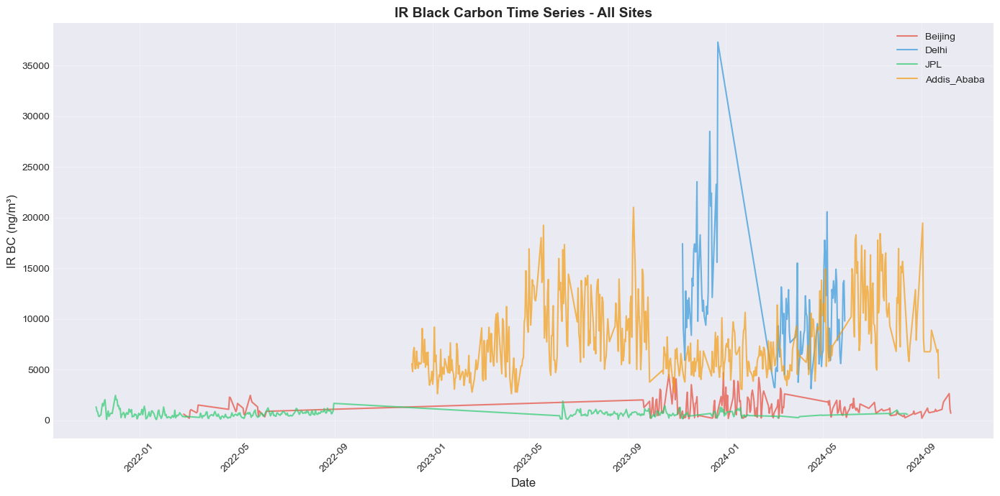

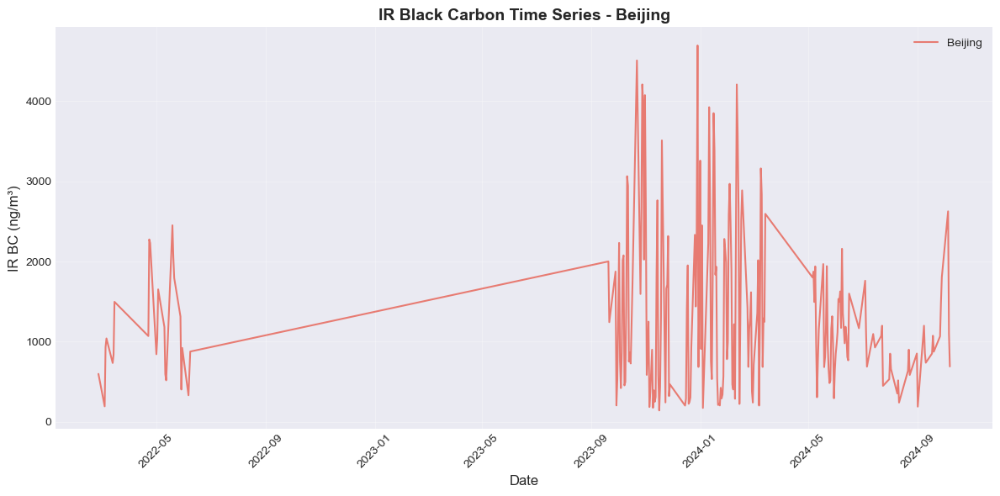

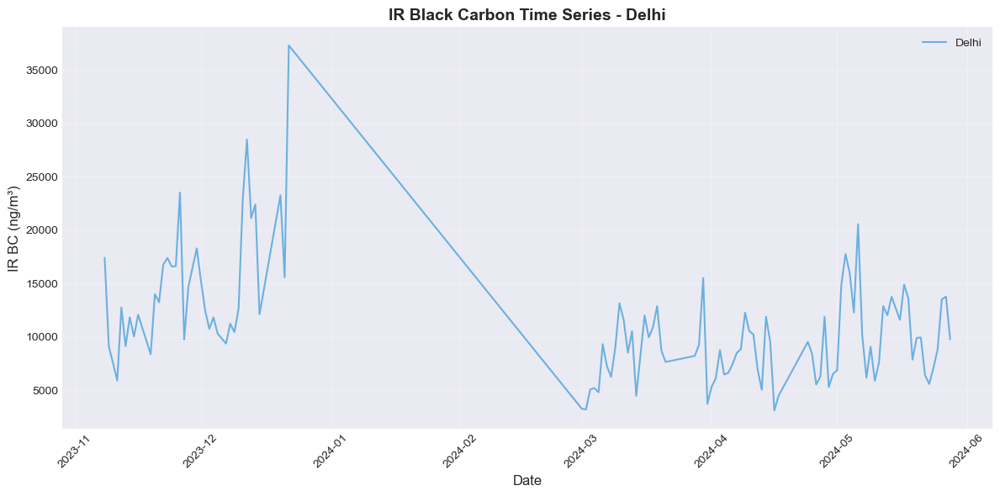

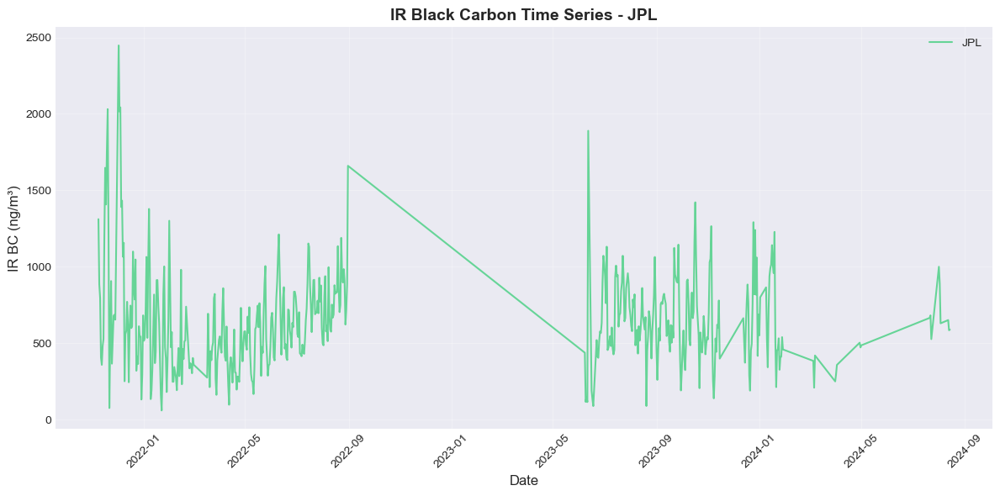

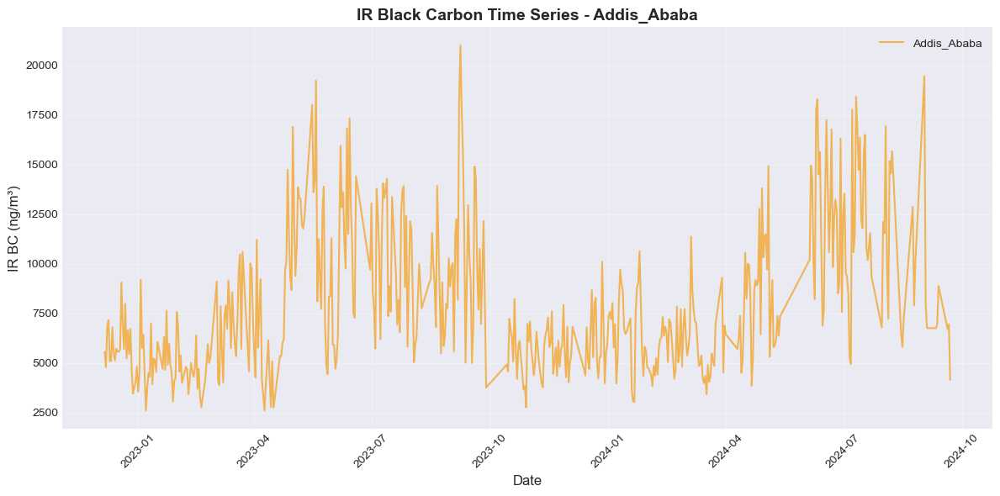

In [66]:
def plot_bc_timeseries(ax, site_name, df, config, wavelength='IR'):
    """Plot BC time series for a specific wavelength"""
    col_name = f'{wavelength} BCc'
    
    if col_name in df.columns:
        # Filter valid data
        valid_data = df[df[col_name].notna()].copy()
        
        if len(valid_data) > 0:
            ax.plot(valid_data['day_9am'], valid_data[col_name], 
                   color=config['color'], label=f"{site_name}", 
                   alpha=0.7, linewidth=1.5)
    
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel(f'{wavelength} BC (ng/m³)', fontsize=12)
    ax.tick_params(axis='x', rotation=45)

# Create plots
plot_combined_and_individual(
    plot_bc_timeseries,
    "IR Black Carbon Time Series",
    wavelength='IR'
)

## 2. Multi-Wavelength BC Comparison

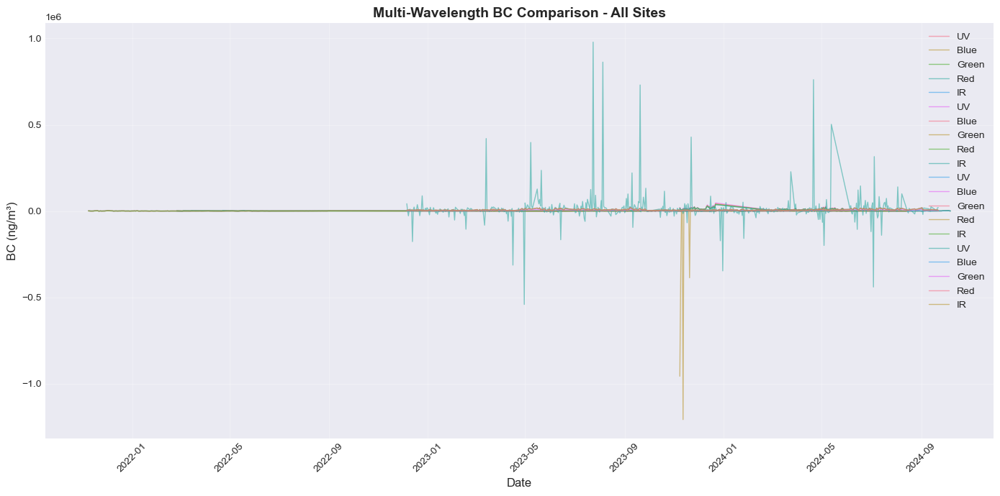

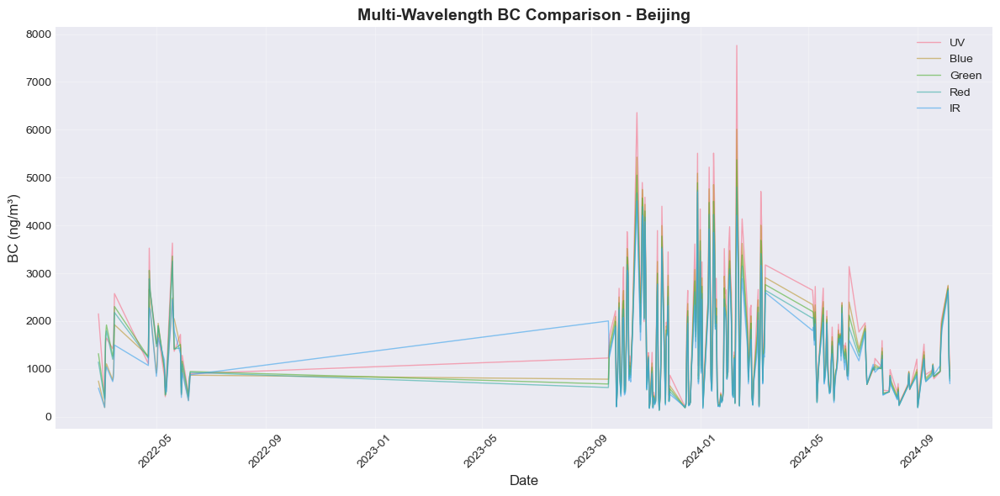

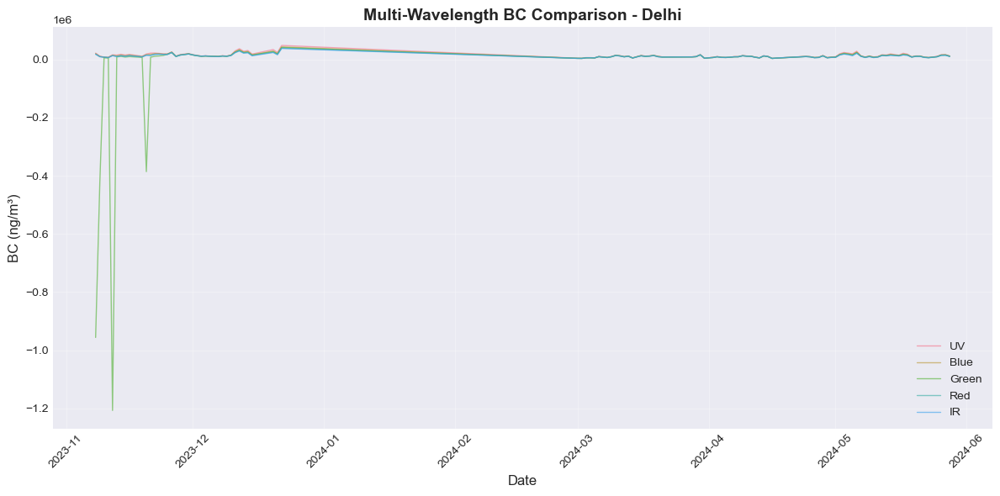

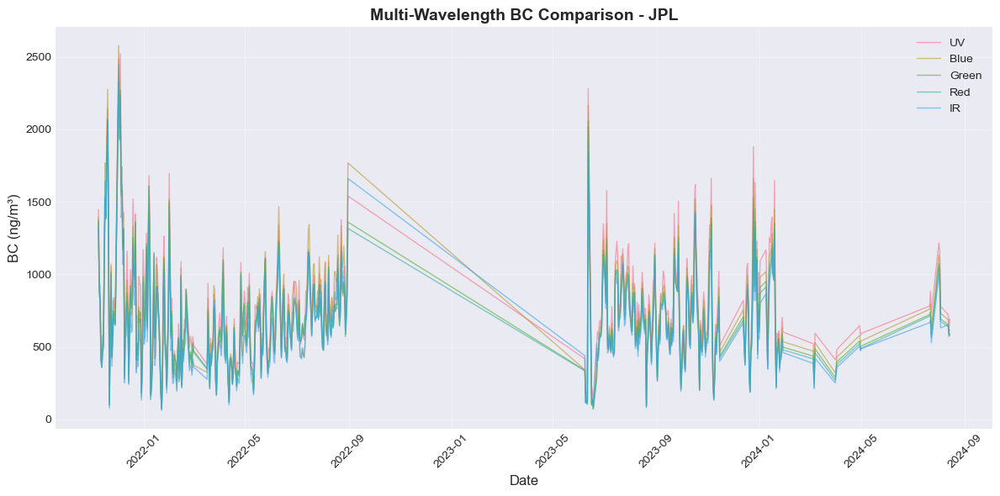

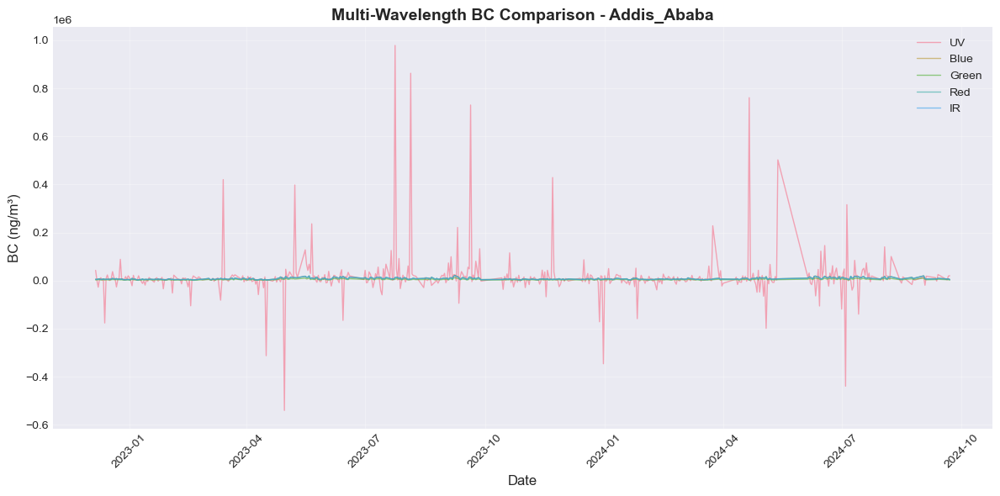

In [67]:
def plot_multiwavelength_bc(ax, site_name, df, config):
    """Plot BC for multiple wavelengths"""
    wavelengths = ['UV', 'Blue', 'Green', 'Red', 'IR']
    
    for wavelength in wavelengths:
        col_name = f'{wavelength} BCc'
        
        if col_name in df.columns:
            valid_data = df[df[col_name].notna()].copy()
            
            if len(valid_data) > 0:
                ax.plot(valid_data['day_9am'], valid_data[col_name], 
                       label=f"{wavelength}", alpha=0.6, linewidth=1)
    
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('BC (ng/m³)', fontsize=12)
    ax.tick_params(axis='x', rotation=45)

# Create plots
plot_combined_and_individual(
    plot_multiwavelength_bc,
    "Multi-Wavelength BC Comparison"
)

## 3. BC Distribution (Box Plots)

/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/4103919221.py:14: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(bc_data_combined, labels=site_labels, patch_artist=True)


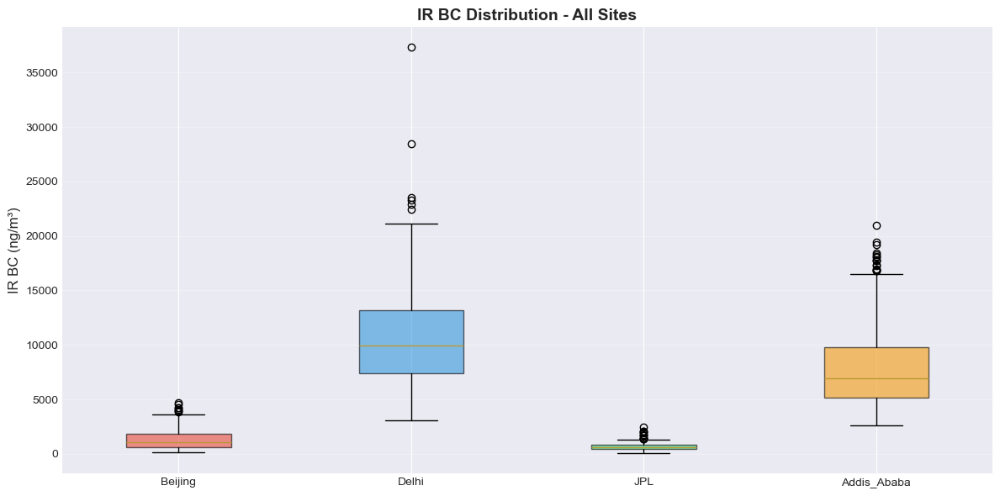

/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/4103919221.py:44: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(bc_data, labels=labels, patch_artist=True)


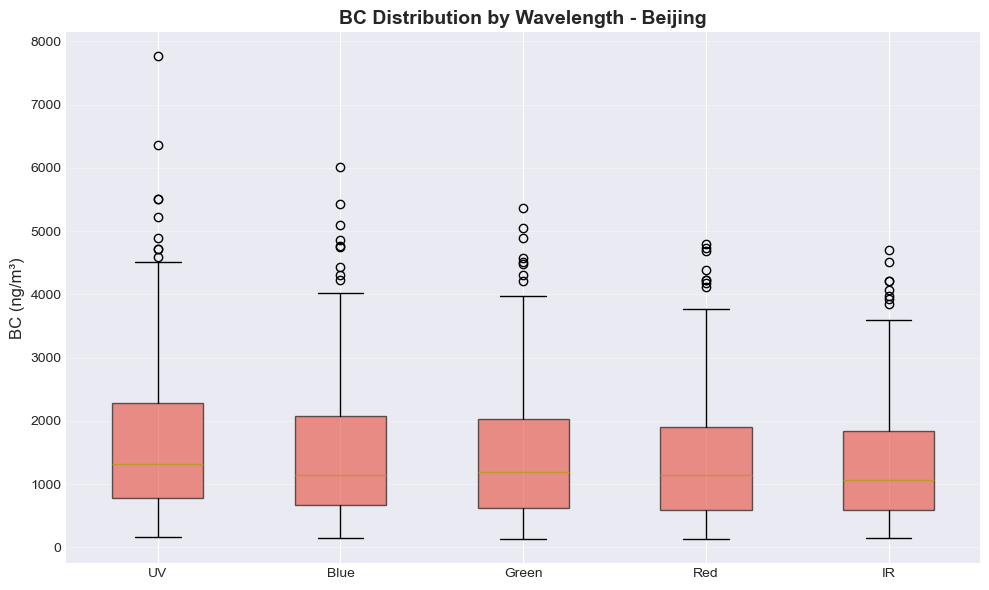

/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/4103919221.py:44: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(bc_data, labels=labels, patch_artist=True)


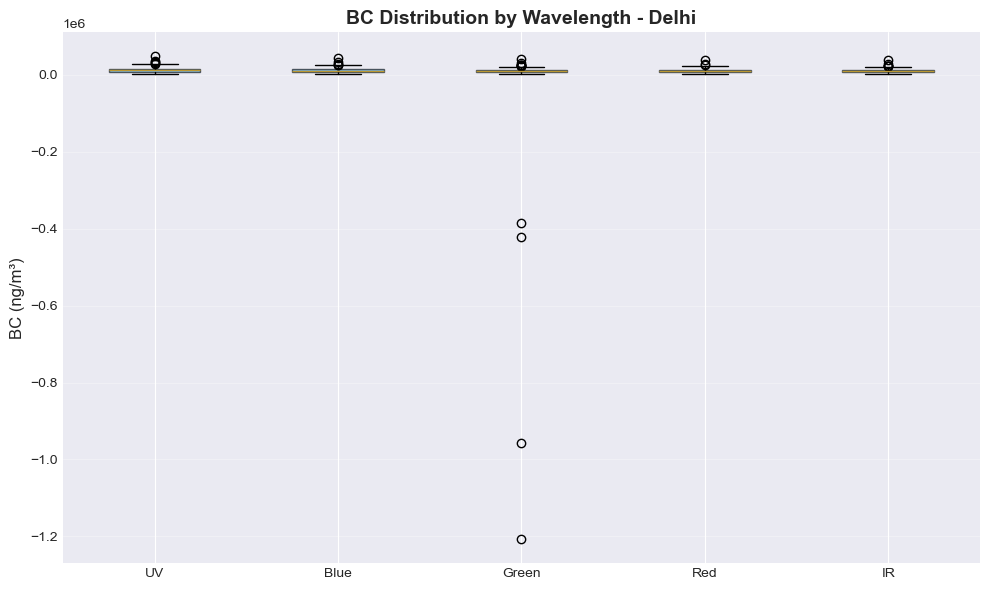

/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/4103919221.py:44: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(bc_data, labels=labels, patch_artist=True)


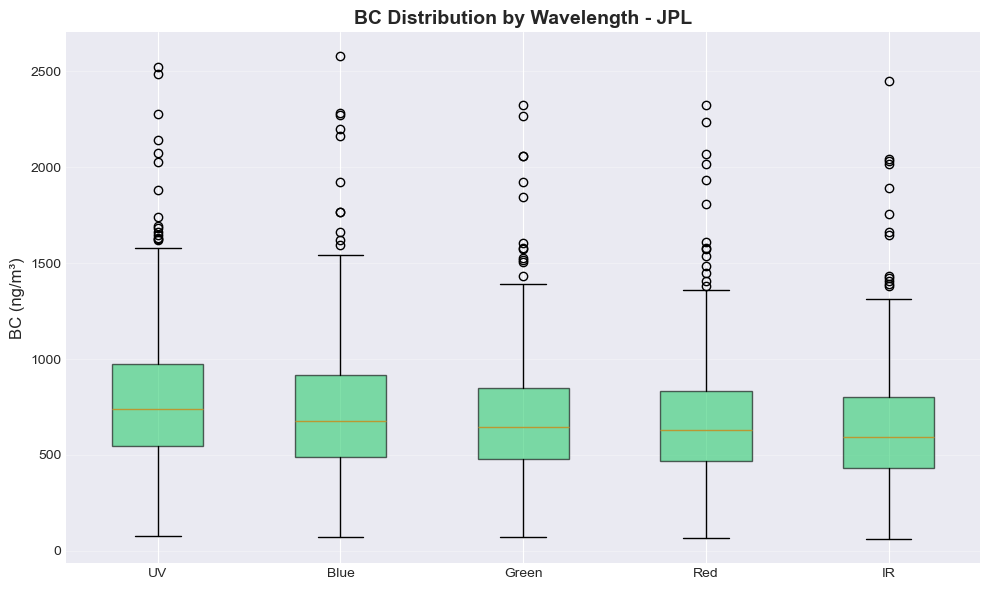

/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/4103919221.py:44: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(bc_data, labels=labels, patch_artist=True)


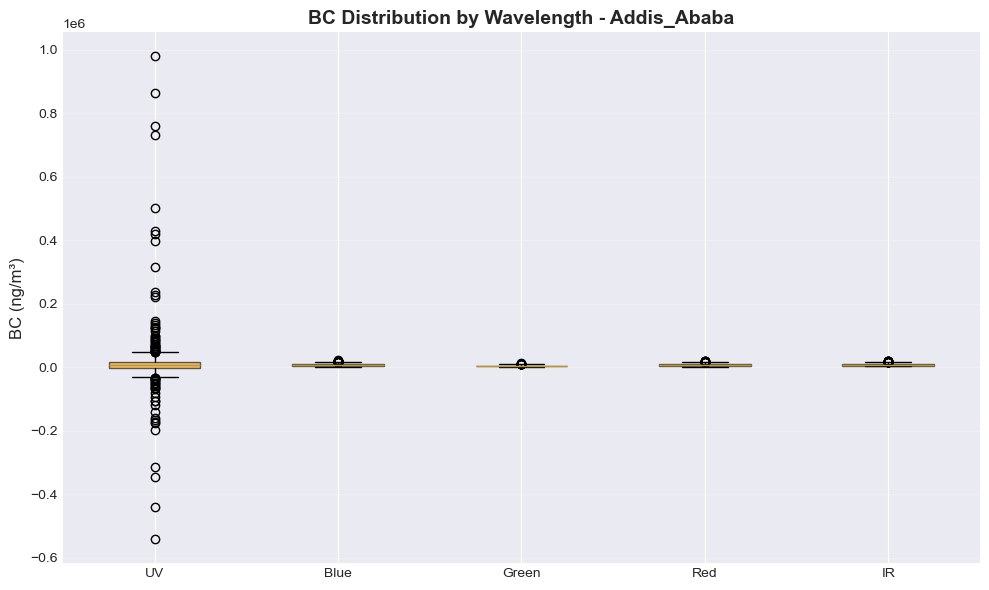

In [68]:
# Combined box plot
fig, ax = plt.subplots(figsize=(12, 6))

bc_data_combined = []
site_labels = []

for site_name, df in aethalometer_data.items():
    if 'IR BCc' in df.columns:
        valid_data = df['IR BCc'].dropna()
        if len(valid_data) > 0:
            bc_data_combined.append(valid_data)
            site_labels.append(site_name)

bp = ax.boxplot(bc_data_combined, labels=site_labels, patch_artist=True)

# Color boxes
for patch, site_name in zip(bp['boxes'], site_labels):
    patch.set_facecolor(SITES[site_name]['color'])
    patch.set_alpha(0.6)

ax.set_title('IR BC Distribution - All Sites', fontsize=14, fontweight='bold')
ax.set_ylabel('IR BC (ng/m³)', fontsize=12)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Individual box plots (multi-wavelength)
for site_name, df in aethalometer_data.items():
    fig, ax = plt.subplots(figsize=(10, 6))
    
    wavelengths = ['UV', 'Blue', 'Green', 'Red', 'IR']
    bc_data = []
    labels = []
    
    for wavelength in wavelengths:
        col_name = f'{wavelength} BCc'
        if col_name in df.columns:
            valid_data = df[col_name].dropna()
            if len(valid_data) > 0:
                bc_data.append(valid_data)
                labels.append(wavelength)
    
    if len(bc_data) > 0:
        bp = ax.boxplot(bc_data, labels=labels, patch_artist=True)
        
        for patch in bp['boxes']:
            patch.set_facecolor(SITES[site_name]['color'])
            patch.set_alpha(0.6)
        
        ax.set_title(f'BC Distribution by Wavelength - {site_name}', fontsize=14, fontweight='bold')
        ax.set_ylabel('BC (ng/m³)', fontsize=12)
        ax.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        plt.show()

## 4. Data Completeness Analysis

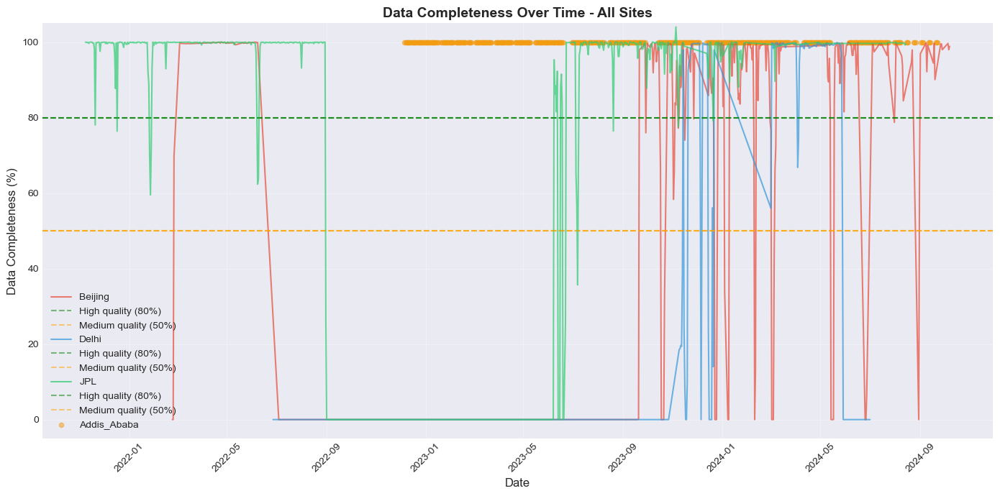

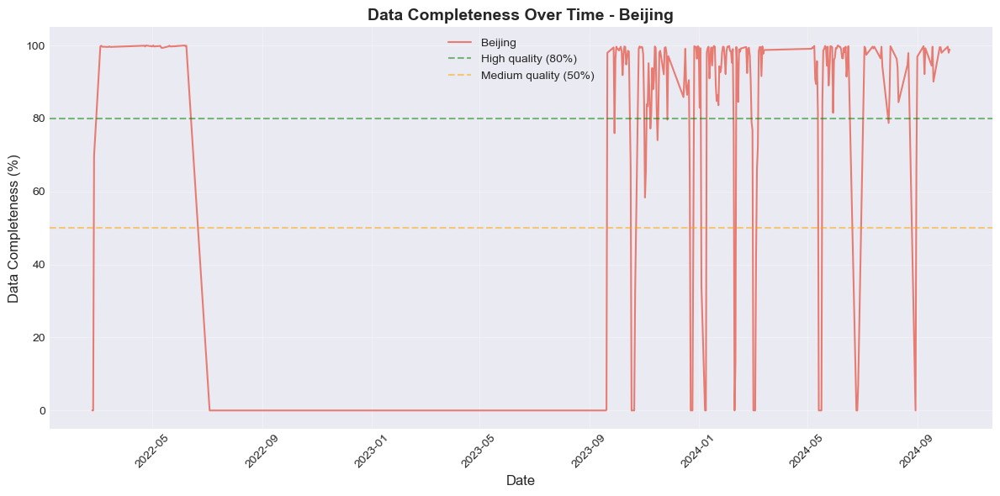

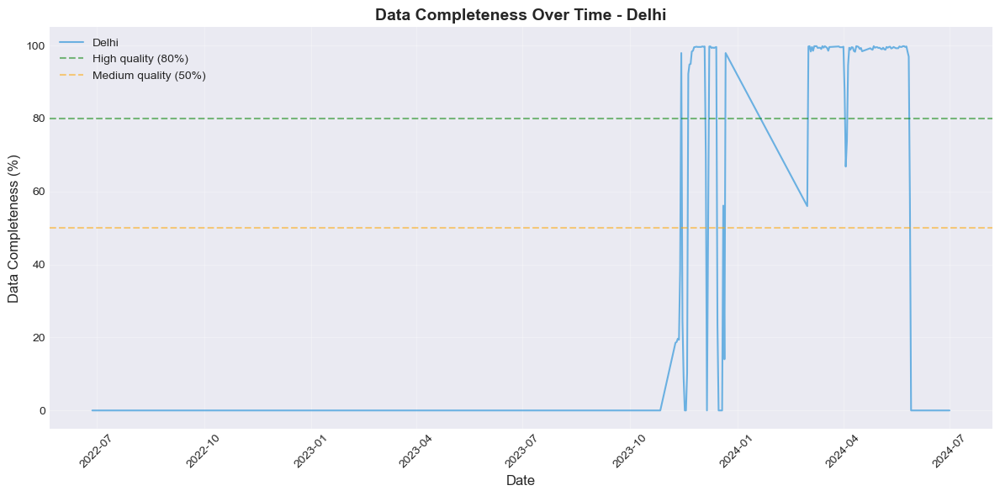

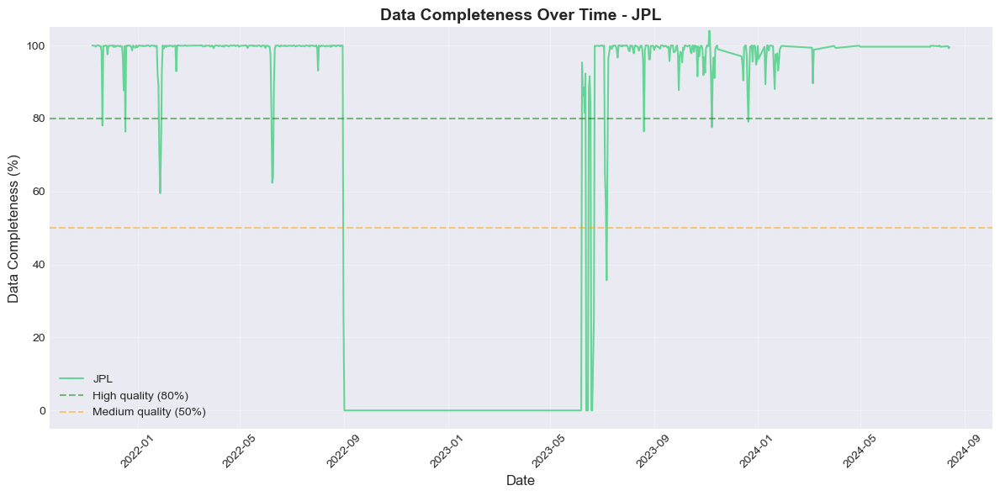

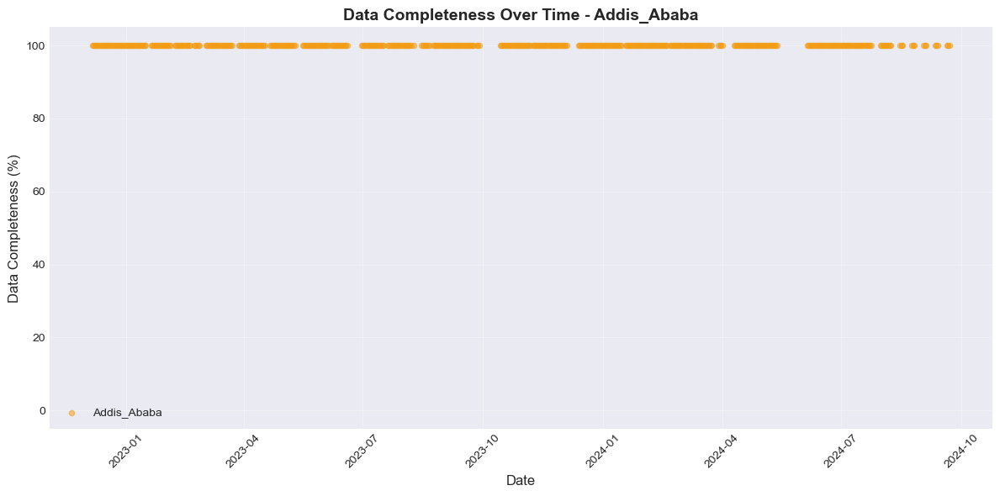

In [69]:
def plot_data_completeness(ax, site_name, df, config):
    """Plot data completeness over time"""
    if 'data_completeness_pct' in df.columns:
        ax.plot(df['day_9am'], df['data_completeness_pct'], 
               color=config['color'], label=site_name, 
               alpha=0.7, linewidth=1.5)
        ax.axhline(y=80, color='green', linestyle='--', alpha=0.5, label='High quality (80%)')
        ax.axhline(y=50, color='orange', linestyle='--', alpha=0.5, label='Medium quality (50%)')
    else:
        # For pre-resampled data, show BC availability
        if 'IR BCc' in df.columns:
            completeness = (df['IR BCc'].notna()).astype(int) * 100
            ax.scatter(df['day_9am'], completeness, 
                      color=config['color'], label=site_name, 
                      alpha=0.5, s=20)
    
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('Data Completeness (%)', fontsize=12)
    ax.set_ylim(-5, 105)
    ax.tick_params(axis='x', rotation=45)

# Create plots
plot_combined_and_individual(
    plot_data_completeness,
    "Data Completeness Over Time"
)

## 5. Filter vs Aethalometer Comparison

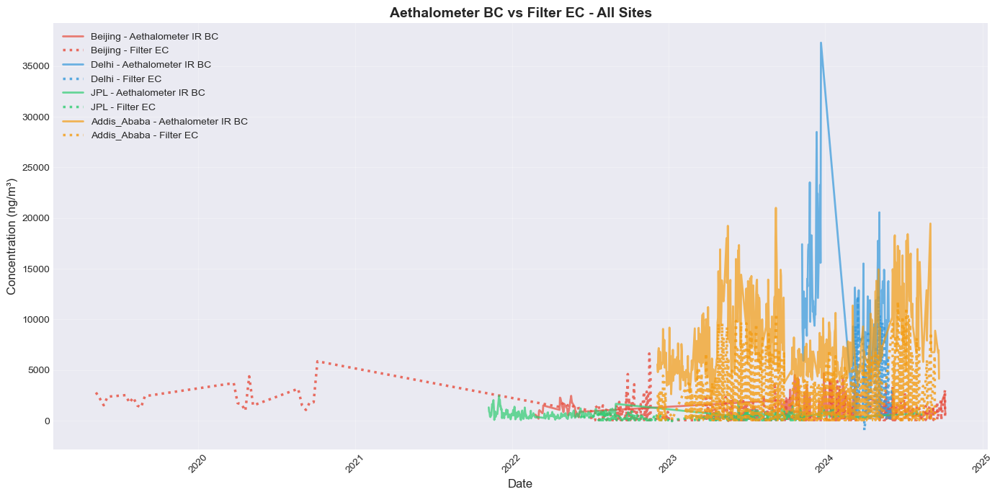

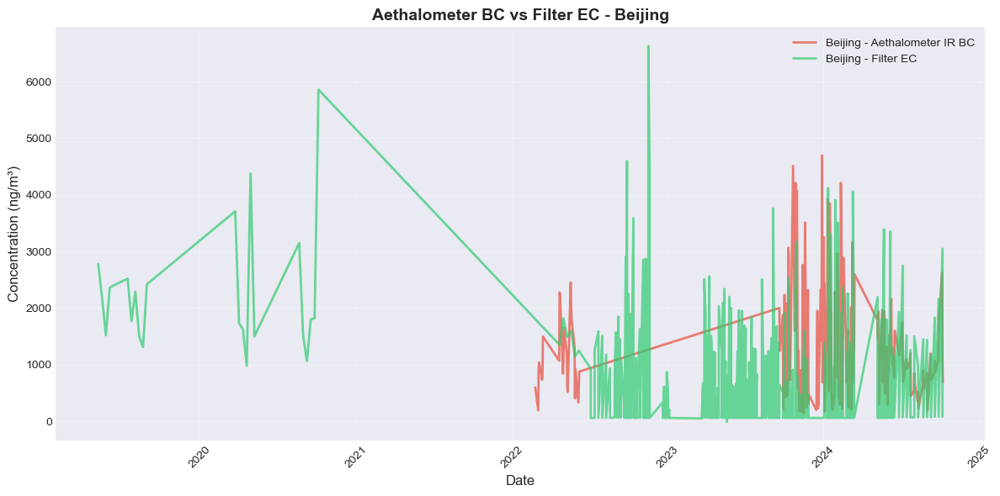

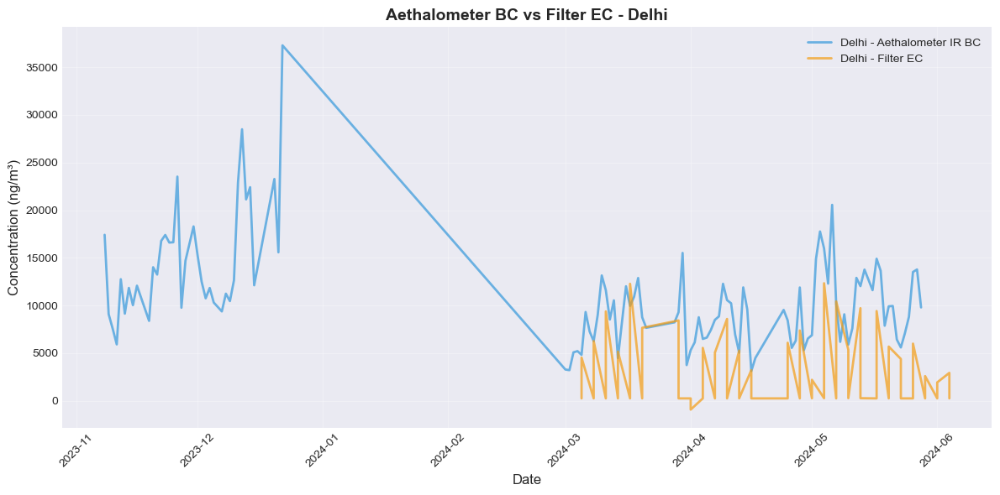

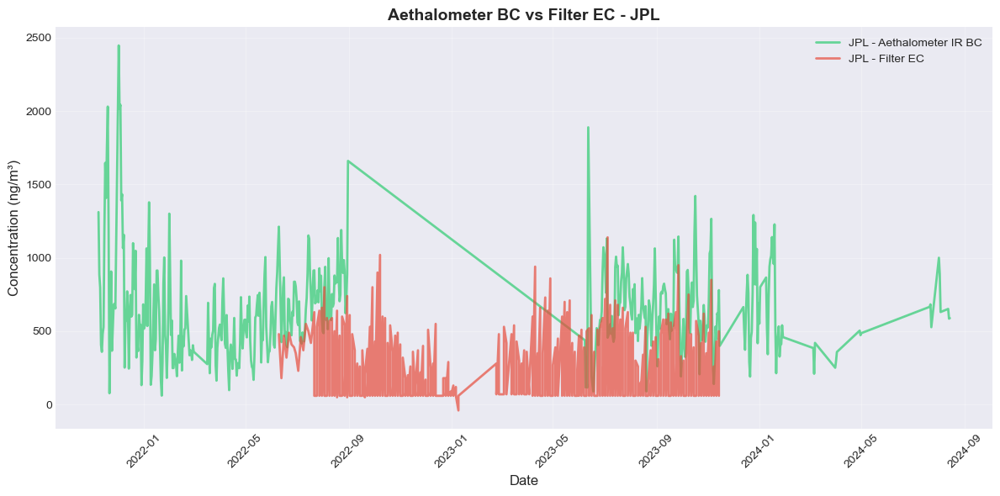

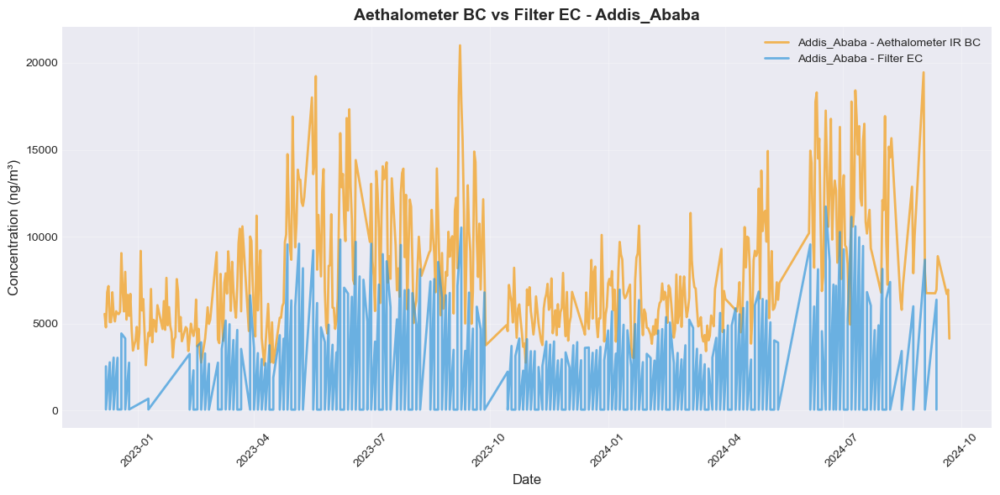

In [70]:
def plot_filter_vs_aethalometer(ax, site_name, df, config, individual=False):
    """Compare aethalometer BC with filter EC measurements"""
    site_code = config['code']
    
    # Get filter data for this site
    site_filters = filter_data[filter_data['Site'] == site_code].copy()
    
    # Get EC measurements
    ec_filters = site_filters[site_filters['Parameter'] == 'ChemSpec_EC_PM2.5'].copy()
    
    if len(ec_filters) > 0 and 'IR BCc' in df.columns:
        # Plot aethalometer BC (solid line)
        valid_aeth = df[df['IR BCc'].notna()].copy()
        ax.plot(valid_aeth['day_9am'], valid_aeth['IR BCc'], 
               color=config['color'], label=f'{site_name} - Aethalometer IR BC', 
               alpha=0.7, linewidth=2, linestyle='-')
        
        # Plot filter EC
        ec_filters = ec_filters.sort_values('SampleDate')
        ec_filters['Concentration_ng'] = ec_filters['Concentration'] * 1000
        
        if individual:
            # For individual plots: use contrasting color and solid line
            # Define contrasting colors for each site
            contrast_colors = {
                'Beijing': '#2ECC71',    # Green (opposite of Red)
                'Delhi': '#F39C12',      # Orange (opposite of Blue)
                'JPL': '#E74C3C',        # Red (opposite of Green)
                'Addis_Ababa': '#3498DB' # Blue (opposite of Orange)
            }
            
            filter_color = contrast_colors.get(site_name, '#95A5A6')  # Gray as fallback
            
            ax.plot(ec_filters['SampleDate'], ec_filters['Concentration_ng'], 
                   color=filter_color, linestyle='-', linewidth=2,
                   label=f'{site_name} - Filter EC', alpha=0.7)
        else:
            # For combined plots: use same color but dotted line
            ax.plot(ec_filters['SampleDate'], ec_filters['Concentration_ng'], 
                   color=config['color'], linestyle=':', linewidth=2.5,
                   label=f'{site_name} - Filter EC', alpha=0.8)
    
    ax.set_xlabel('Date', fontsize=12)
    ax.set_ylabel('Concentration (ng/m³)', fontsize=12)
    ax.tick_params(axis='x', rotation=45)

# Combined plot
fig, ax = plt.subplots(figsize=(14, 7))

for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    plot_filter_vs_aethalometer(ax, site_name, df, config, individual=False)

ax.set_title("Aethalometer BC vs Filter EC - All Sites", fontsize=14, fontweight='bold')
ax.legend(loc='best')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Individual plots
for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    plot_filter_vs_aethalometer(ax, site_name, df, config, individual=True)
    
    ax.set_title(f"Aethalometer BC vs Filter EC - {site_name}", fontsize=14, fontweight='bold')
    ax.legend(loc='best')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

## 6. Scatter: Aethalometer vs Filter EC Correlation

MATCHING SUMMARY - Combined Plot
Beijing: 168 filter dates → 66 matched pairs
Delhi: 26 filter dates → 24 matched pairs
JPL: 67 filter dates → 44 matched pairs
Addis_Ababa: 175 filter dates → 166 matched pairs


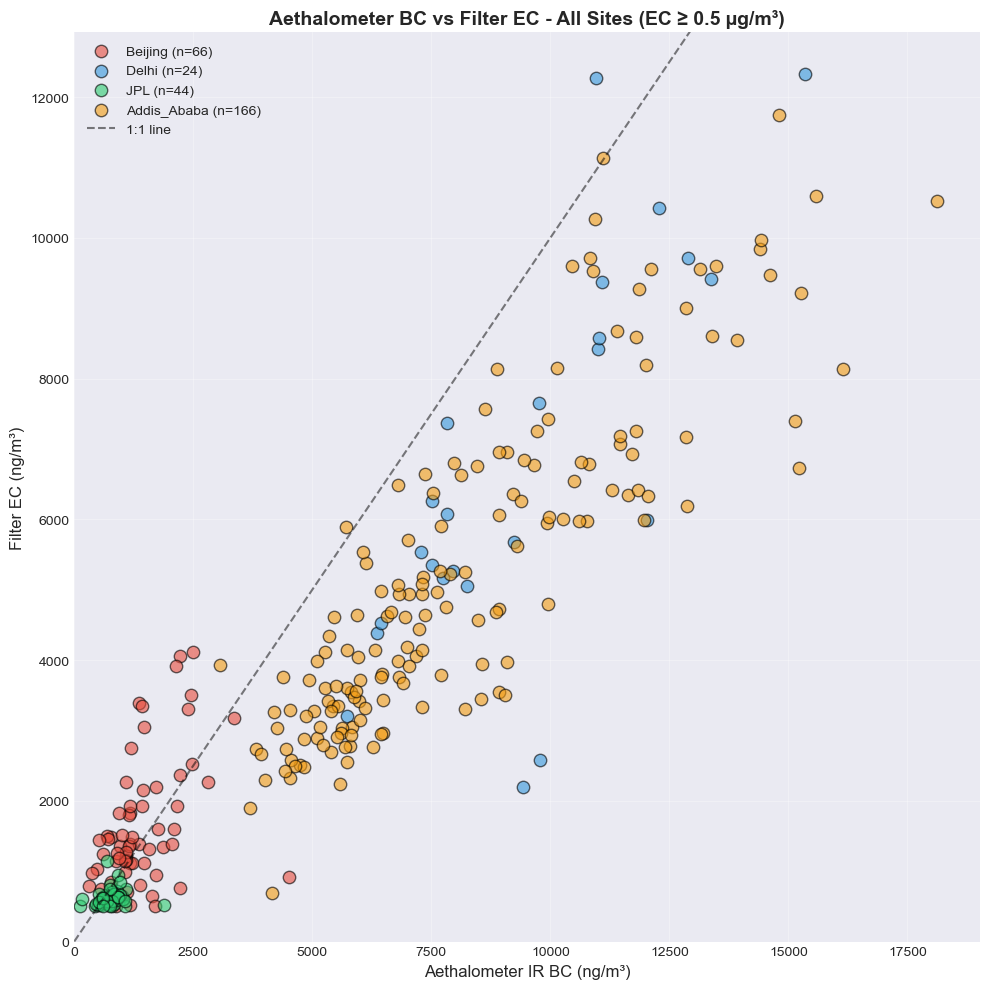


INDIVIDUAL SCATTER PLOTS

Beijing:
  Filter dates available (EC ≥ 0.5 µg/m³): 168
  Matched pairs: 66
  Aethalometer BC range: 307.6 - 4509.8 ng/m³
  Filter EC range: 500.0 - 4120.0 ng/m³


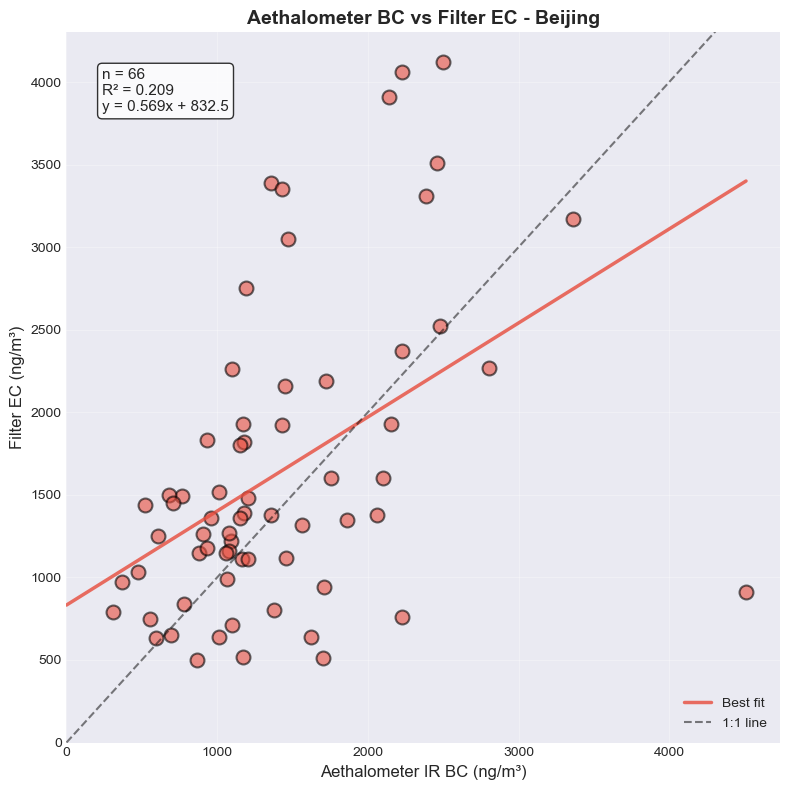


Delhi:
  Filter dates available (EC ≥ 0.5 µg/m³): 26
  Matched pairs: 24
  Aethalometer BC range: 5722.9 - 15348.0 ng/m³
  Filter EC range: 2190.0 - 12330.0 ng/m³


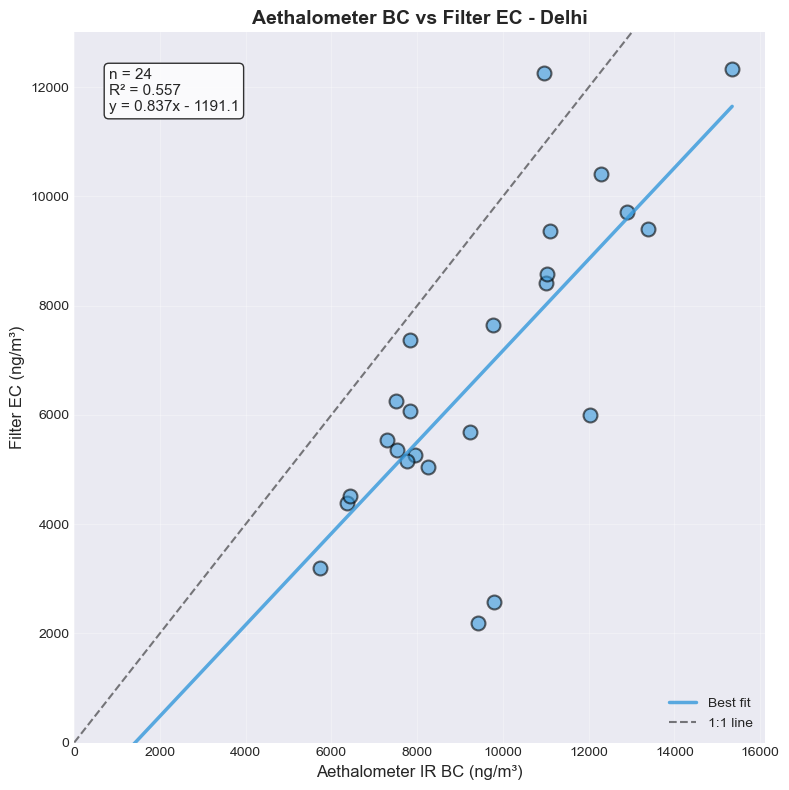


JPL:
  Filter dates available (EC ≥ 0.5 µg/m³): 67
  Matched pairs: 44
  Aethalometer BC range: 127.3 - 1889.6 ng/m³
  Filter EC range: 500.0 - 1140.0 ng/m³


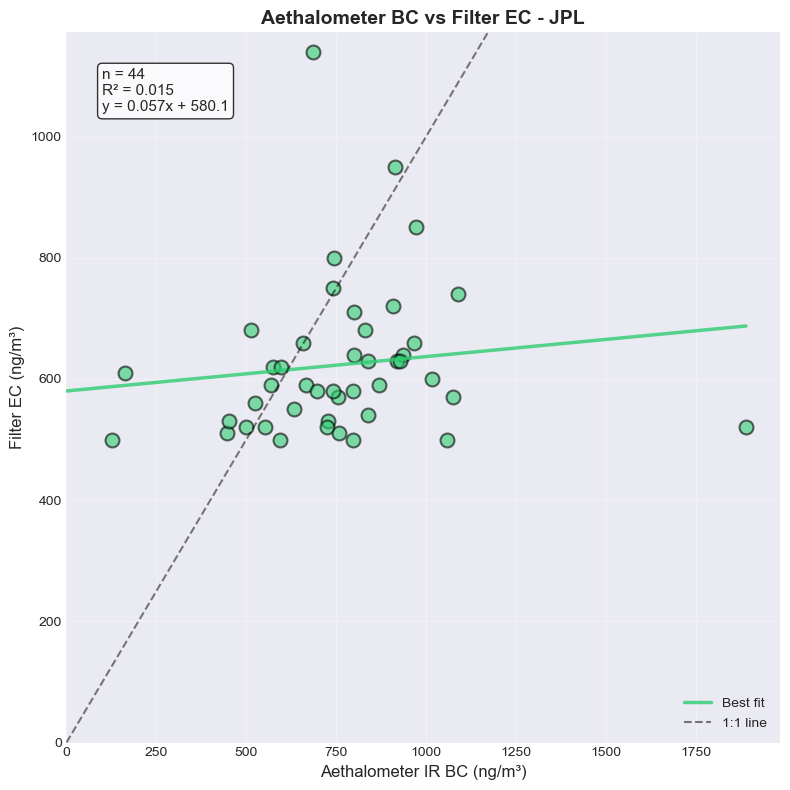


Addis_Ababa:
  Filter dates available (EC ≥ 0.5 µg/m³): 175
  Matched pairs: 166
  Aethalometer BC range: 3051.9 - 18125.3 ng/m³
  Filter EC range: 690.0 - 11740.0 ng/m³


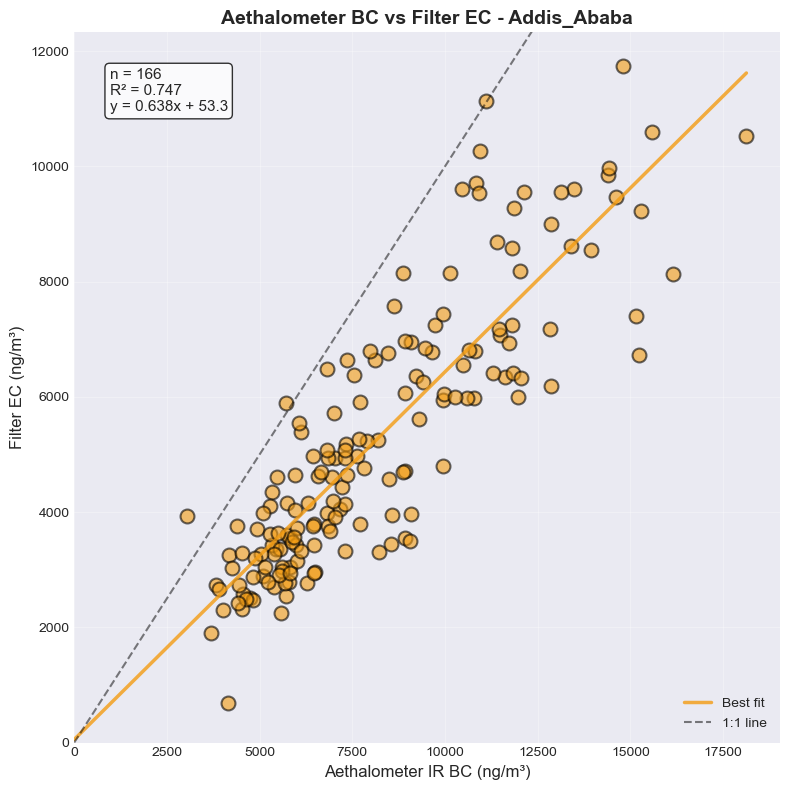

In [71]:
# Combined scatter plot
fig, ax = plt.subplots(figsize=(10, 10))

print("="*80)
print("MATCHING SUMMARY - Combined Plot")
print("="*80)

for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    site_code = config['code']
    
    # Get filter EC data
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'ChemSpec_EC_PM2.5')
    ].copy()
    
    # Filter out values below or near MDL (exclude values < 0.5 ug/m3 = 500 ng/m3)
    # These are typically blanks or below detection limit
    site_filters = site_filters[site_filters['Concentration'] >= 0.5].copy()
    
    if len(site_filters) > 0 and 'IR BCc' in df.columns:
        # Merge on date (±1 day tolerance)
        matched_data = []
        
        for _, filter_row in site_filters.iterrows():
            filter_date = filter_row['SampleDate']
            
            # Find aethalometer measurement within ±1 day
            date_match = df[
                (df['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
                (df['day_9am'] <= filter_date + pd.Timedelta(days=1))
            ]
            
            if len(date_match) > 0 and date_match['IR BCc'].notna().any():
                aeth_bc = date_match['IR BCc'].mean()
                filter_ec = filter_row['Concentration'] * 1000  # ug/m3 to ng/m3
                matched_data.append({'aeth_bc': aeth_bc, 'filter_ec': filter_ec})
        
        print(f"{site_name}: {len(site_filters)} filter dates → {len(matched_data)} matched pairs")
        
        if len(matched_data) > 0:
            matched_df = pd.DataFrame(matched_data)
            ax.scatter(matched_df['aeth_bc'], matched_df['filter_ec'], 
                      color=config['color'], label=f'{site_name} (n={len(matched_data)})', 
                      alpha=0.6, s=80, edgecolors='black', linewidth=1)

# Set axis limits to start from 0,0
ax.set_xlim(left=0)
ax.set_ylim(bottom=0)

# Add 1:1 line
max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')

ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=12)
ax.set_ylabel('Filter EC (ng/m³)', fontsize=12)
ax.set_title('Aethalometer BC vs Filter EC - All Sites (EC ≥ 0.5 µg/m³)', fontsize=14, fontweight='bold')
ax.legend(loc='best')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("INDIVIDUAL SCATTER PLOTS")
print("="*80 + "\n")

# Individual scatter plots
for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    site_code = config['code']
    
    # Get filter EC data
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'ChemSpec_EC_PM2.5')
    ].copy()
    
    # Filter out values below MDL
    site_filters = site_filters[site_filters['Concentration'] >= 0.5].copy()
    
    if len(site_filters) > 0 and 'IR BCc' in df.columns:
        # Merge on date
        matched_data = []
        
        for _, filter_row in site_filters.iterrows():
            filter_date = filter_row['SampleDate']
            
            date_match = df[
                (df['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
                (df['day_9am'] <= filter_date + pd.Timedelta(days=1))
            ]
            
            if len(date_match) > 0 and date_match['IR BCc'].notna().any():
                aeth_bc = date_match['IR BCc'].mean()
                filter_ec = filter_row['Concentration'] * 1000
                matched_data.append({'aeth_bc': aeth_bc, 'filter_ec': filter_ec})
        
        if len(matched_data) > 0:
            matched_df = pd.DataFrame(matched_data)
            
            print(f"{site_name}:")
            print(f"  Filter dates available (EC ≥ 0.5 µg/m³): {len(site_filters)}")
            print(f"  Matched pairs: {len(matched_df)}")
            print(f"  Aethalometer BC range: {matched_df['aeth_bc'].min():.1f} - {matched_df['aeth_bc'].max():.1f} ng/m³")
            print(f"  Filter EC range: {matched_df['filter_ec'].min():.1f} - {matched_df['filter_ec'].max():.1f} ng/m³")
            
            fig, ax = plt.subplots(figsize=(8, 8))
            
            ax.scatter(matched_df['aeth_bc'], matched_df['filter_ec'], 
                      color=config['color'], alpha=0.6, s=100, 
                      edgecolors='black', linewidth=1.5)
            
            # Calculate linear regression (line of best fit)
            if len(matched_df) > 1:
                # Linear regression: y = mx + b
                coefficients = np.polyfit(matched_df['aeth_bc'], matched_df['filter_ec'], 1)
                slope = coefficients[0]
                intercept = coefficients[1]
                
                # Create line of best fit
                x_fit = np.array([0, matched_df['aeth_bc'].max()])
                y_fit = slope * x_fit + intercept
                
                # Plot line of best fit
                ax.plot(x_fit, y_fit, color=config['color'], linestyle='-', 
                       linewidth=2.5, alpha=0.8, label='Best fit')
                
                # Calculate R²
                correlation = np.corrcoef(matched_df['aeth_bc'], matched_df['filter_ec'])[0, 1]
                r_squared = correlation ** 2
            else:
                slope = 0
                intercept = 0
                r_squared = 0
            
            # Set axis limits to start from 0,0
            ax.set_xlim(left=0)
            ax.set_ylim(bottom=0)
            
            # Add 1:1 line
            max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
            ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
            
            # Add text with stats and equation
            if intercept >= 0:
                equation = f'y = {slope:.3f}x + {intercept:.1f}'
            else:
                equation = f'y = {slope:.3f}x - {abs(intercept):.1f}'
            
            stats_text = f'n = {len(matched_df)}\nR² = {r_squared:.3f}\n{equation}'
            ax.text(0.05, 0.95, stats_text, 
                   transform=ax.transAxes, fontsize=11, 
                   verticalalignment='top', 
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
            
            ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=12)
            ax.set_ylabel('Filter EC (ng/m³)', fontsize=12)
            ax.set_title(f'Aethalometer BC vs Filter EC - {site_name}', fontsize=14, fontweight='bold')
            ax.legend(loc='lower right')
            ax.grid(True, alpha=0.3)
            plt.tight_layout()
            plt.show()
            print()
        else:
            print(f"{site_name}: No matching data")
    else:
        print(f"{site_name}: No filter EC data available")

## 7. Summary Statistics Table

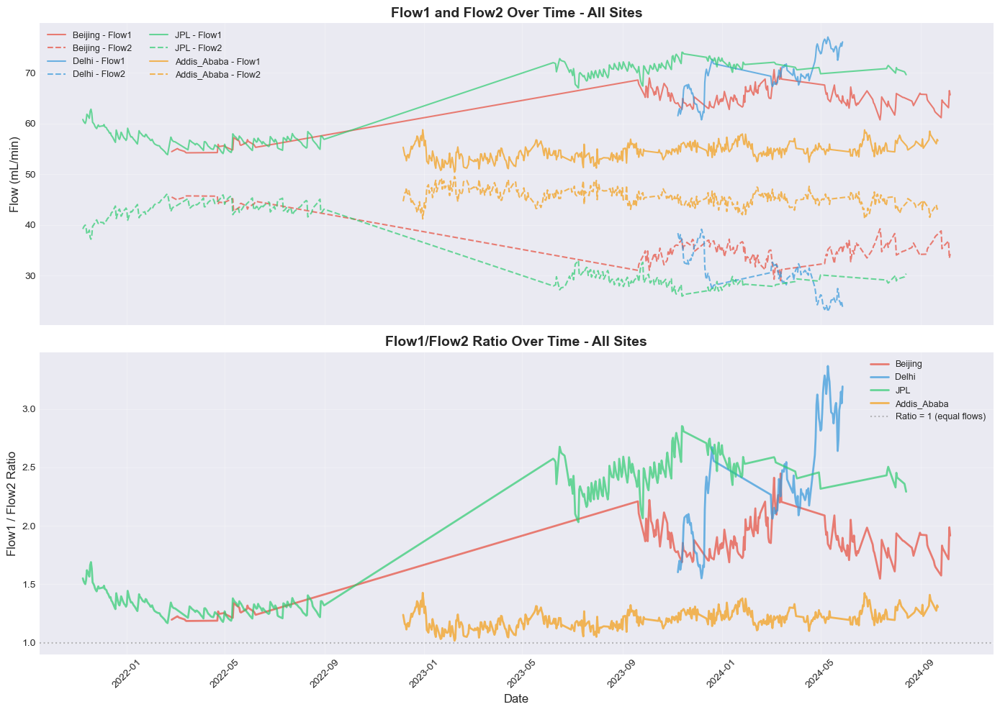

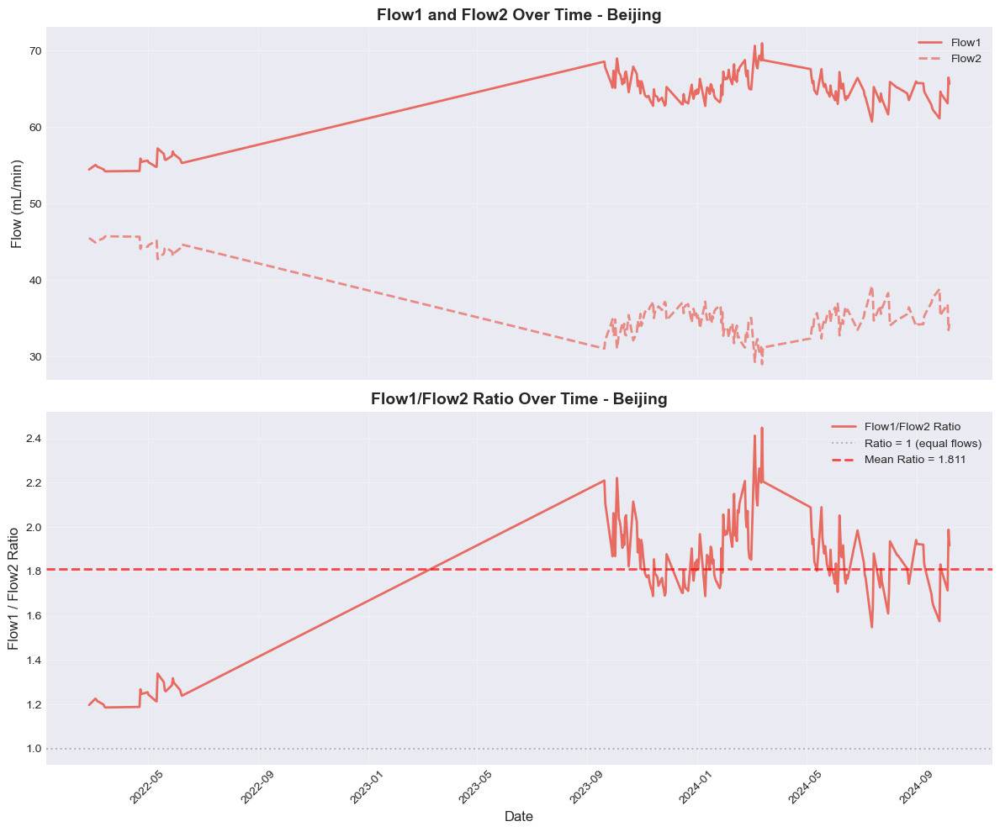


Beijing Flow Statistics:
  Flow1 - Mean: 64.10 mL/min, Median: 64.70 mL/min, Std: 3.52 mL/min
  Flow2 - Mean: 35.88 mL/min, Median: 35.29 mL/min, Std: 3.52 mL/min
  Flow1/Flow2 Ratio - Mean: 1.811, Median: 1.833, Std: 0.247
  Flow1/Flow2 Ratio - Min: 1.186, Max: 2.448


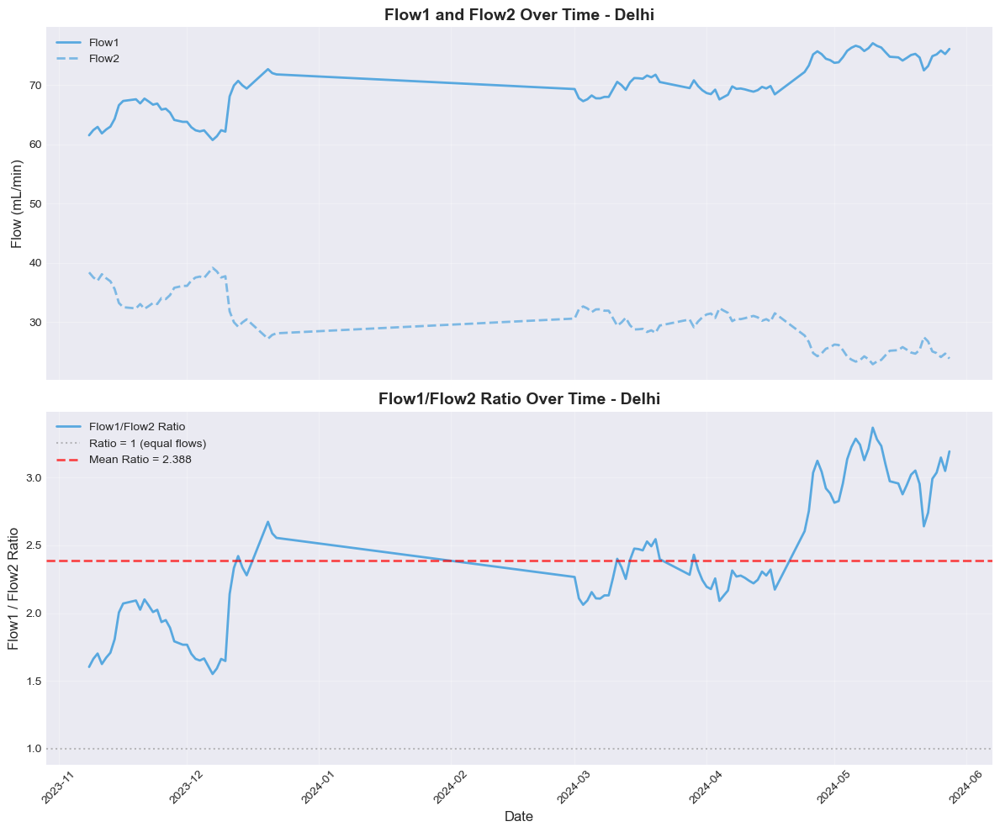


Delhi Flow Statistics:
  Flow1 - Mean: 69.82 mL/min, Median: 69.45 mL/min, Std: 4.36 mL/min
  Flow2 - Mean: 30.12 mL/min, Median: 30.46 mL/min, Std: 4.34 mL/min
  Flow1/Flow2 Ratio - Mean: 2.388, Median: 2.279, Std: 0.491
  Flow1/Flow2 Ratio - Min: 1.551, Max: 3.368


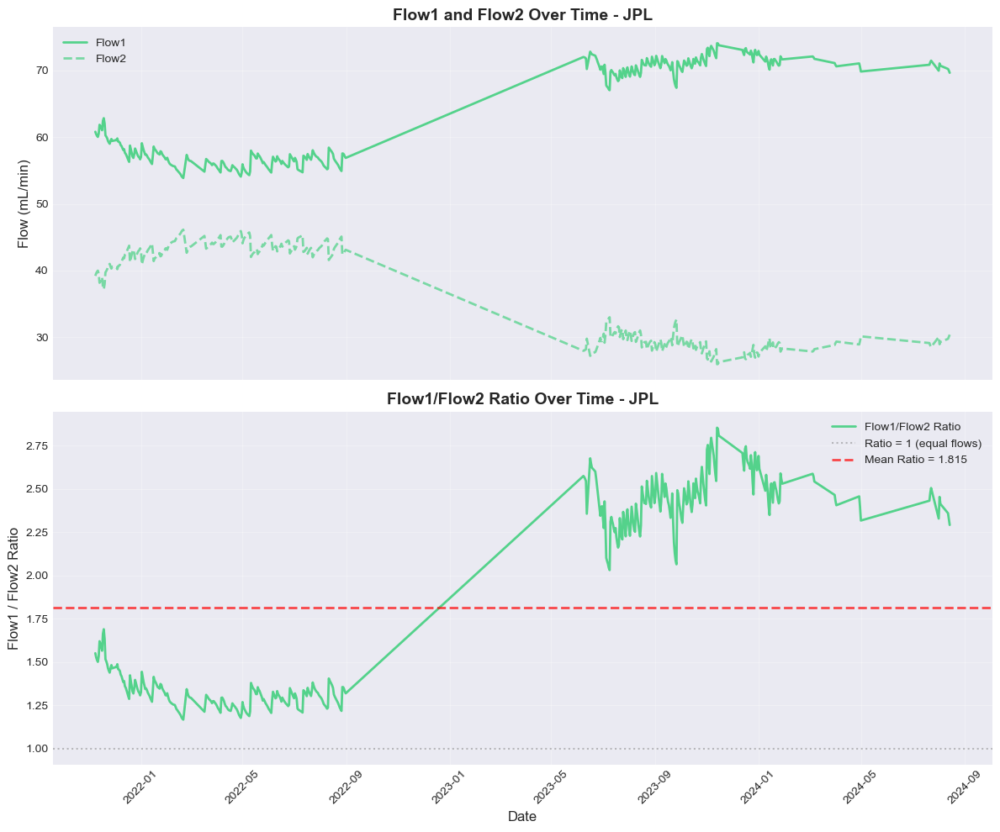


JPL Flow Statistics:
  Flow1 - Mean: 63.01 mL/min, Median: 58.74 mL/min, Std: 7.23 mL/min
  Flow2 - Mean: 37.00 mL/min, Median: 41.26 mL/min, Std: 7.22 mL/min
  Flow1/Flow2 Ratio - Mean: 1.815, Median: 1.424, Std: 0.578
  Flow1/Flow2 Ratio - Min: 1.168, Max: 2.854


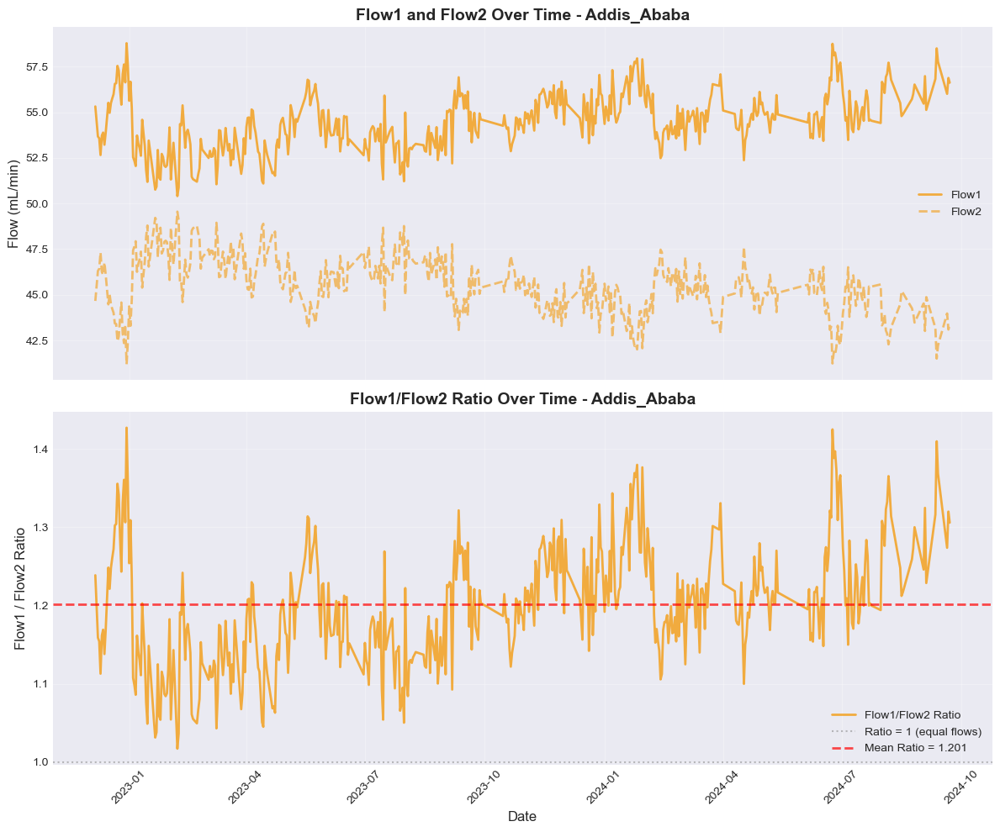


Addis_Ababa Flow Statistics:
  Flow1 - Mean: 54.51 mL/min, Median: 54.54 mL/min, Std: 1.53 mL/min
  Flow2 - Mean: 45.48 mL/min, Median: 45.46 mL/min, Std: 1.53 mL/min
  Flow1/Flow2 Ratio - Mean: 1.201, Median: 1.200, Std: 0.074
  Flow1/Flow2 Ratio - Min: 1.017, Max: 1.427


In [72]:
# Create combined plot with all sites showing Flow1, Flow2, and their ratio

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    
    # Check if flow columns exist
    has_flow1 = 'Flow1 (mL/min)' in df.columns
    has_flow2 = 'Flow2 (mL/min)' in df.columns
    
    if has_flow1 and has_flow2:
        # Plot Flow1 and Flow2
        valid_data = df[(df['Flow1 (mL/min)'].notna()) & (df['Flow2 (mL/min)'].notna())].copy()
        
        if len(valid_data) > 0:
            ax1.plot(valid_data['day_9am'], valid_data['Flow1 (mL/min)'], 
                    color=config['color'], label=f"{site_name} - Flow1", 
                    alpha=0.7, linewidth=1.5, linestyle='-')
            ax1.plot(valid_data['day_9am'], valid_data['Flow2 (mL/min)'], 
                    color=config['color'], label=f"{site_name} - Flow2", 
                    alpha=0.7, linewidth=1.5, linestyle='--')
            
            # Calculate and plot Flow1/Flow2 ratio
            valid_data['flow_ratio'] = valid_data['Flow1 (mL/min)'] / valid_data['Flow2 (mL/min)']
            ax2.plot(valid_data['day_9am'], valid_data['flow_ratio'], 
                    color=config['color'], label=f"{site_name}", 
                    alpha=0.7, linewidth=2)

ax1.set_ylabel('Flow (mL/min)', fontsize=12)
ax1.set_title("Flow1 and Flow2 Over Time - All Sites", fontsize=14, fontweight='bold')
ax1.legend(loc='best', fontsize=9, ncol=2)
ax1.grid(True, alpha=0.3)

ax2.axhline(y=1, color='gray', linestyle=':', alpha=0.5, linewidth=1.5, label='Ratio = 1 (equal flows)')
ax2.set_xlabel('Date', fontsize=12)
ax2.set_ylabel('Flow1 / Flow2 Ratio', fontsize=12)
ax2.set_title("Flow1/Flow2 Ratio Over Time - All Sites", fontsize=14, fontweight='bold')
ax2.legend(loc='best', fontsize=9)
ax2.grid(True, alpha=0.3)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Create individual plots for each site
for site_name, df in aethalometer_data.items():
    config = SITES[site_name]
    
    # Check if flow data exists
    has_flow1 = 'Flow1 (mL/min)' in df.columns
    has_flow2 = 'Flow2 (mL/min)' in df.columns
    
    if has_flow1 and has_flow2:
        valid_data = df[(df['Flow1 (mL/min)'].notna()) & (df['Flow2 (mL/min)'].notna())].copy()
        
        if len(valid_data) > 0:
            valid_data['flow_ratio'] = valid_data['Flow1 (mL/min)'] / valid_data['Flow2 (mL/min)']
            
            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
            
            # Plot Flow1 and Flow2
            ax1.plot(valid_data['day_9am'], valid_data['Flow1 (mL/min)'], 
                    color=config['color'], label='Flow1', 
                    alpha=0.8, linewidth=2, linestyle='-')
            ax1.plot(valid_data['day_9am'], valid_data['Flow2 (mL/min)'], 
                    color=config['color'], label='Flow2', 
                    alpha=0.6, linewidth=2, linestyle='--')
            
            ax1.set_ylabel('Flow (mL/min)', fontsize=12)
            ax1.set_title(f"Flow1 and Flow2 Over Time - {site_name}", fontsize=14, fontweight='bold')
            ax1.legend(loc='best')
            ax1.grid(True, alpha=0.3)
            
            # Plot Flow1/Flow2 ratio
            ax2.plot(valid_data['day_9am'], valid_data['flow_ratio'], 
                    color=config['color'], label='Flow1/Flow2 Ratio', 
                    alpha=0.8, linewidth=2)
            ax2.axhline(y=1, color='gray', linestyle=':', alpha=0.5, linewidth=1.5, 
                       label='Ratio = 1 (equal flows)')
            
            # Add mean ratio line
            mean_ratio = valid_data['flow_ratio'].mean()
            ax2.axhline(y=mean_ratio, color='red', linestyle='--', alpha=0.7, linewidth=2, 
                       label=f'Mean Ratio = {mean_ratio:.3f}')
            
            ax2.set_xlabel('Date', fontsize=12)
            ax2.set_ylabel('Flow1 / Flow2 Ratio', fontsize=12)
            ax2.set_title(f"Flow1/Flow2 Ratio Over Time - {site_name}", fontsize=14, fontweight='bold')
            ax2.legend(loc='best')
            ax2.grid(True, alpha=0.3)
            ax2.tick_params(axis='x', rotation=45)
            
            plt.tight_layout()
            plt.show()
            
            # Print statistics
            print(f"\n{site_name} Flow Statistics:")
            print(f"  Flow1 - Mean: {valid_data['Flow1 (mL/min)'].mean():.2f} mL/min, "
                  f"Median: {valid_data['Flow1 (mL/min)'].median():.2f} mL/min, "
                  f"Std: {valid_data['Flow1 (mL/min)'].std():.2f} mL/min")
            print(f"  Flow2 - Mean: {valid_data['Flow2 (mL/min)'].mean():.2f} mL/min, "
                  f"Median: {valid_data['Flow2 (mL/min)'].median():.2f} mL/min, "
                  f"Std: {valid_data['Flow2 (mL/min)'].std():.2f} mL/min")
            print(f"  Flow1/Flow2 Ratio - Mean: {valid_data['flow_ratio'].mean():.3f}, "
                  f"Median: {valid_data['flow_ratio'].median():.3f}, "
                  f"Std: {valid_data['flow_ratio'].std():.3f}")
            print(f"  Flow1/Flow2 Ratio - Min: {valid_data['flow_ratio'].min():.3f}, "
                  f"Max: {valid_data['flow_ratio'].max():.3f}")
    else:
        print(f"\n{site_name}: Flow data not available")

## 8. Flow Ratio Analysis (Flow1/Flow2)

Analysis of dual-spot flow measurements and their ratio over time.

In [73]:
def create_correlation_scatter(ax, x_data, y_data, x_label, y_label, color='blue', site_name='', equal_axes=False):
    """
    Create a scatter plot with linear regression, R², and statistics
    
    Parameters:
    -----------
    ax : matplotlib axis
    x_data : array-like
    y_data : array-like
    x_label : str
    y_label : str
    color : str
    site_name : str
    equal_axes : bool - if True, set equal limits for x and y axes (1:1 aspect)
    
    Returns:
    --------
    dict with statistics (r2, slope, intercept, n, corr)
    """
    # Remove NaN values
    mask = (~np.isnan(x_data)) & (~np.isnan(y_data))
    x = x_data[mask]
    y = y_data[mask]
    
    if len(x) < 3:
        ax.text(0.5, 0.5, 'Insufficient data\nfor correlation', 
                transform=ax.transAxes, ha='center', va='center', fontsize=12)
        return None
    
    # Scatter plot
    ax.scatter(x, y, alpha=0.6, s=60, color=color, edgecolors='white', linewidth=0.5)
    
    # Linear regression
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    slope, intercept = z[0], z[1]
    
    # Plot regression line
    x_line = np.linspace(x.min(), x.max(), 100)
    ax.plot(x_line, p(x_line), 'r--', linewidth=2, alpha=0.8, label='Best fit')
    
    # Add 1:1 line if axes should be equal
    if equal_axes:
        # Set equal limits
        all_vals = np.concatenate([x, y])
        min_val = max(0, all_vals.min() * 0.95)  # Start from 0 or slightly below min
        max_val = all_vals.max() * 1.05
        
        ax.set_xlim(min_val, max_val)
        ax.set_ylim(min_val, max_val)
        ax.set_aspect('equal', adjustable='box')
        
        # Plot 1:1 line
        ax.plot([min_val, max_val], [min_val, max_val], 'k:', linewidth=1.5, alpha=0.5, label='1:1 line')
    
    # Calculate R² and correlation
    corr = np.corrcoef(x, y)[0, 1]
    r2 = corr**2
    n = len(x)
    
    # Add statistics text box
    stats_text = f'n = {n}\nR² = {r2:.3f}\nSlope = {slope:.3f}\ny = {slope:.3f}x + {intercept:.2f}'
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax.set_xlabel(x_label, fontsize=11)
    ax.set_ylabel(y_label, fontsize=11)
    ax.grid(True, alpha=0.3)
    ax.legend(loc='lower right', fontsize=8)
    
    return {'r2': r2, 'slope': slope, 'intercept': intercept, 'n': n, 'corr': corr}


def match_filter_to_aeth_data(site_name, site_code, df_aeth, filter_params):
    """
    Match filter data to aethalometer data by date (±1 day tolerance)
    
    Parameters:
    -----------
    site_name : str
    site_code : str
    df_aeth : DataFrame with aethalometer data
    filter_params : list of parameter names to extract from filter data
    
    Returns:
    --------
    DataFrame with matched data
    """
    # Get filter data for this site
    site_filters = filter_data[filter_data['Site'] == site_code].copy()
    
    # Pivot filter data to have one row per date with different parameters as columns
    matched_records = []
    
    for _, aeth_row in df_aeth.iterrows():
        aeth_date = aeth_row['day_9am']
        
        # Find filter samples within ±1 day
        date_match = site_filters[
            (site_filters['SampleDate'] >= aeth_date - pd.Timedelta(days=1)) &
            (site_filters['SampleDate'] <= aeth_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0:
            # Create a record combining aethalometer and filter data
            record = {
                'date': aeth_date,
                'Red BCc': aeth_row.get('Red BCc', np.nan),
                'IR BCc': aeth_row.get('IR BCc', np.nan),
                'Red BCc smoothed': aeth_row.get('Red BCc smoothed', np.nan),
                'IR BCc smoothed': aeth_row.get('IR BCc smoothed', np.nan)
            }
            
            # Add filter parameters
            for param in filter_params:
                param_data = date_match[date_match['Parameter'] == param]
                if len(param_data) > 0:
                    # Use mean if multiple measurements
                    if param == 'ChemSpec_Iron_PM2.5':
                        # Iron is in ng/m³, keep as is
                        record['Iron'] = param_data['Concentration'].mean()
                    elif param == 'EC_ftir':
                        # EC in ug/m³
                        record['EC_ftir'] = param_data['Concentration'].mean()
                    elif param == 'HIPS_Fabs':
                        # Fabs in Mm^-1
                        record['HIPS_Fabs'] = param_data['Concentration'].mean()
            
            matched_records.append(record)
    
    return pd.DataFrame(matched_records)


print("Correlation analysis functions defined!")

Correlation analysis functions defined!


## 9. Correlation Analysis: BCc, FTIR EC, HIPS Fabs, and Iron

Scatter plot analysis comparing aethalometer measurements with filter-based measurements for each site.


CORRELATION ANALYSIS - Beijing
✓ Matched 590 days with overlapping measurements
  Filtered out 128 samples with EC < 0.5 µg/m³ (below MDL)
  Remaining samples: 462
  Red BCc vs FTIR EC            : Insufficient data (n=0)
  Red BCc vs Iron               : Insufficient data (n=0)


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/2567175070.py:84: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


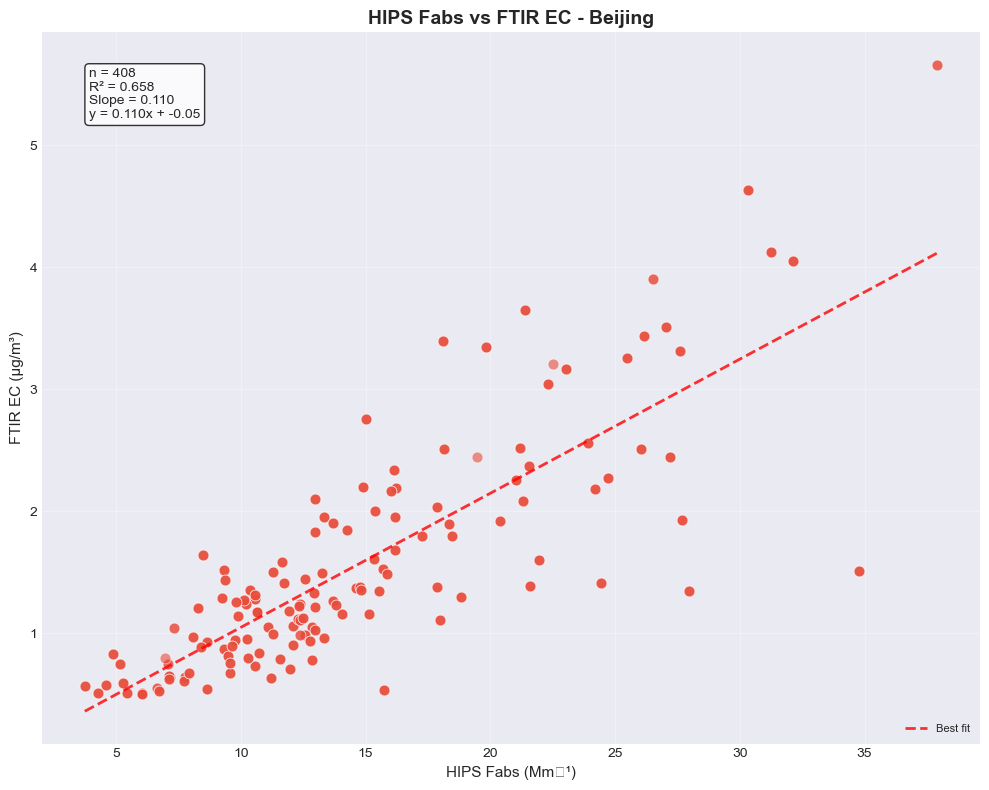

  HIPS Fabs vs FTIR EC          : R² = 0.658, Slope =    0.110, n = 408


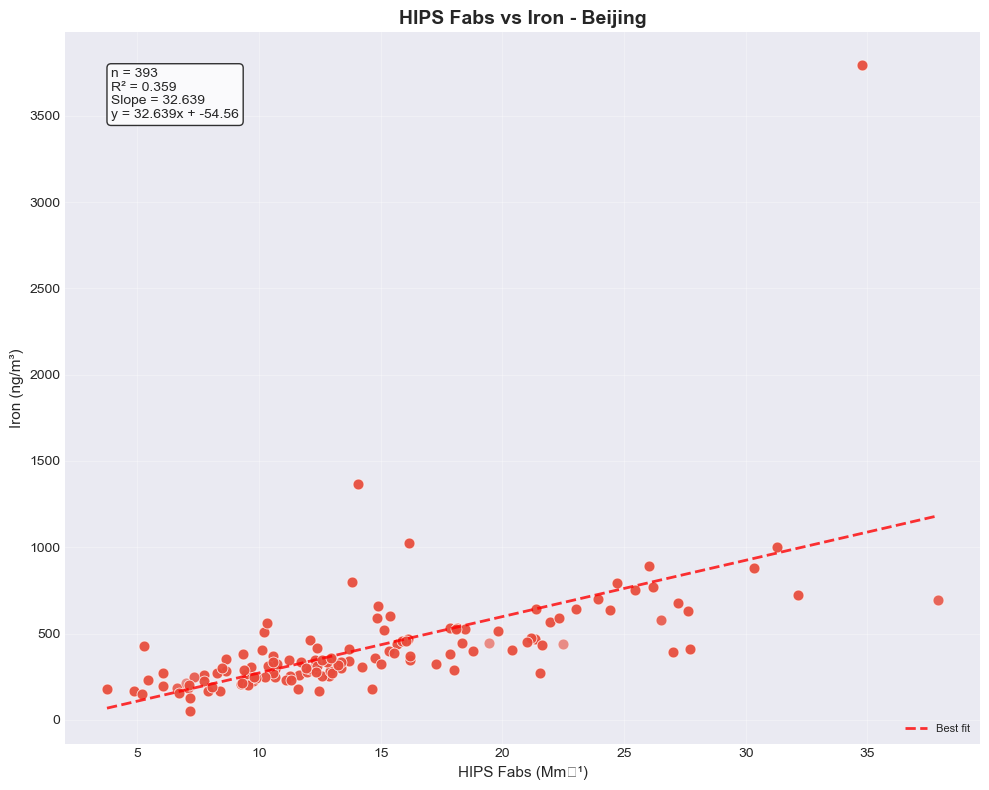

  HIPS Fabs vs Iron             : R² = 0.359, Slope =   32.639, n = 393


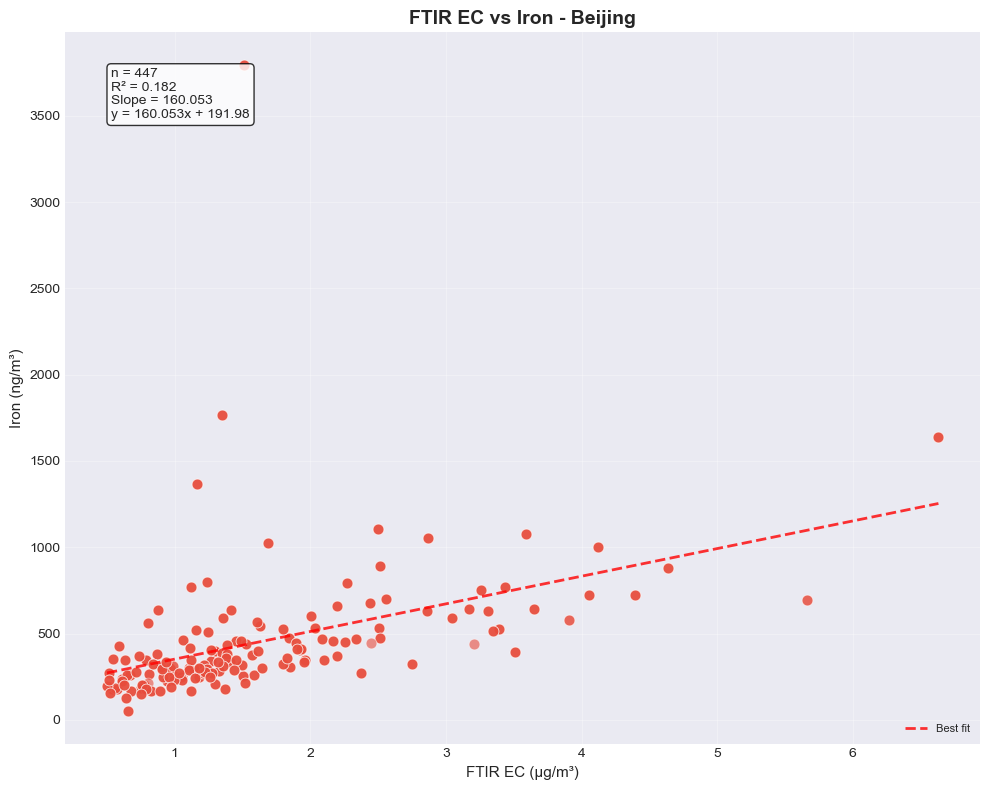

  FTIR EC vs Iron               : R² = 0.182, Slope =  160.053, n = 447

Beijing - Correlation Summary:
Comparison                           R²      Slope     n
-------------------------------------------------------
HIPS Fabs vs FTIR EC              0.658      0.110   408
HIPS Fabs vs Iron                 0.359     32.639   393
FTIR EC vs Iron                   0.182    160.053   447

✓ Analysis complete for Beijing


CORRELATION ANALYSIS - Delhi
✓ Matched 289 days with overlapping measurements
  Filtered out 115 samples with EC < 0.5 µg/m³ (below MDL)
  Remaining samples: 174
  Red BCc vs FTIR EC            : Insufficient data (n=0)
  Red BCc vs Iron               : Insufficient data (n=0)


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/2567175070.py:84: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


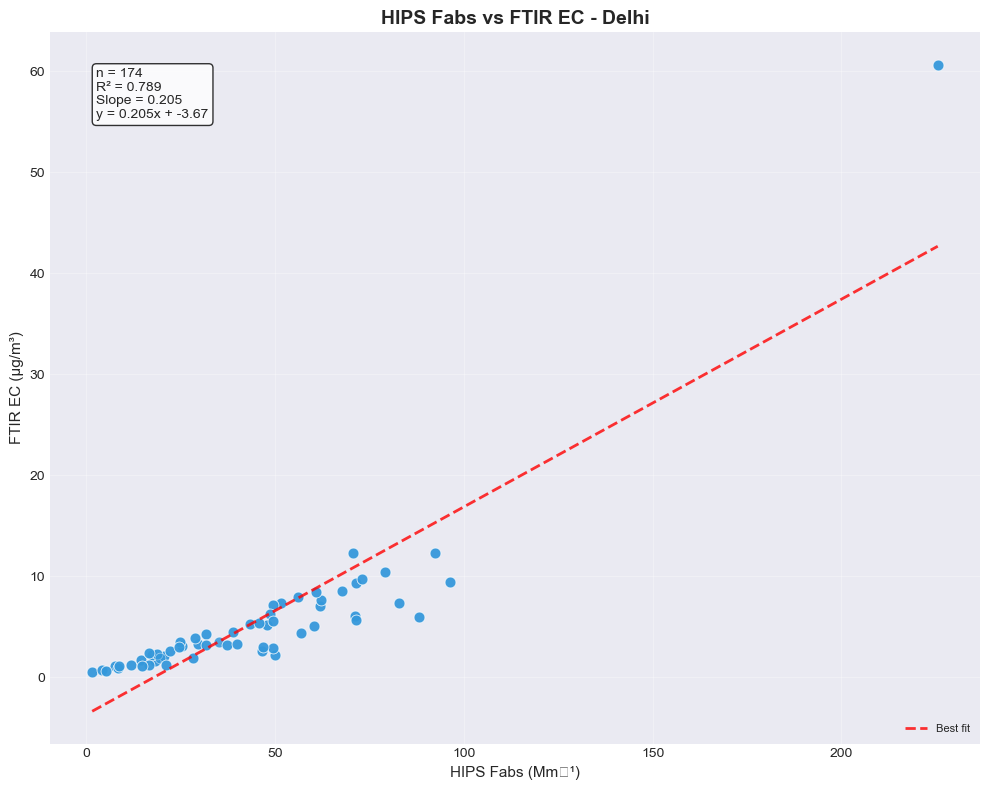

  HIPS Fabs vs FTIR EC          : R² = 0.789, Slope =    0.205, n = 174


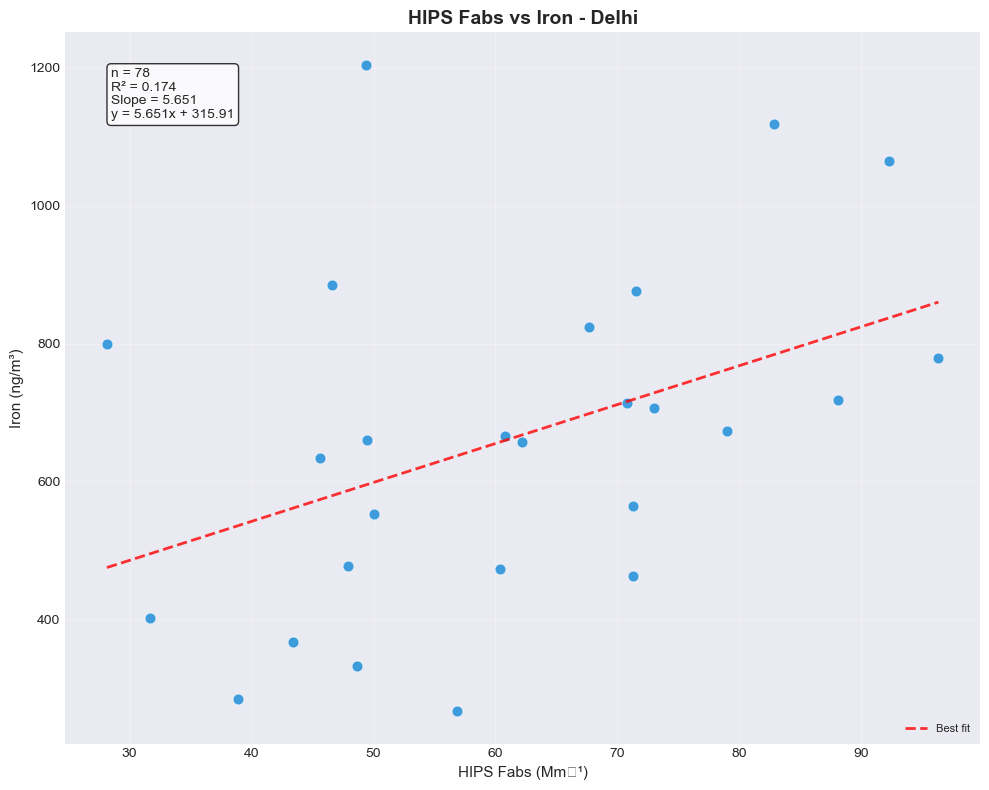

  HIPS Fabs vs Iron             : R² = 0.174, Slope =    5.651, n = 78


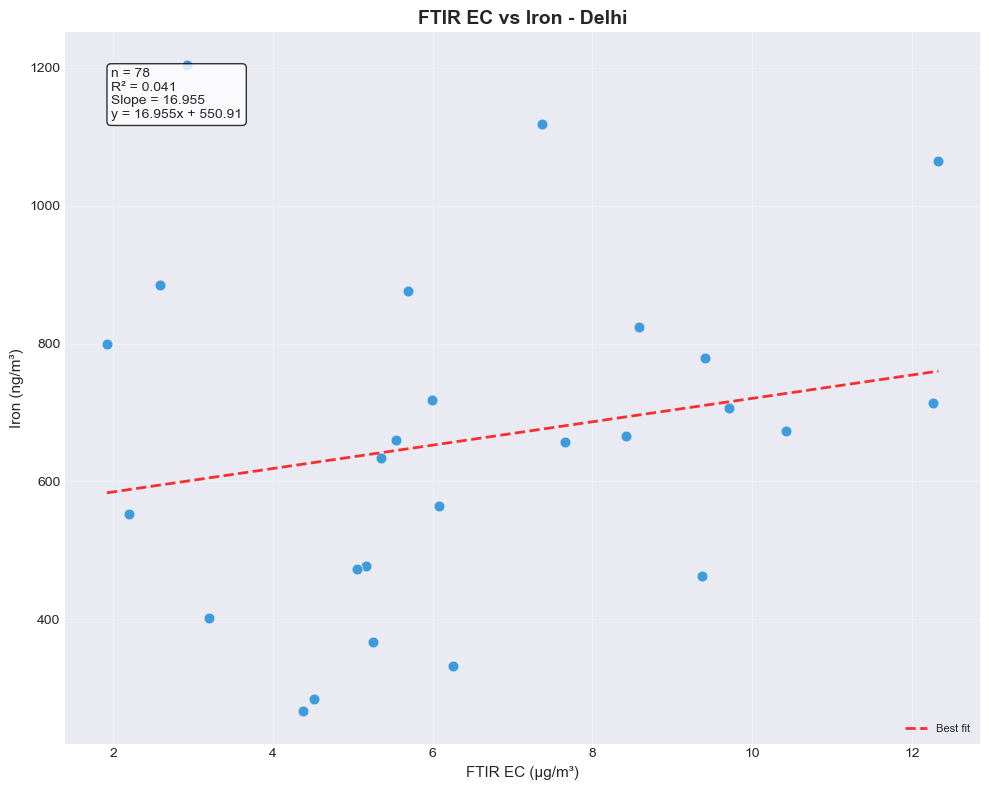

  FTIR EC vs Iron               : R² = 0.041, Slope =   16.955, n = 78

Delhi - Correlation Summary:
Comparison                           R²      Slope     n
-------------------------------------------------------
HIPS Fabs vs FTIR EC              0.789      0.205   174
HIPS Fabs vs Iron                 0.174      5.651    78
FTIR EC vs Iron                   0.041     16.955    78

✓ Analysis complete for Delhi


CORRELATION ANALYSIS - JPL
✓ Matched 765 days with overlapping measurements
  Filtered out 567 samples with EC < 0.5 µg/m³ (below MDL)
  Remaining samples: 198
  Red BCc vs FTIR EC            : Insufficient data (n=0)
  Red BCc vs Iron               : Insufficient data (n=0)


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/2567175070.py:84: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


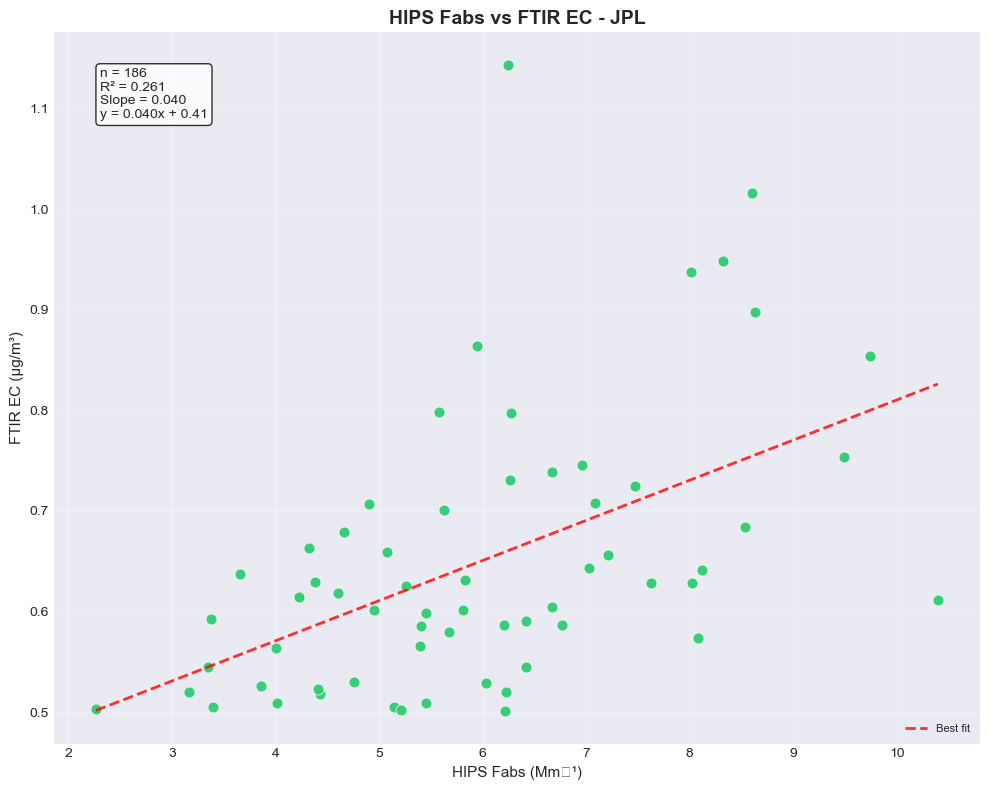

  HIPS Fabs vs FTIR EC          : R² = 0.261, Slope =    0.040, n = 186


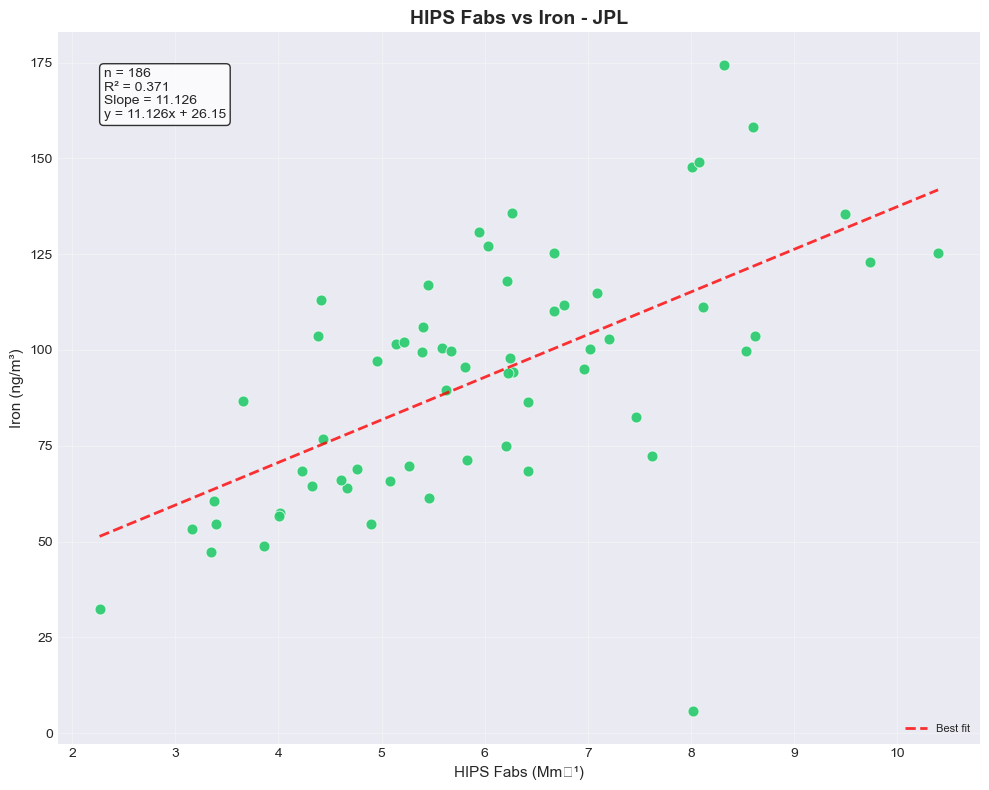

  HIPS Fabs vs Iron             : R² = 0.371, Slope =   11.126, n = 186


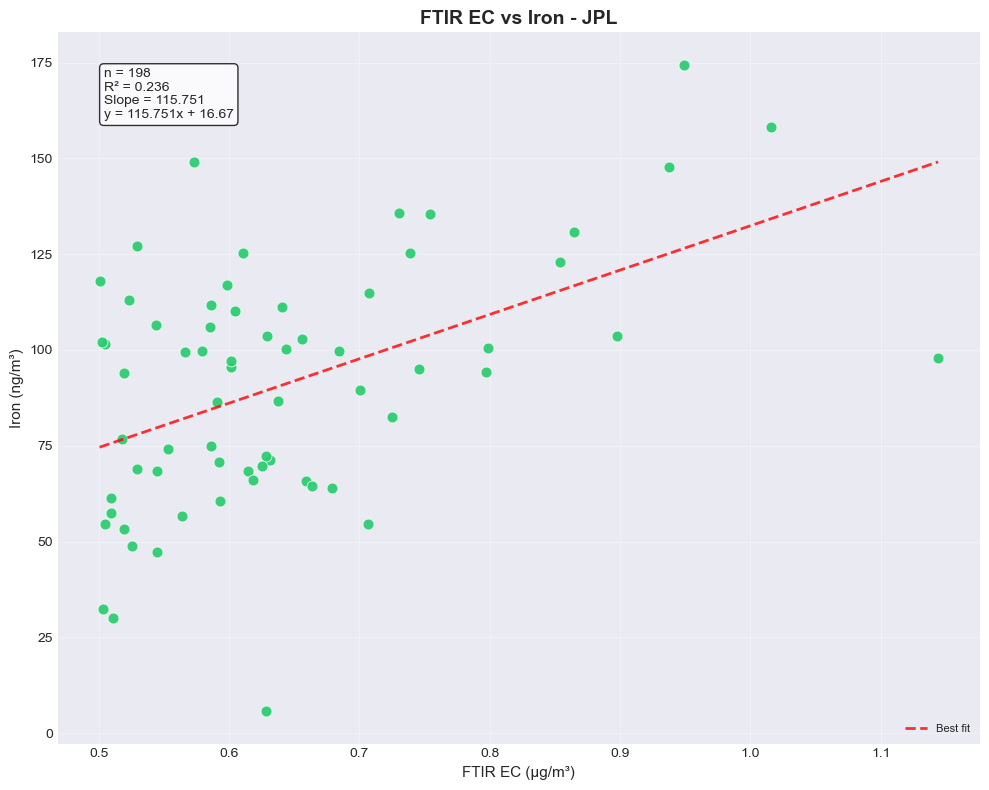

  FTIR EC vs Iron               : R² = 0.236, Slope =  115.751, n = 198

JPL - Correlation Summary:
Comparison                           R²      Slope     n
-------------------------------------------------------
HIPS Fabs vs FTIR EC              0.261      0.040   186
HIPS Fabs vs Iron                 0.371     11.126   186
FTIR EC vs Iron                   0.236    115.751   198

✓ Analysis complete for JPL


CORRELATION ANALYSIS - Addis_Ababa
✓ Matched 515 days with overlapping measurements


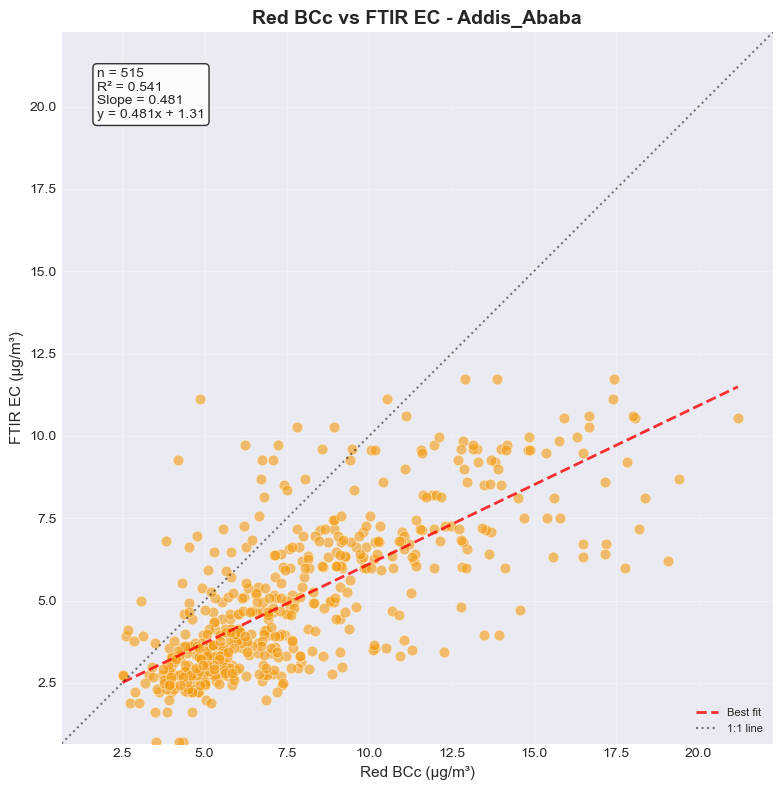

  Red BCc vs FTIR EC            : R² = 0.541, Slope =    0.481, n = 515


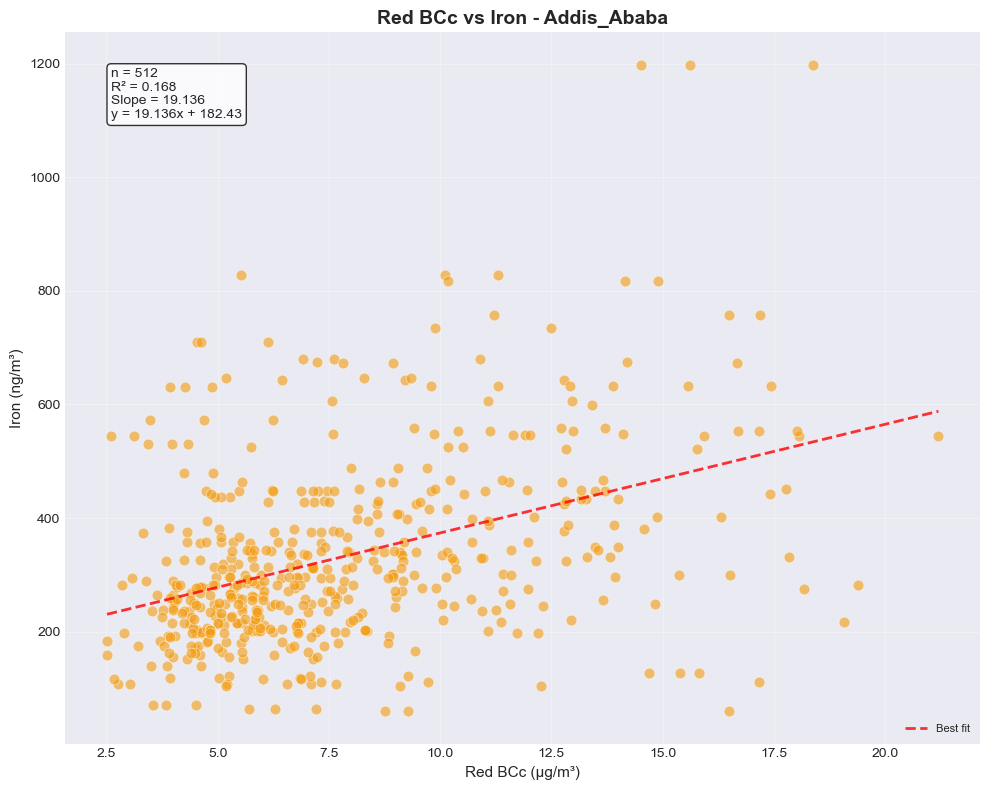

  Red BCc vs Iron               : R² = 0.168, Slope =   19.136, n = 512


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/2567175070.py:84: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


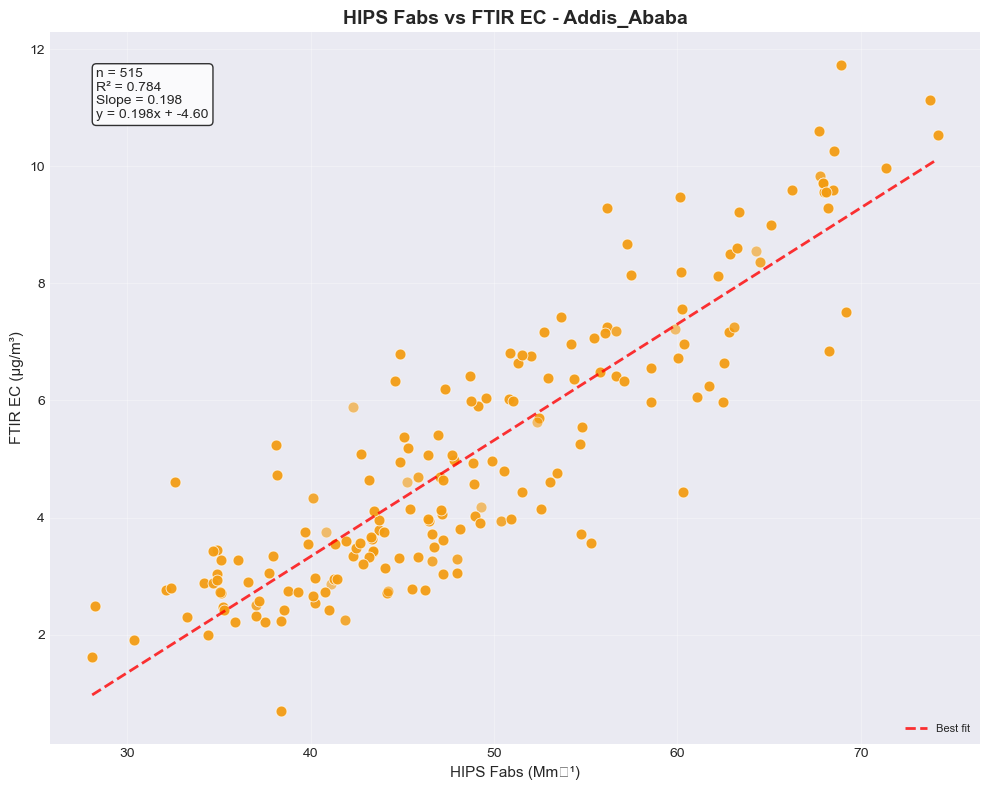

  HIPS Fabs vs FTIR EC          : R² = 0.784, Slope =    0.198, n = 515


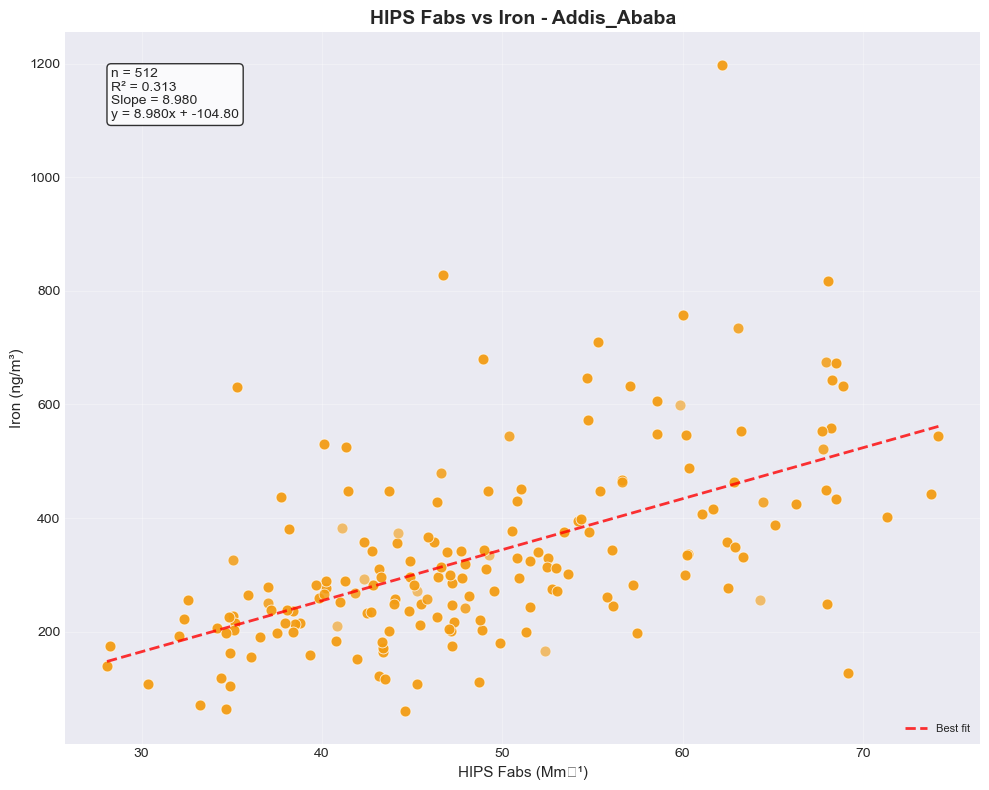

  HIPS Fabs vs Iron             : R² = 0.313, Slope =    8.980, n = 512


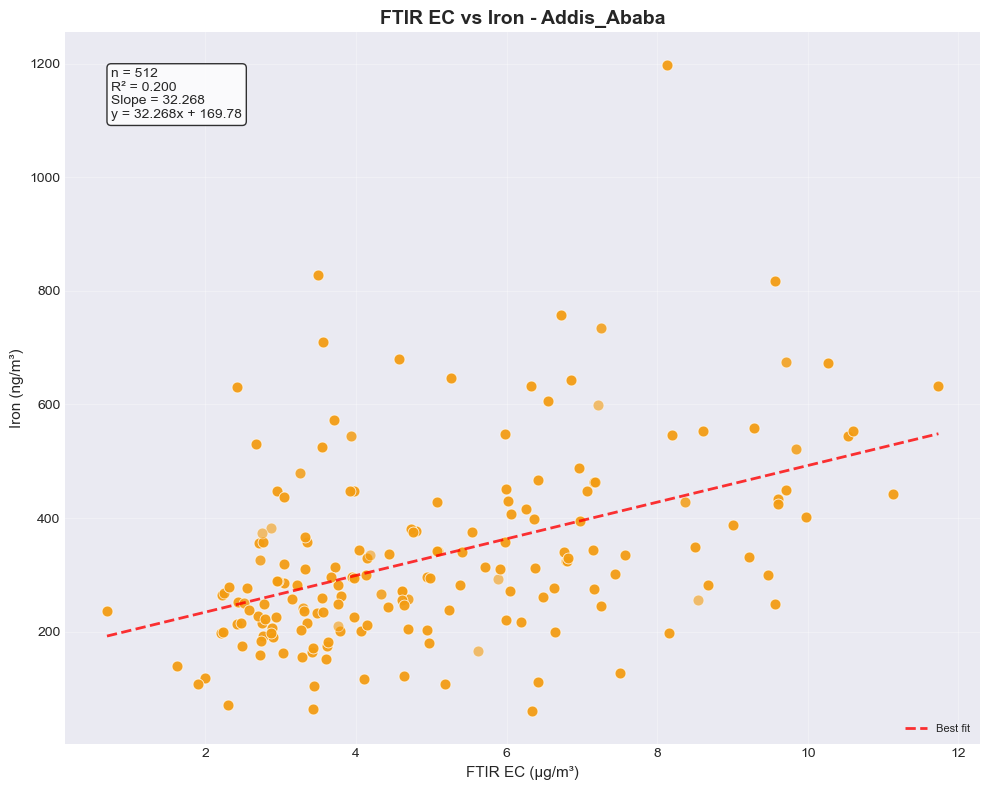

  FTIR EC vs Iron               : R² = 0.200, Slope =   32.268, n = 512

Addis_Ababa - Correlation Summary:
Comparison                           R²      Slope     n
-------------------------------------------------------
Red BCc vs FTIR EC                0.541      0.481   515
Red BCc vs Iron                   0.168     19.136   512
HIPS Fabs vs FTIR EC              0.784      0.198   515
HIPS Fabs vs Iron                 0.313      8.980   512
FTIR EC vs Iron                   0.200     32.268   512

✓ Analysis complete for Addis_Ababa



In [74]:
# Create correlation plots for each site
filter_params_needed = ['EC_ftir', 'HIPS_Fabs', 'ChemSpec_Iron_PM2.5']

# Define the correlations to analyze
# equal_axes=True for plots where x and y have same units (BCc vs EC)
correlations = [
    {'x': 'Red BCc smoothed', 'y': 'EC_ftir', 'xlabel': 'Red BCc (μg/m³)', 'ylabel': 'FTIR EC (μg/m³)', 'title': 'Red BCc vs FTIR EC', 'equal_axes': True},
    {'x': 'Red BCc smoothed', 'y': 'Iron', 'xlabel': 'Red BCc (μg/m³)', 'ylabel': 'Iron (ng/m³)', 'title': 'Red BCc vs Iron', 'equal_axes': False},
    {'x': 'HIPS_Fabs', 'y': 'EC_ftir', 'xlabel': 'HIPS Fabs (Mm⁻¹)', 'ylabel': 'FTIR EC (μg/m³)', 'title': 'HIPS Fabs vs FTIR EC', 'equal_axes': False},
    {'x': 'HIPS_Fabs', 'y': 'Iron', 'xlabel': 'HIPS Fabs (Mm⁻¹)', 'ylabel': 'Iron (ng/m³)', 'title': 'HIPS Fabs vs Iron', 'equal_axes': False},
    {'x': 'EC_ftir', 'y': 'Iron', 'xlabel': 'FTIR EC (μg/m³)', 'ylabel': 'Iron (ng/m³)', 'title': 'FTIR EC vs Iron', 'equal_axes': False}
]

# Analyze each site
for site_name, df_aeth in aethalometer_data.items():
    config = SITES[site_name]
    site_code = config['code']
    
    print(f"\n{'='*80}")
    print(f"CORRELATION ANALYSIS - {site_name}")
    print(f"{'='*80}")
    
    # Match filter data to aethalometer data
    matched_df = match_filter_to_aeth_data(site_name, site_code, df_aeth, filter_params_needed)
    
    if len(matched_df) == 0:
        print(f"❌ No matched data available for {site_name}")
        continue
    
    print(f"✓ Matched {len(matched_df)} days with overlapping measurements")
    
    # Convert BCc from ng/m³ to μg/m³ if needed (check magnitude)
    for col in ['Red BCc', 'IR BCc', 'Red BCc smoothed', 'IR BCc smoothed']:
        if col in matched_df.columns:
            mean_val = matched_df[col].mean()
            if pd.notna(mean_val) and mean_val > 100:  # Likely in ng/m³
                matched_df[col] = matched_df[col] / 1000.0
    
    # Filter out low EC values (< 0.5 µg/m³) - below MDL
    if 'EC_ftir' in matched_df.columns:
        initial_count = len(matched_df)
        matched_df = matched_df[matched_df['EC_ftir'] >= 0.5].copy()
        filtered_count = initial_count - len(matched_df)
        if filtered_count > 0:
            print(f"  Filtered out {filtered_count} samples with EC < 0.5 µg/m³ (below MDL)")
            print(f"  Remaining samples: {len(matched_df)}")
    
    # Store statistics for summary
    stats_summary = []
    
    # Create each correlation plot as a separate figure
    for corr_config in correlations:
        
        # Check if data columns exist
        if corr_config['x'] not in matched_df.columns or corr_config['y'] not in matched_df.columns:
            print(f"  {corr_config['title']:30s}: Data not available")
            continue
        
        # Get data (only non-NaN pairs)
        x_data = matched_df[corr_config['x']].values
        y_data = matched_df[corr_config['y']].values
        
        # Count valid pairs
        valid_mask = (~np.isnan(x_data)) & (~np.isnan(y_data))
        n_valid = valid_mask.sum()
        
        if n_valid < 3:
            print(f"  {corr_config['title']:30s}: Insufficient data (n={n_valid})")
            continue
        
        # Create individual figure for this correlation
        fig, ax = plt.subplots(figsize=(10, 8))
        
        # Create scatter plot
        stats = create_correlation_scatter(
            ax, x_data, y_data,
            corr_config['xlabel'], corr_config['ylabel'],
            color=config['color'], site_name=site_name,
            equal_axes=corr_config.get('equal_axes', False)
        )
        
        ax.set_title(f"{corr_config['title']} - {site_name}", fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        plt.show()
        
        # Store stats and print
        if stats:
            stats_summary.append({
                'comparison': corr_config['title'],
                **stats
            })
            print(f"  {corr_config['title']:30s}: R² = {stats['r2']:.3f}, Slope = {stats['slope']:8.3f}, n = {stats['n']}")
    
    # Print summary table
    if len(stats_summary) > 0:
        print(f"\n{site_name} - Correlation Summary:")
        print(f"{'Comparison':<30s} {'R²':>8s} {'Slope':>10s} {'n':>5s}")
        print("-" * 55)
        
        for stat in stats_summary:
            print(f"{stat['comparison']:<30s} {stat['r2']:>8.3f} {stat['slope']:>10.3f} {stat['n']:>5d}")
    
    print(f"\n✓ Analysis complete for {site_name}\n")

## 9. Correlation Analysis: BCc, FTIR EC, HIPS Fabs, and Iron

Scatter plot analysis comparing aethalometer measurements with filter-based measurements for each site.

# Cross-Comparison Analysis: HIPS, FTIR EC, Iron, and Aethalometer

This section creates cross-plots comparing different measurement methods:

1. **HIPS Fabs vs Iron**
2. **HIPS Fabs vs FTIR EC**
3. **FTIR EC vs Iron**
4. **Aethalometer IR BCc vs Iron**
5. **HIPS Fabs vs Aethalometer IR BCc**

## Unit Standardization

**IMPORTANT**: HIPS Fabs values are divided by 10 (MAC = 10 m²/g assumption) to convert 
from Mm⁻¹ to μg/m³ equivalent for comparison with EC measurements.

| Parameter | Original Units | Converted Units | Conversion |
|-----------|---------------|-----------------|------------|
| HIPS Fabs | Mm⁻¹ | μg/m³ | ÷ 10 (MAC=10) |
| FTIR EC | μg/m³ | μg/m³ | None |
| Iron | μg/m³ | μg/m³ | None |
| IR BCc | ng/m³ | μg/m³ | ÷ 1000 |

## Outlier Handling

Uses the **EXCLUDED_SAMPLES** centralized registry (Cell 31) for consistent outlier
detection across all analyses. Outliers are shown as red X markers.

---

In [ ]:
# =============================================================================
# CROSS-COMPARISON ANALYSIS CONFIGURATION
# =============================================================================

# MAC value for HIPS conversion (Fabs / MAC = BC equivalent in μg/m³)
MAC_VALUE = 10

print(f"MAC value for HIPS conversion: {MAC_VALUE} m²/g")
print("\nUsing EXCLUDED_SAMPLES registry for outlier detection")
print("(Threshold criteria defined in Cell 31)")
print("\nCurrent exclusion criteria:")
for site, config in EXCLUDED_SAMPLES.items():
    n_thresh = len(config.get('threshold_criteria', []))
    n_dates = len(config.get('date_exclusions', []))
    if n_thresh > 0 or n_dates > 0:
        print(f"  {site}: {n_thresh} threshold rule(s), {n_dates} date exclusion(s)")
    else:
        print(f"  {site}: No outliers defined")

# =============================================================================
# HELPER FUNCTIONS
# =============================================================================

def get_filter_parameter(filter_data, site_code, parameter_name):
    """
    Extract a specific parameter from filter data for a site.
    
    Returns DataFrame with 'SampleDate' and 'Concentration' columns.
    """
    param_data = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == parameter_name)
    ].copy()
    
    if len(param_data) == 0:
        return None
    
    return param_data[['SampleDate', 'Concentration', 'FilterId']].copy()


def match_all_parameters(site_name, site_code, df_aeth, filter_data):
    """
    Match all relevant parameters (HIPS, FTIR EC, Iron, Aethalometer) by date.
    
    Returns DataFrame with all matched measurements.
    """
    # Get filter parameters
    hips_data = get_filter_parameter(filter_data, site_code, 'HIPS_Fabs')
    ec_data = get_filter_parameter(filter_data, site_code, 'EC_ftir')
    iron_data = get_filter_parameter(filter_data, site_code, 'ChemSpec_Iron_PM2.5')
    
    # Get unique filter dates (from any parameter)
    all_filter_dates = set()
    if hips_data is not None:
        all_filter_dates.update(hips_data['SampleDate'].tolist())
    if ec_data is not None:
        all_filter_dates.update(ec_data['SampleDate'].tolist())
    if iron_data is not None:
        all_filter_dates.update(iron_data['SampleDate'].tolist())
    
    if len(all_filter_dates) == 0:
        print(f"  {site_name}: No filter data available")
        return None
    
    # Match each date to aethalometer and all filter parameters
    matched_records = []
    
    for filter_date in sorted(all_filter_dates):
        record = {'date': filter_date}
        
        # Match aethalometer data (±1 day)
        if df_aeth is not None and 'day_9am' in df_aeth.columns:
            date_match = df_aeth[
                (df_aeth['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
                (df_aeth['day_9am'] <= filter_date + pd.Timedelta(days=1))
            ]
            
            if len(date_match) > 0:
                # IR BCc (convert ng/m³ to μg/m³)
                if 'IR BCc' in date_match.columns and date_match['IR BCc'].notna().any():
                    record['ir_bcc'] = date_match['IR BCc'].mean() / 1000  # ng/m³ to μg/m³
        
        # Match HIPS Fabs (convert using MAC)
        if hips_data is not None:
            hips_match = hips_data[
                (hips_data['SampleDate'] >= filter_date - pd.Timedelta(days=1)) &
                (hips_data['SampleDate'] <= filter_date + pd.Timedelta(days=1))
            ]
            if len(hips_match) > 0 and hips_match['Concentration'].notna().any():
                record['hips_fabs'] = hips_match['Concentration'].mean() / MAC_VALUE
        
        # Match FTIR EC (already in μg/m³)
        if ec_data is not None:
            ec_match = ec_data[
                (ec_data['SampleDate'] >= filter_date - pd.Timedelta(days=1)) &
                (ec_data['SampleDate'] <= filter_date + pd.Timedelta(days=1))
            ]
            if len(ec_match) > 0 and ec_match['Concentration'].notna().any():
                record['ftir_ec'] = ec_match['Concentration'].mean()
        
        # Match Iron (already in μg/m³)
        if iron_data is not None:
            iron_match = iron_data[
                (iron_data['SampleDate'] >= filter_date - pd.Timedelta(days=1)) &
                (iron_data['SampleDate'] <= filter_date + pd.Timedelta(days=1))
            ]
            if len(iron_match) > 0 and iron_match['Concentration'].notna().any():
                record['iron'] = iron_match['Concentration'].mean()
        
        # Only add record if it has at least 2 parameters
        param_count = sum(1 for k in ['ir_bcc', 'hips_fabs', 'ftir_ec', 'iron'] if k in record)
        if param_count >= 2:
            matched_records.append(record)
    
    if len(matched_records) == 0:
        return None
    
    return pd.DataFrame(matched_records)


def flag_outliers_for_crossplots(matched_df, site_name):
    """
    Flag outliers using the CENTRALIZED EXCLUDED_SAMPLES registry.
    
    Handles unit conversions: EXCLUDED_SAMPLES uses ng/m³, cross-plots use μg/m³.
    """
    matched_df = matched_df.copy()
    matched_df['is_outlier'] = False
    matched_df['outlier_reason'] = ''
    
    site_config = EXCLUDED_SAMPLES.get(site_name, {})
    
    # Apply threshold-based criteria
    for criteria in site_config.get('threshold_criteria', []):
        crit_type = criteria.get('type', '')
        reason = criteria.get('reason', f'Threshold: {crit_type}')
        mask = pd.Series([False] * len(matched_df), index=matched_df.index)
        
        # Convert thresholds from ng/m³ to μg/m³ for comparison
        if crit_type == 'high_aeth':
            threshold_ug = criteria.get('aeth_bc_min', float('inf')) / 1000
            if 'ir_bcc' in matched_df.columns:
                mask = matched_df['ir_bcc'] > threshold_ug
                
        elif crit_type == 'high_aeth_low_ec':
            aeth_min_ug = criteria.get('aeth_bc_min', float('inf')) / 1000
            ec_max_ug = criteria.get('filter_ec_max', 0) / 1000
            if 'ir_bcc' in matched_df.columns and 'ftir_ec' in matched_df.columns:
                mask = (matched_df['ir_bcc'] > aeth_min_ug) & (matched_df['ftir_ec'] < ec_max_ug)
                
        elif crit_type == 'high_either':
            aeth_min_ug = criteria.get('aeth_bc_min', float('inf')) / 1000
            ec_min_ug = criteria.get('filter_ec_min', float('inf')) / 1000
            ir_mask = pd.Series([False] * len(matched_df), index=matched_df.index)
            ec_mask = pd.Series([False] * len(matched_df), index=matched_df.index)
            if 'ir_bcc' in matched_df.columns:
                ir_mask = matched_df['ir_bcc'] > aeth_min_ug
            if 'ftir_ec' in matched_df.columns:
                ec_mask = matched_df['ftir_ec'] > ec_min_ug
            mask = ir_mask | ec_mask
            
        elif crit_type == 'high_both':
            aeth_min_ug = criteria.get('aeth_bc_min', float('inf')) / 1000
            ec_min_ug = criteria.get('filter_ec_min', float('inf')) / 1000
            if 'ir_bcc' in matched_df.columns and 'ftir_ec' in matched_df.columns:
                mask = (matched_df['ir_bcc'] > aeth_min_ug) & (matched_df['ftir_ec'] > ec_min_ug)
        
        # Apply exclusion
        matched_df.loc[mask, 'is_outlier'] = True
        for idx in matched_df[mask].index:
            existing = matched_df.loc[idx, 'outlier_reason']
            if existing:
                matched_df.loc[idx, 'outlier_reason'] = f"{existing}; {reason}"
            else:
                matched_df.loc[idx, 'outlier_reason'] = reason
    
    # Apply date-based exclusions
    for exclusion in site_config.get('date_exclusions', []):
        excl_date = pd.to_datetime(exclusion['date'])
        excl_reason = exclusion.get('reason', 'Manual date exclusion')
        
        date_mask = (
            (matched_df['date'] >= excl_date - pd.Timedelta(days=1)) &
            (matched_df['date'] <= excl_date + pd.Timedelta(days=1))
        )
        
        matched_df.loc[date_mask, 'is_outlier'] = True
        for idx in matched_df[date_mask].index:
            existing = matched_df.loc[idx, 'outlier_reason']
            if existing:
                matched_df.loc[idx, 'outlier_reason'] = f"{existing}; {excl_reason}"
            else:
                matched_df.loc[idx, 'outlier_reason'] = excl_reason
    
    return matched_df


def plot_crossplot(ax, x_data, y_data, x_label, y_label, site_color, 
                   outlier_mask=None, show_mac_note=False, equal_axes=True):
    """
    Create a single cross-plot with regression statistics.
    Outliers shown as red X's.
    """
    # Remove NaN values
    valid_mask = (~np.isnan(x_data)) & (~np.isnan(y_data))
    
    if outlier_mask is not None:
        non_outlier_mask = valid_mask & ~outlier_mask
        outlier_plot_mask = valid_mask & outlier_mask
        
        x_clean = x_data[non_outlier_mask]
        y_clean = y_data[non_outlier_mask]
        x_outliers = x_data[outlier_plot_mask]
        y_outliers = y_data[outlier_plot_mask]
    else:
        x_clean = x_data[valid_mask]
        y_clean = y_data[valid_mask]
        x_outliers = np.array([])
        y_outliers = np.array([])
    
    if len(x_clean) < 3:
        ax.text(0.5, 0.5, 'Insufficient data\n(n < 3)', 
                transform=ax.transAxes, ha='center', va='center', fontsize=12)
        ax.set_xlabel(x_label, fontsize=11)
        ax.set_ylabel(y_label, fontsize=11)
        return None
    
    # Plot non-outlier data points
    ax.scatter(x_clean, y_clean, color=site_color, alpha=0.6, s=80,
              edgecolors='black', linewidth=1, label=f'Data (n={len(x_clean)})')
    
    # Plot outliers as red X's
    if len(x_outliers) > 0:
        ax.scatter(x_outliers, y_outliers, color='red', alpha=0.9, s=200, 
                  marker='X', linewidths=3, label=f'Outliers (n={len(x_outliers)})')
    
    # Linear regression on clean data
    coefficients = np.polyfit(x_clean, y_clean, 1)
    slope, intercept = coefficients
    correlation = np.corrcoef(x_clean, y_clean)[0, 1]
    r_squared = correlation ** 2
    
    # Calculate axis limits
    if equal_axes:
        all_vals = np.concatenate([x_clean, y_clean])
        if len(x_outliers) > 0:
            all_vals = np.concatenate([all_vals, x_outliers, y_outliers])
        max_val = all_vals.max() * 1.1
        min_val = 0
        
        ax.set_xlim(min_val, max_val)
        ax.set_ylim(min_val, max_val)
        ax.set_aspect('equal', adjustable='box')
        
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, 
               linewidth=1.5, label='1:1 line')
        x_line = np.array([min_val, max_val])
    else:
        ax.set_xlim(left=0)
        ax.set_ylim(bottom=0)
        x_line = np.array([0, x_clean.max() * 1.1])
    
    y_line = slope * x_line + intercept
    ax.plot(x_line, y_line, 'g-', linewidth=2, alpha=0.8, label='Best fit')
    
    # Stats text
    if intercept >= 0:
        eq = f"y = {slope:.3f}x + {intercept:.2f}"
    else:
        eq = f"y = {slope:.3f}x - {abs(intercept):.2f}"
    
    stats_text = f"n = {len(x_clean)}\nR² = {r_squared:.3f}\n{eq}"
    if show_mac_note:
        stats_text += f"\n(MAC = {MAC_VALUE} m²/g)"
    
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
           verticalalignment='top', 
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
    
    ax.set_xlabel(x_label, fontsize=11)
    ax.set_ylabel(y_label, fontsize=11)
    ax.legend(loc='lower right', fontsize=8)
    ax.grid(True, alpha=0.3)
    
    return {
        'n': len(x_clean),
        'r_squared': r_squared,
        'slope': slope,
        'intercept': intercept,
        'n_outliers': len(x_outliers)
    }


print("\nCross-plot functions defined!")

# =============================================================================
# DEFINE COMPARISONS
# =============================================================================

COMPARISONS = [
    {
        'name': 'HIPS Fabs vs FTIR EC',
        'x_col': 'hips_fabs',
        'y_col': 'ftir_ec',
        'x_label': 'HIPS Fabs / MAC (μg/m³)',
        'y_label': 'FTIR EC (μg/m³)',
        'show_mac': True,
        'equal_axes': True
    },
    {
        'name': 'HIPS Fabs vs Iron',
        'x_col': 'hips_fabs',
        'y_col': 'iron',
        'x_label': 'HIPS Fabs / MAC (μg/m³)',
        'y_label': 'Iron (μg/m³)',
        'show_mac': True,
        'equal_axes': False
    },
    {
        'name': 'FTIR EC vs Iron',
        'x_col': 'ftir_ec',
        'y_col': 'iron',
        'x_label': 'FTIR EC (μg/m³)',
        'y_label': 'Iron (μg/m³)',
        'show_mac': False,
        'equal_axes': False
    },
    {
        'name': 'Aethalometer IR BCc vs Iron',
        'x_col': 'ir_bcc',
        'y_col': 'iron',
        'x_label': 'IR BCc (μg/m³)',
        'y_label': 'Iron (μg/m³)',
        'show_mac': False,
        'equal_axes': False
    },
    {
        'name': 'HIPS Fabs vs Aethalometer IR BCc',
        'x_col': 'hips_fabs',
        'y_col': 'ir_bcc',
        'x_label': 'HIPS Fabs / MAC (μg/m³)',
        'y_label': 'IR BCc (μg/m³)',
        'show_mac': True,
        'equal_axes': True
    }
]

# =============================================================================
# RUN CROSS-COMPARISON ANALYSIS FOR ALL SITES
# =============================================================================

all_comparison_results = {}

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name not in aethalometer_data:
        print(f"\n{site_name}: No aethalometer data available")
        continue
    
    print(f"\n{'='*80}")
    print(f"CROSS-COMPARISON ANALYSIS: {site_name}")
    print(f"{'='*80}")
    
    config = SITES[site_name]
    df_aeth = aethalometer_data[site_name]
    
    # Match all parameters
    matched_df = match_all_parameters(site_name, config['code'], df_aeth, filter_data)
    
    if matched_df is None or len(matched_df) < 3:
        print(f"  Insufficient matched data for {site_name}")
        continue
    
    # Flag outliers using EXCLUDED_SAMPLES registry
    matched_df = flag_outliers_for_crossplots(matched_df, site_name)
    
    n_outliers = matched_df['is_outlier'].sum()
    print(f"  Total matched days: {len(matched_df)}")
    print(f"  Outliers flagged: {n_outliers}")
    
    # Show available parameters
    available_params = [col for col in ['hips_fabs', 'ftir_ec', 'iron', 'ir_bcc'] 
                       if col in matched_df.columns and matched_df[col].notna().any()]
    print(f"  Available parameters: {', '.join(available_params)}")
    
    # Show excluded points
    if n_outliers > 0:
        excluded = matched_df[matched_df['is_outlier']]
        print(f"\n  Excluded points:")
        for _, row in excluded.iterrows():
            date_str = str(row['date'].date()) if hasattr(row['date'], 'date') else str(row['date'])[:10]
            ir_val = f"IR={row['ir_bcc']:.2f}" if 'ir_bcc' in row and pd.notna(row['ir_bcc']) else ""
            ec_val = f"EC={row['ftir_ec']:.2f}" if 'ftir_ec' in row and pd.notna(row['ftir_ec']) else ""
            print(f"    {date_str}: {ir_val} {ec_val} μg/m³")
    
    site_results = {}
    
    # Create each comparison plot
    for comp in COMPARISONS:
        x_col = comp['x_col']
        y_col = comp['y_col']
        
        if x_col not in matched_df.columns or y_col not in matched_df.columns:
            continue
        
        x_data = matched_df[x_col].values
        y_data = matched_df[y_col].values
        
        valid_count = ((~np.isnan(x_data)) & (~np.isnan(y_data))).sum()
        if valid_count < 3:
            continue
        
        fig, ax = plt.subplots(figsize=(10, 8))
        
        stats = plot_crossplot(
            ax, x_data, y_data,
            comp['x_label'], comp['y_label'],
            config['color'],
            outlier_mask=matched_df['is_outlier'].values,
            show_mac_note=comp['show_mac'],
            equal_axes=comp['equal_axes']
        )
        
        ax.set_title(f"{site_name}: {comp['name']}", fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        plt.show()
        
        if stats:
            site_results[comp['name']] = stats
            print(f"\n  {comp['name']}:")
            print(f"    n = {stats['n']}, R² = {stats['r_squared']:.3f}, "
                  f"Slope = {stats['slope']:.3f}, Outliers removed = {stats['n_outliers']}")
    
    all_comparison_results[site_name] = site_results

# =============================================================================
# SUMMARY TABLE
# =============================================================================

print("\n" + "="*100)
print("SUMMARY: CROSS-COMPARISON RESULTS (Outliers Removed)")
print("="*100)
print(f"\nNote: HIPS Fabs divided by MAC = {MAC_VALUE} m²/g to convert to μg/m³ equivalent")
print("Outliers defined in EXCLUDED_SAMPLES registry (Cell 31)")
print("-"*100)

for comp in COMPARISONS:
    comp_name = comp['name']
    print(f"\n{comp_name}:")
    print(f"{'Site':<15s} {'n':>8s} {'R²':>10s} {'Slope':>10s} {'Intercept':>12s} {'Outliers':>10s}")
    print("-" * 65)
    
    for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
        if site_name in all_comparison_results and comp_name in all_comparison_results[site_name]:
            stats = all_comparison_results[site_name][comp_name]
            print(f"{site_name:<15s} {stats['n']:>8d} {stats['r_squared']:>10.3f} "
                  f"{stats['slope']:>10.3f} {stats['intercept']:>12.2f} {stats['n_outliers']:>10d}")
        else:
            print(f"{site_name:<15s} {'--':>8s} {'--':>10s} {'--':>10s} {'--':>12s} {'--':>10s}")


## 8. Flow Ratio Analysis (Flow1/Flow2)

Analysis of dual-spot flow measurements and their ratio over time.

In [75]:
# Example: Export summary table to CSV
# summary_df.to_csv('site_summary.csv', index=False)
# print("Summary exported to site_summary.csv")

Configuration defined!

Flow Fix Periods:
  Beijing: May 2022 data has very low flow ratios pulling down the mean
  JPL: Early days have flow ratio near 1.2, later improved to ~2.5
  Delhi: Best flow ratios (~2.4 mean), no problematic early period
  Addis_Ababa: Flow ratio ~1.2 throughout - never fixed
BEFORE/AFTER FLOW FIX ANALYSIS

Analyzing Beijing...


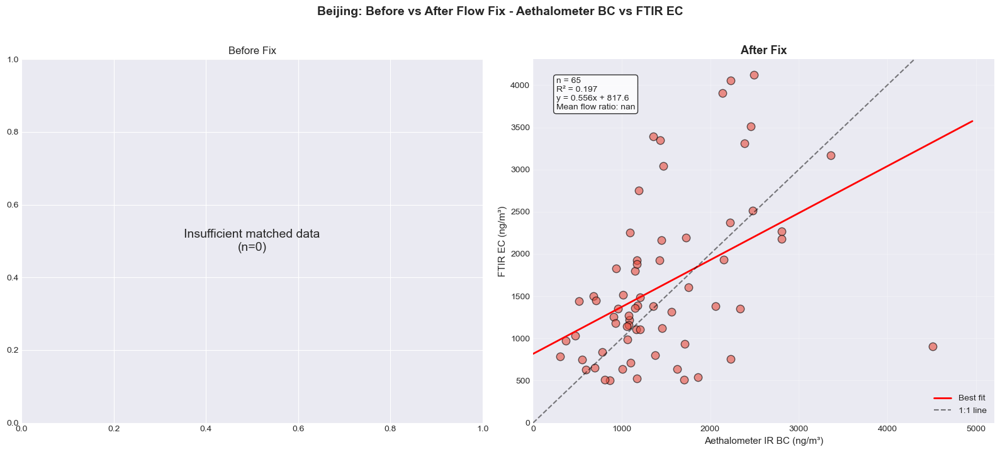


Analyzing JPL...


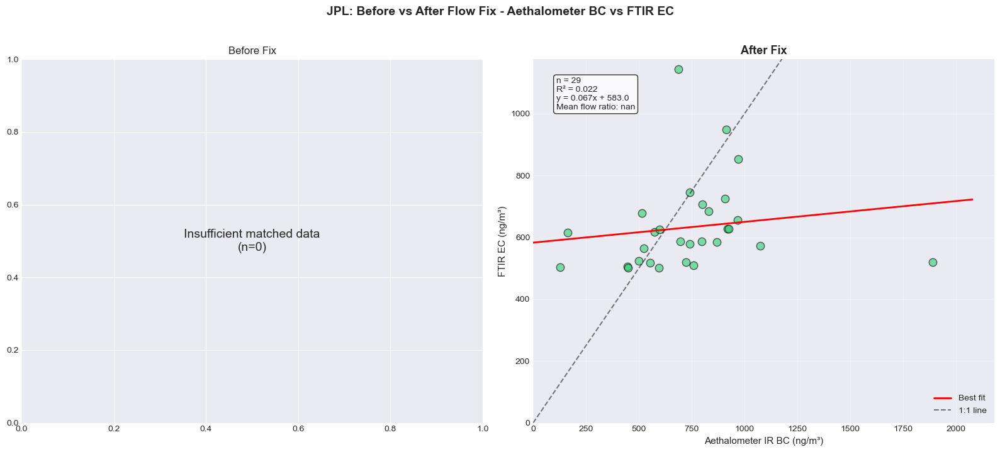

OUTLIER DETECTION AND ANALYSIS

Analyzing Beijing...

Beijing - Outlier Analysis:
  Total matched points: 65
  Outliers flagged: 12

  Flagged points:
  Date            Aeth BC  Filter EC   Residual  Complete% Reason
  ---------------------------------------------------------------------------
  2023-09-20       1623.0      636.5    -1082.8       32.7 low_completeness; 
  2023-10-18       1705.5      513.4    -1251.7       22.3 low_completeness; 
  2023-10-21       4509.8      907.6    -2415.5       10.8 high_aeth_bc; high_residual; low_completeness; 
  2023-12-25       2333.9     1349.7     -764.5       17.0 low_completeness; 
  2024-03-04       1359.1     1379.4     -193.3       14.1 low_completeness; 
  2024-03-10       2227.4     4055.1     2000.0       96.9 high_residual; 
  2024-01-09       2227.4      758.1    -1296.9       32.7 low_completeness; 
  2024-01-12       2495.7     4124.6     1920.5       96.6 high_residual; 
  2024-01-29       2141.5     3905.8     1898.5       98.6

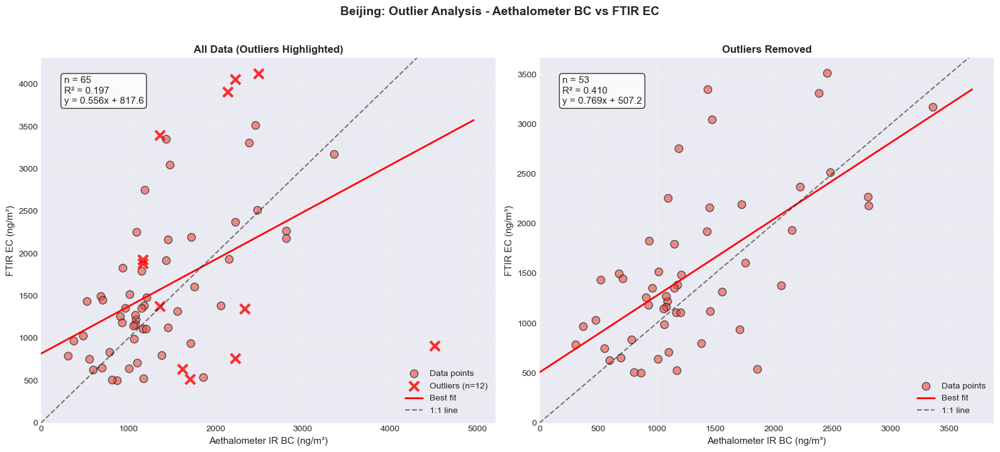


Analyzing Delhi...

Delhi - Outlier Analysis:
  Total matched points: 24
  Outliers flagged: 13

  Flagged points:
  Date            Aeth BC  Filter EC   Residual  Complete% Reason
  ---------------------------------------------------------------------------
  2024-03-29      11007.4     8421.1      401.2       99.6 high_aeth_bc; 
  2024-04-10      11017.2     8579.2      551.2       98.7 high_aeth_bc; 
  2024-05-01       9426.1     2193.5    -4502.7       99.4 high_aeth_bc; high_residual; 
  2024-05-04      15348.0    12334.1      680.7       99.1 high_aeth_bc; 
  2024-05-07      12287.7    10420.4     1328.8       99.1 high_aeth_bc; 
  2024-05-13      12893.4     9713.6      115.0       99.4 high_aeth_bc; 
  2024-05-17      13381.7     9412.5     -594.9       99.2 high_aeth_bc; 
  2024-05-20       9239.7     5684.6     -855.5       99.6 high_aeth_bc; 
  2024-05-26      12031.4     5992.6    -2884.5       98.3 high_aeth_bc; 
  2024-05-29       9788.8     2579.6    -4420.1       19.3 

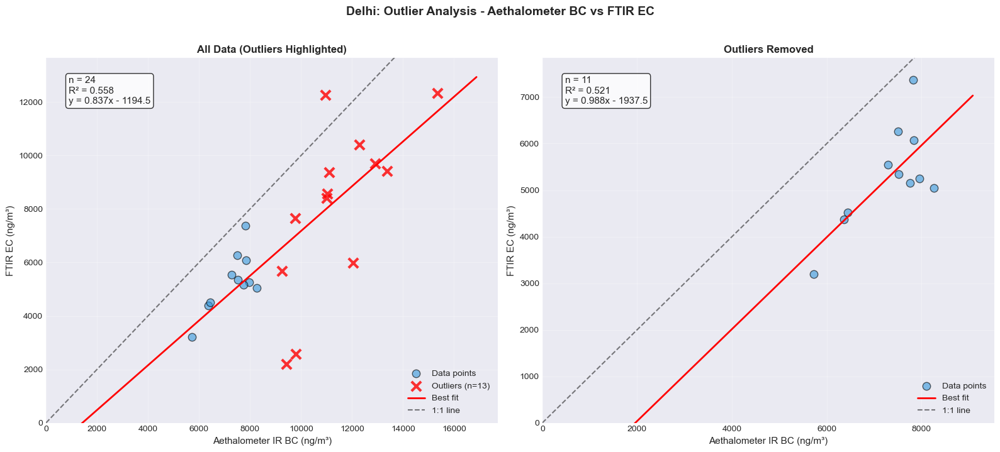


Analyzing JPL...

JPL - Outlier Analysis:
  Total matched points: 42
  Outliers flagged: 3

  Flagged points:
  Date            Aeth BC  Filter EC   Residual  Complete% Reason
  ---------------------------------------------------------------------------
  2023-06-13       1889.6      519.8     -187.2       30.8 low_completeness; 
  2023-07-05        686.5     1143.9      520.6       73.9 high_residual; 
  2023-09-27        913.3      949.1      310.0       99.4 high_residual; 


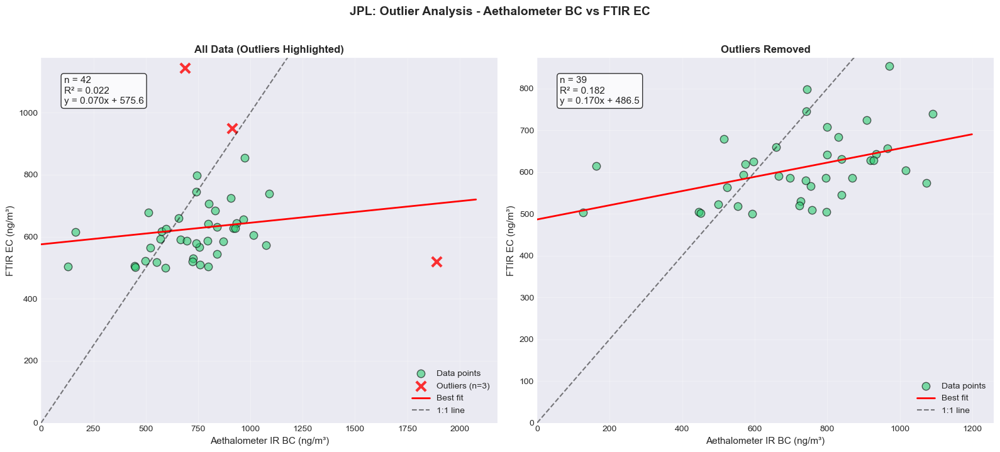


Analyzing Addis_Ababa...

Addis_Ababa - Outlier Analysis:
  Total matched points: 181
  Outliers flagged: 8

  Flagged points:
  Date            Aeth BC  Filter EC   Residual  Complete% Reason
  ---------------------------------------------------------------------------
  2023-06-13      15222.9     6728.8    -3010.1        nan high_residual; 
  2023-06-19      10842.9     9713.8     2762.9        nan high_residual; 
  2023-07-01      10447.2     9600.3     2901.2        nan high_residual; 
  2023-07-24      10905.6     9715.6     2724.7        nan high_residual; 
  2023-08-08       8878.5     8373.0     2672.4        nan high_residual; 
  2024-06-29      10936.1    10266.2     3255.8        nan high_residual; 
  2024-07-08      11102.4    11136.4     4020.3        nan high_residual; 
  2024-09-21       5936.4     9279.0     5451.1        nan high_residual; 


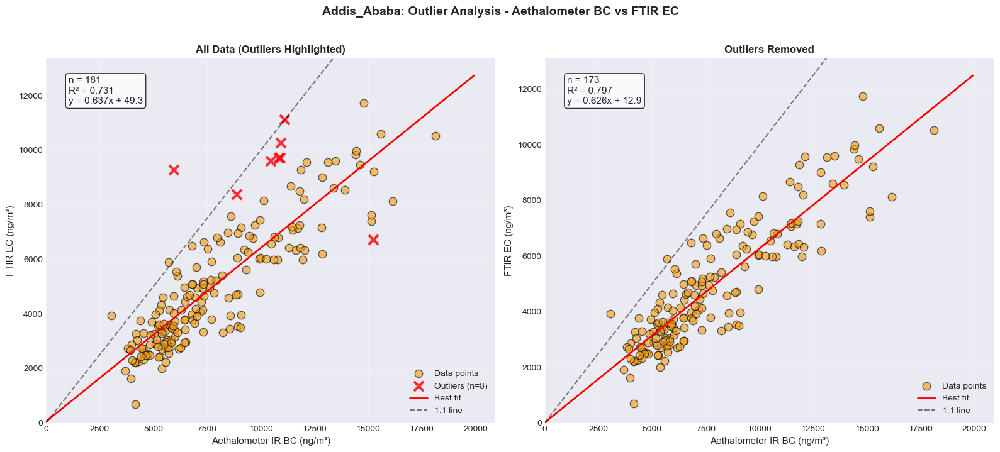

SMOOTH VS NON-SMOOTH BCc COMPARISON

Analyzing Beijing...


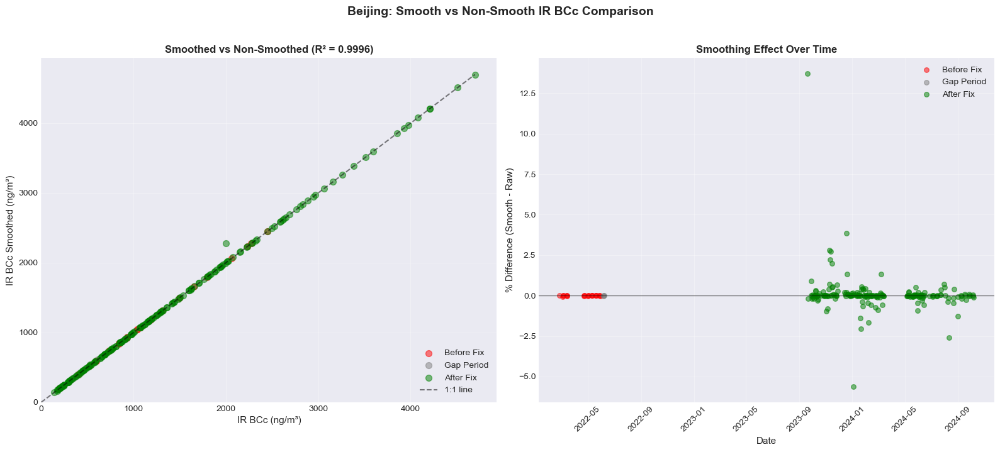


Beijing - Smooth vs Non-Smooth Statistics:
  Overall R²: 0.9996
  Mean difference: 1.28 ng/m³
  Mean % difference: 0.07%
  Std % difference: 1.15%

  Before Fix:
    n = 22
    Mean % difference: -0.00%
    Std % difference: 0.02%

  Gap Period:
    n = 3
    Mean % difference: 0.00%
    Std % difference: 0.03%

  After Fix:
    n = 197
    Mean % difference: 0.08%
    Std % difference: 1.22%

Analyzing JPL...


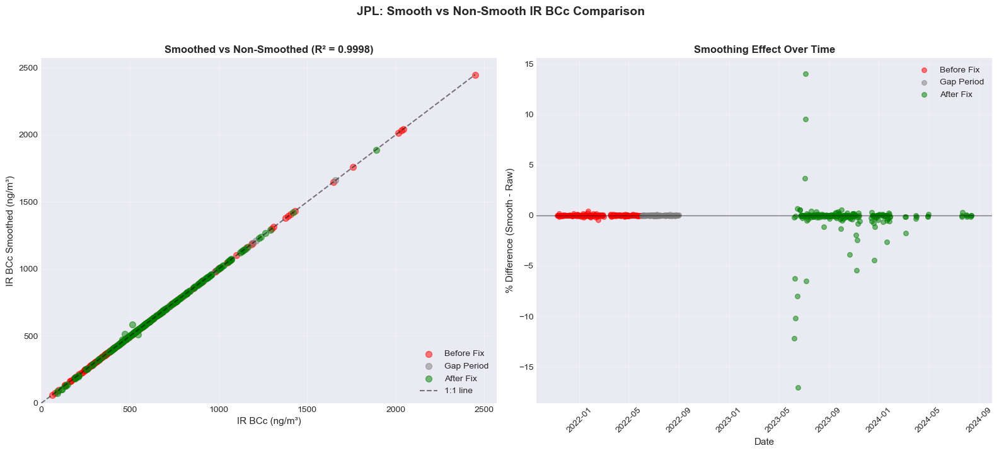


JPL - Smooth vs Non-Smooth Statistics:
  Overall R²: 0.9998
  Mean difference: -0.09 ng/m³
  Mean % difference: -0.13%
  Std % difference: 1.49%

  Before Fix:
    n = 184
    Mean % difference: 0.00%
    Std % difference: 0.08%

  Gap Period:
    n = 90
    Mean % difference: 0.00%
    Std % difference: 0.04%

  After Fix:
    n = 215
    Mean % difference: -0.31%
    Std % difference: 2.23%

Analyzing Delhi...


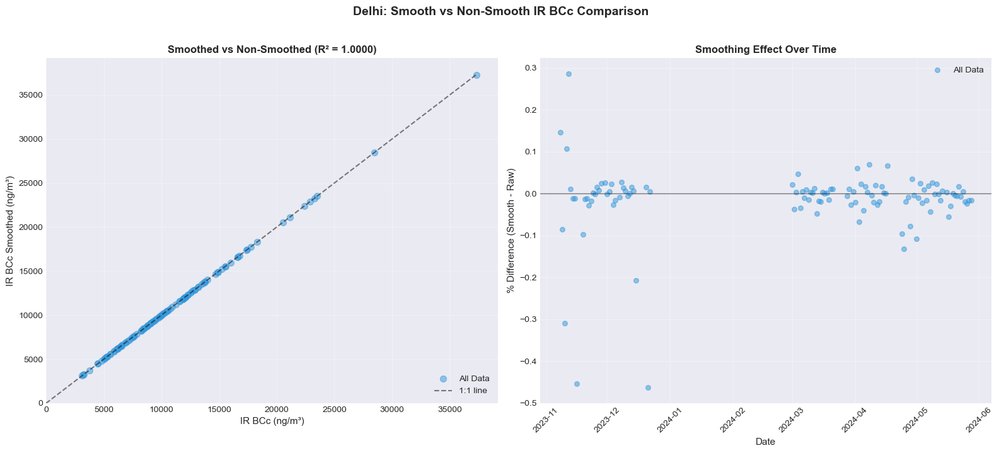


Delhi - Smooth vs Non-Smooth Statistics:
  Overall R²: 1.0000
  Mean difference: -1.54 ng/m³
  Mean % difference: -0.01%
  Std % difference: 0.08%

  All Data:
    n = 113
    Mean % difference: -0.01%
    Std % difference: 0.08%

Analyzing Addis_Ababa...


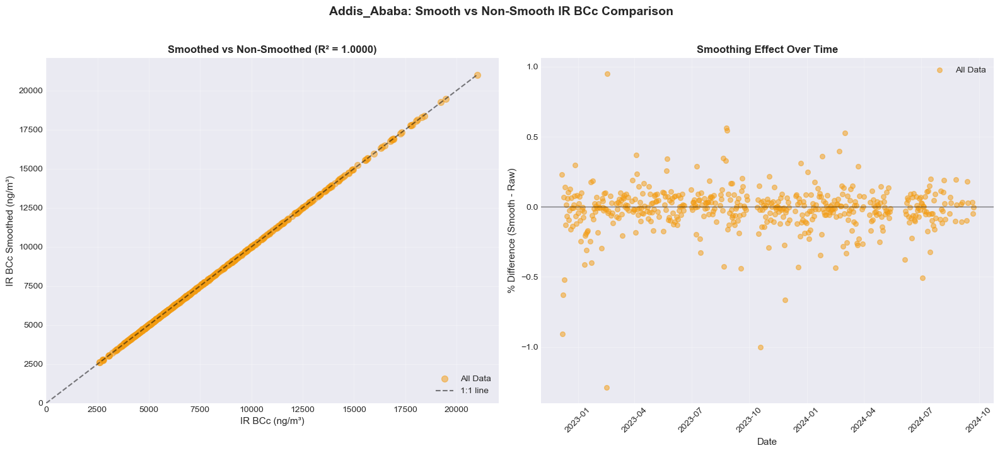


Addis_Ababa - Smooth vs Non-Smooth Statistics:
  Overall R²: 1.0000
  Mean difference: -0.99 ng/m³
  Mean % difference: -0.02%
  Std % difference: 0.16%

  All Data:
    n = 515
    Mean % difference: -0.02%
    Std % difference: 0.16%
HIPS FABS VS AETHALOMETER BC ANALYSIS

Analyzing Beijing...


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/1073115376.py:771: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


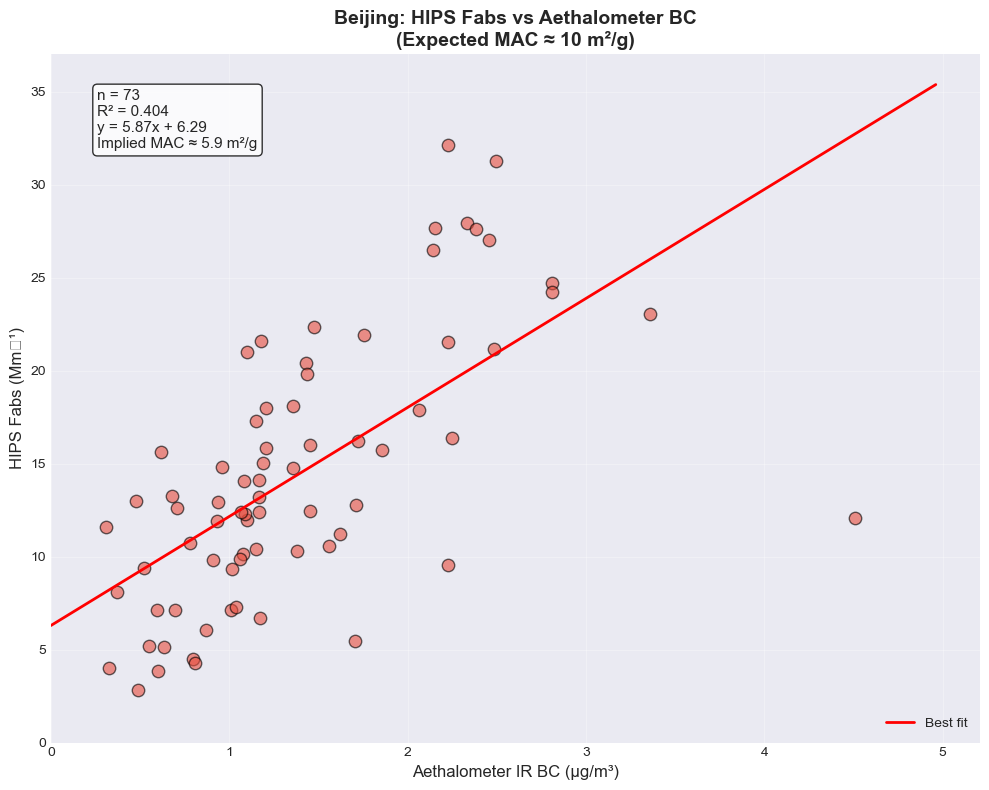


Beijing - HIPS Fabs vs BC Results:
  n = 73
  R² = 0.404
  Slope = 5.87 (implied MAC)
  Intercept = 6.29
  ⚠ MAC differs from expected value of 10

Analyzing Delhi...


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/1073115376.py:771: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


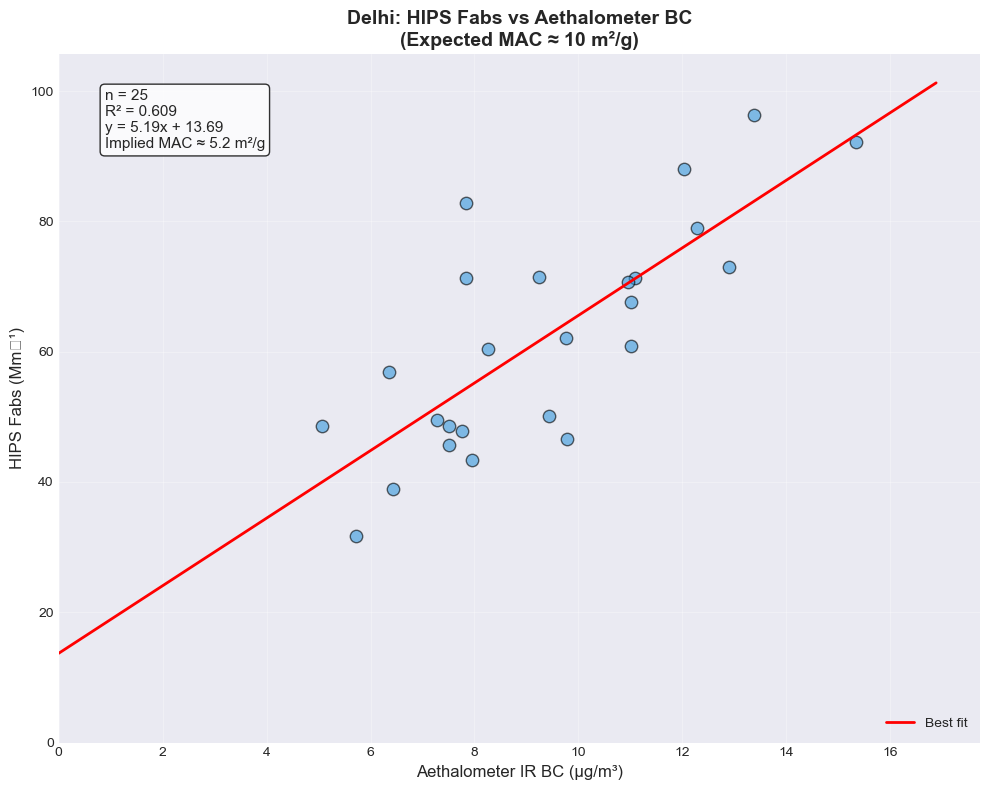


Delhi - HIPS Fabs vs BC Results:
  n = 25
  R² = 0.609
  Slope = 5.19 (implied MAC)
  Intercept = 13.69
  ⚠ MAC differs from expected value of 10

Analyzing JPL...


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/1073115376.py:771: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


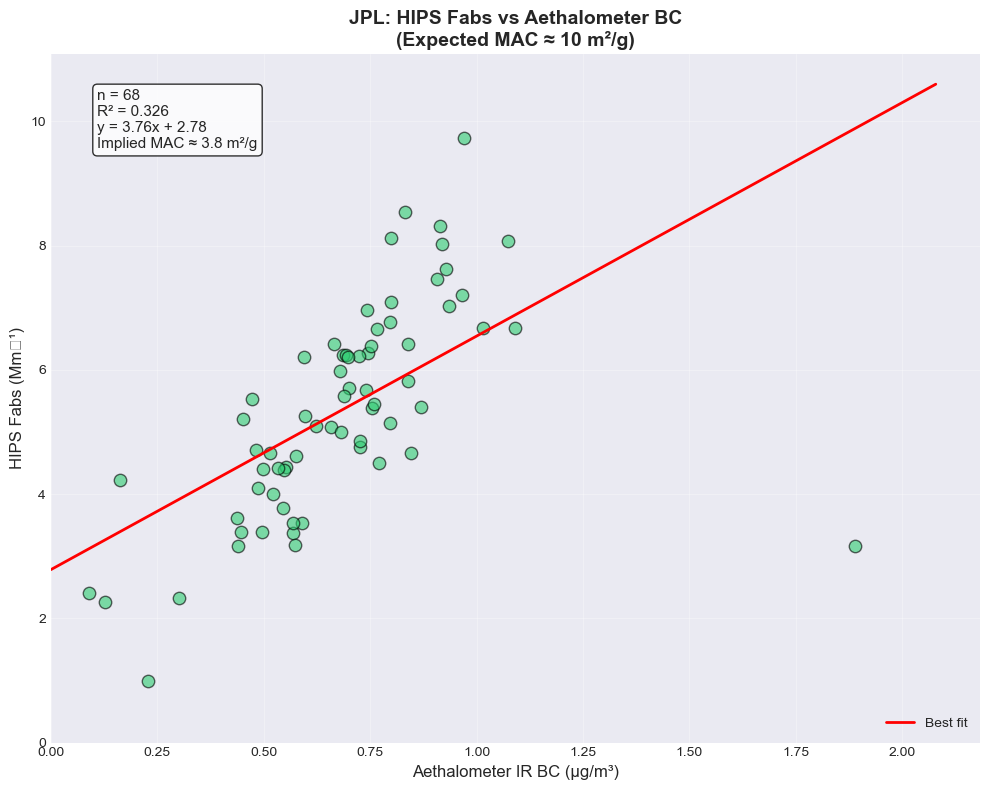


JPL - HIPS Fabs vs BC Results:
  n = 68
  R² = 0.326
  Slope = 3.76 (implied MAC)
  Intercept = 2.78
  ⚠ MAC differs from expected value of 10

Analyzing Addis_Ababa...


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_40298/1073115376.py:771: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


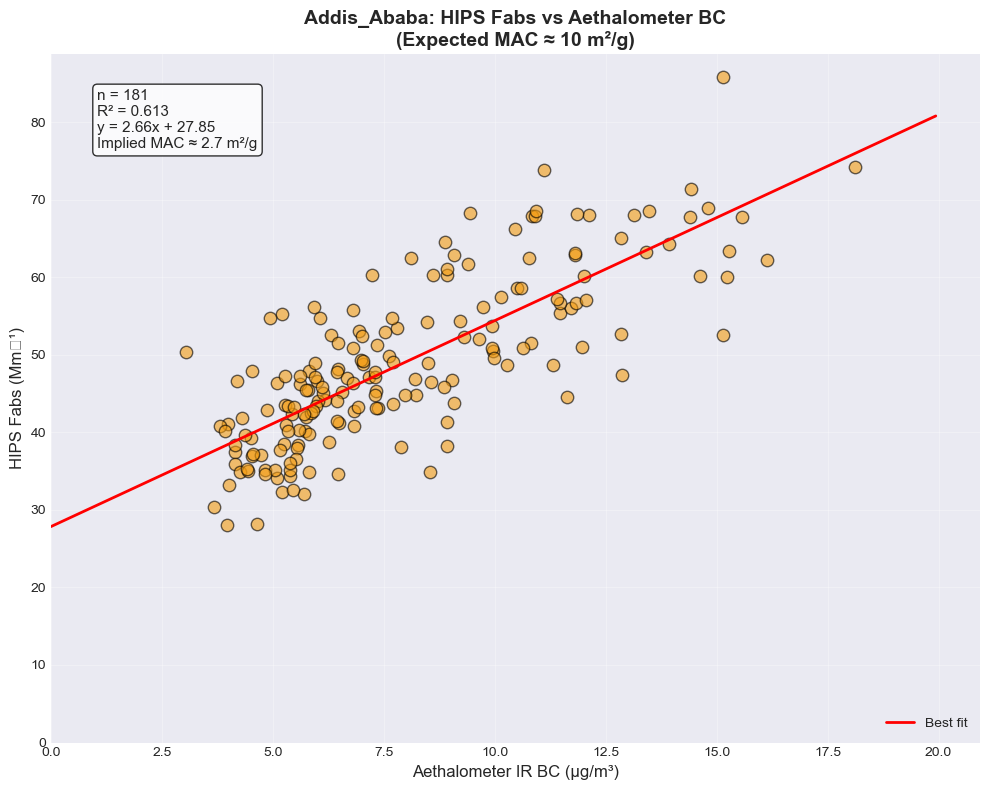


Addis_Ababa - HIPS Fabs vs BC Results:
  n = 181
  R² = 0.613
  Slope = 2.66 (implied MAC)
  Intercept = 27.85
  ⚠ MAC differs from expected value of 10
CHECK EARLY PERIOD IN MATCHED DATA

Beijing - Early Period Check:
  Total matched points: 65
  Points in early period (before 2022-06-01): 0
  Points after early period: 65

  ✓ No early period data in matched dataset

JPL - Early Period Check:
  Total matched points: 42
  Points in early period (before 2022-06-01): 0
  Points after early period: 42

  ✓ No early period data in matched dataset

ACTION ITEMS ANALYSIS COMPLETE

Remember to:
1. Adjust FLOW_FIX_PERIODS dates based on your flow ratio plots
2. Review flagged outliers and determine if they should be removed
3. Email Ed the results and plots for review
4. Update the meeting notes with any new findings


In [76]:
# %% [markdown]
# # Meeting Action Items - New Analysis Sections
# 
# Based on the Fall 2025 meeting with Ed, the following analyses were requested:
# 
# ## Action Items Addressed:
# 1. **Before/After Flow Fix Analysis** - Separate Beijing and JPL data by flow period
# 2. **Outlier Detection and Removal** - Flag/remove specific outliers identified in meeting
# 3. **Smooth vs Non-Smooth BCc Comparison** - Understand what "smooth" column means
# 4. **HIPS Fabs vs BC Analysis** - Verify MAC ~10 relationship
# 5. **Ensure (0,0) origin on all cross-plots**
# 
# ---

# %%
# =============================================================================
# CONFIGURATION: Flow Fix Periods
# =============================================================================
# 
# These dates define when the flow ratio improved at each site.
# Identified from the flow ratio time series plots.

FLOW_FIX_PERIODS = {
    'Beijing': {
        'description': 'Gap in data where instrument was likely serviced',
        'before_end': '2022-06-01',      # End of "before" period (low flow ratio ~1.2)
        'after_start': '2022-09-01',     # Start of "after" period (improved flow ratio ~1.8-2.0)
        'notes': 'May 2022 data has very low flow ratios pulling down the mean'
    },
    'JPL': {
        'description': 'Similar gap where flow ratio improved',
        'before_end': '2022-06-01',      # Adjust based on your actual data
        'after_start': '2022-09-01',     # Adjust based on your actual data
        'notes': 'Early days have flow ratio near 1.2, later improved to ~2.5'
    },
    'Delhi': {
        'description': 'Started after flow issues were resolved',
        'before_end': None,              # No "before" period - started late
        'after_start': None,             # All data is "good" period
        'notes': 'Best flow ratios (~2.4 mean), no problematic early period'
    },
    'Addis_Ababa': {
        'description': 'Consistently low flow ratio throughout',
        'before_end': None,
        'after_start': None,
        'notes': 'Flow ratio ~1.2 throughout - never fixed'
    }
}

# Outliers identified in meeting (to be investigated/removed)
OUTLIERS_TO_CHECK = {
    'Beijing': {
        'aethalometer_bc_high': 4700,    # ng/m³ - single high point with low FTIR EC
        'description': 'One point at ~4700 aethalometer BC with low FTIR - affects slope'
    },
    'Delhi': {
        'aethalometer_bc_high': 10000,   # ng/m³ - two points around this value
        'description': 'Two points at ~10000 aethalometer BC - check if partial data days'
    }
}

print("Configuration defined!")
print("\nFlow Fix Periods:")
for site, config in FLOW_FIX_PERIODS.items():
    print(f"  {site}: {config['notes']}")

# %% [markdown]
# ## 1. Before/After Flow Fix Analysis
# 
# Separate Beijing and JPL data into periods before and after the flow was fixed,
# then compare the aethalometer BC vs FTIR EC correlations for each period.

# %%
def add_flow_period_column(df, site_name):
    """
    Add a column indicating whether each row is from 'before' or 'after' the flow fix.
    
    Parameters:
    -----------
    df : DataFrame with 'day_9am' column
    site_name : str
    
    Returns:
    --------
    DataFrame with 'flow_period' column added
    """
    df = df.copy()
    
    config = FLOW_FIX_PERIODS.get(site_name, {})
    before_end = config.get('before_end')
    after_start = config.get('after_start')
    
    if before_end is None and after_start is None:
        # No flow fix period defined - all data is one period
        df['flow_period'] = 'all_data'
    else:
        before_end = pd.to_datetime(before_end) if before_end else None
        after_start = pd.to_datetime(after_start) if after_start else None
        
        def classify_period(date):
            if before_end and date <= before_end:
                return 'before_fix'
            elif after_start and date >= after_start:
                return 'after_fix'
            else:
                return 'gap_period'
        
        df['flow_period'] = df['day_9am'].apply(classify_period)
    
    return df


def plot_before_after_scatter(site_name, df_aeth, filter_data, config, min_ec=0.5):
    """
    Create side-by-side scatter plots for before and after flow fix periods.
    
    Parameters:
    -----------
    site_name : str
    df_aeth : DataFrame with aethalometer data
    filter_data : DataFrame with filter data
    config : dict with site configuration
    min_ec : float - minimum EC value to include (µg/m³)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    site_code = config['code']
    
    # Add flow period column
    df_aeth = add_flow_period_column(df_aeth, site_name)
    
    # Get unique periods (excluding 'gap_period')
    periods = [p for p in df_aeth['flow_period'].unique() if p != 'gap_period']
    
    if len(periods) <= 1:
        print(f"{site_name}: Only one period available, skipping before/after comparison")
        return None
    
    # Get filter EC data
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'EC_ftir')
    ].copy()
    
    # Filter out values below MDL
    site_filters = site_filters[site_filters['Concentration'] >= min_ec].copy()
    
    if len(site_filters) == 0:
        print(f"{site_name}: No filter EC data available")
        return None
    
    # Create figure with subplots for each period
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    results = {}
    
    for idx, period in enumerate(['before_fix', 'after_fix']):
        ax = axes[idx]
        
        # Get aethalometer data for this period
        period_aeth = df_aeth[df_aeth['flow_period'] == period].copy()
        
        if len(period_aeth) == 0:
            ax.text(0.5, 0.5, f'No data for\n{period}', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=14)
            ax.set_title(f'{period.replace("_", " ").title()}')
            continue
        
        # Match filter data to aethalometer data
        matched_data = []
        
        for _, filter_row in site_filters.iterrows():
            filter_date = filter_row['SampleDate']
            
            # Find aethalometer measurement within ±1 day AND in this period
            date_match = period_aeth[
                (period_aeth['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
                (period_aeth['day_9am'] <= filter_date + pd.Timedelta(days=1))
            ]
            
            if len(date_match) > 0 and 'IR BCc' in date_match.columns:
                if date_match['IR BCc'].notna().any():
                    aeth_bc = date_match['IR BCc'].mean()
                    filter_ec = filter_row['Concentration'] * 1000  # µg/m³ to ng/m³
                    flow_ratio = date_match['ratio_flow'].mean() if 'ratio_flow' in date_match.columns else np.nan
                    matched_data.append({
                        'aeth_bc': aeth_bc, 
                        'filter_ec': filter_ec,
                        'flow_ratio': flow_ratio,
                        'date': filter_date
                    })
        
        if len(matched_data) < 3:
            ax.text(0.5, 0.5, f'Insufficient matched data\n(n={len(matched_data)})', 
                   transform=ax.transAxes, ha='center', va='center', fontsize=14)
            ax.set_title(f'{period.replace("_", " ").title()}')
            continue
        
        matched_df = pd.DataFrame(matched_data)
        
        # Create scatter plot
        ax.scatter(matched_df['aeth_bc'], matched_df['filter_ec'], 
                  color=config['color'], alpha=0.6, s=80, 
                  edgecolors='black', linewidth=1)
        
        # Linear regression
        coefficients = np.polyfit(matched_df['aeth_bc'], matched_df['filter_ec'], 1)
        slope, intercept = coefficients
        
        # Calculate R²
        correlation = np.corrcoef(matched_df['aeth_bc'], matched_df['filter_ec'])[0, 1]
        r_squared = correlation ** 2
        
        # Mean flow ratio for this period
        mean_flow = matched_df['flow_ratio'].mean()
        
        # Store results
        results[period] = {
            'n': len(matched_df),
            'r_squared': r_squared,
            'slope': slope,
            'intercept': intercept,
            'mean_flow_ratio': mean_flow
        }
        
        # Plot best fit line
        x_fit = np.array([0, matched_df['aeth_bc'].max() * 1.1])
        y_fit = slope * x_fit + intercept
        ax.plot(x_fit, y_fit, color='red', linestyle='-', linewidth=2, label='Best fit')
        
        # Set axes to start from 0
        ax.set_xlim(left=0)
        ax.set_ylim(bottom=0)
        
        # Add 1:1 line
        max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
        ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
        
        # Statistics text
        if intercept >= 0:
            equation = f'y = {slope:.3f}x + {intercept:.1f}'
        else:
            equation = f'y = {slope:.3f}x - {abs(intercept):.1f}'
        
        stats_text = (f'n = {len(matched_df)}\n'
                     f'R² = {r_squared:.3f}\n'
                     f'{equation}\n'
                     f'Mean flow ratio: {mean_flow:.2f}')
        
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
               verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=11)
        ax.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
        ax.set_title(f'{period.replace("_", " ").title()}', fontsize=13, fontweight='bold')
        ax.legend(loc='lower right')
        ax.grid(True, alpha=0.3)
    
    fig.suptitle(f'{site_name}: Before vs After Flow Fix - Aethalometer BC vs FTIR EC', 
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Print comparison
    if len(results) == 2:
        print(f"\n{site_name} - Before/After Flow Fix Comparison:")
        print(f"{'Metric':<20s} {'Before Fix':>15s} {'After Fix':>15s} {'Change':>15s}")
        print("-" * 65)
        
        before = results.get('before_fix', {})
        after = results.get('after_fix', {})
        
        if before and after:
            print(f"{'n':<20s} {before['n']:>15d} {after['n']:>15d}")
            print(f"{'R²':<20s} {before['r_squared']:>15.3f} {after['r_squared']:>15.3f} {after['r_squared']-before['r_squared']:>+15.3f}")
            print(f"{'Slope':<20s} {before['slope']:>15.3f} {after['slope']:>15.3f} {after['slope']-before['slope']:>+15.3f}")
            print(f"{'Intercept':<20s} {before['intercept']:>15.1f} {after['intercept']:>15.1f} {after['intercept']-before['intercept']:>+15.1f}")
            print(f"{'Mean Flow Ratio':<20s} {before['mean_flow_ratio']:>15.2f} {after['mean_flow_ratio']:>15.2f} {after['mean_flow_ratio']-before['mean_flow_ratio']:>+15.2f}")
    
    return results


# Run before/after analysis for Beijing and JPL
print("="*80)
print("BEFORE/AFTER FLOW FIX ANALYSIS")
print("="*80)

for site_name in ['Beijing', 'JPL']:
    if site_name in aethalometer_data:
        print(f"\n{'='*40}")
        print(f"Analyzing {site_name}...")
        print(f"{'='*40}")
        
        results = plot_before_after_scatter(
            site_name, 
            aethalometer_data[site_name], 
            filter_data, 
            SITES[site_name]
        )

# %% [markdown]
# ## 2. Outlier Detection and Flagging
# 
# Identify and optionally remove the specific outliers mentioned in the meeting.

# %%
def identify_outliers(df_aeth, site_name, filter_data, config, 
                      bc_threshold_high=None, show_details=True):
    """
    Identify outlier points in the aethalometer vs filter comparison.
    
    Parameters:
    -----------
    df_aeth : DataFrame
    site_name : str
    filter_data : DataFrame
    config : dict
    bc_threshold_high : float - flag points above this aethalometer BC value
    show_details : bool - print details of flagged points
    
    Returns:
    --------
    DataFrame with matched data and outlier flags
    """
    site_code = config['code']
    
    # Get filter EC data
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'EC_ftir')
    ].copy()
    site_filters = site_filters[site_filters['Concentration'] >= 0.5].copy()
    
    # Match data
    matched_data = []
    
    for _, filter_row in site_filters.iterrows():
        filter_date = filter_row['SampleDate']
        
        date_match = df_aeth[
            (df_aeth['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
            (df_aeth['day_9am'] <= filter_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0 and 'IR BCc' in date_match.columns:
            if date_match['IR BCc'].notna().any():
                aeth_bc = date_match['IR BCc'].mean()
                filter_ec = filter_row['Concentration'] * 1000
                
                # Get additional info
                data_completeness = date_match['data_completeness_pct'].mean() if 'data_completeness_pct' in date_match.columns else np.nan
                flow_ratio = date_match['ratio_flow'].mean() if 'ratio_flow' in date_match.columns else np.nan
                
                matched_data.append({
                    'date': filter_date,
                    'aeth_bc': aeth_bc, 
                    'filter_ec': filter_ec,
                    'data_completeness': data_completeness,
                    'flow_ratio': flow_ratio,
                    'filter_id': filter_row.get('FilterId', 'unknown')
                })
    
    if len(matched_data) == 0:
        print(f"{site_name}: No matched data")
        return None
    
    matched_df = pd.DataFrame(matched_data)
    
    # Calculate residuals from linear fit
    coefficients = np.polyfit(matched_df['aeth_bc'], matched_df['filter_ec'], 1)
    slope, intercept = coefficients
    matched_df['predicted_ec'] = slope * matched_df['aeth_bc'] + intercept
    matched_df['residual'] = matched_df['filter_ec'] - matched_df['predicted_ec']
    matched_df['abs_residual'] = abs(matched_df['residual'])
    
    # Flag outliers
    matched_df['outlier_flag'] = False
    matched_df['outlier_reason'] = ''
    
    # Flag based on high BC threshold
    if bc_threshold_high:
        high_bc_mask = matched_df['aeth_bc'] > bc_threshold_high
        matched_df.loc[high_bc_mask, 'outlier_flag'] = True
        matched_df.loc[high_bc_mask, 'outlier_reason'] += 'high_aeth_bc; '
    
    # Flag based on residual (> 2 std dev)
    residual_std = matched_df['abs_residual'].std()
    residual_mean = matched_df['abs_residual'].mean()
    high_residual_mask = matched_df['abs_residual'] > (residual_mean + 2 * residual_std)
    matched_df.loc[high_residual_mask, 'outlier_flag'] = True
    matched_df.loc[high_residual_mask, 'outlier_reason'] += 'high_residual; '
    
    # Flag low data completeness (< 50%)
    if 'data_completeness' in matched_df.columns:
        low_completeness_mask = matched_df['data_completeness'] < 50
        matched_df.loc[low_completeness_mask, 'outlier_flag'] = True
        matched_df.loc[low_completeness_mask, 'outlier_reason'] += 'low_completeness; '
    
    if show_details:
        outliers = matched_df[matched_df['outlier_flag']]
        print(f"\n{site_name} - Outlier Analysis:")
        print(f"  Total matched points: {len(matched_df)}")
        print(f"  Outliers flagged: {len(outliers)}")
        
        if len(outliers) > 0:
            print(f"\n  Flagged points:")
            print(f"  {'Date':<12s} {'Aeth BC':>10s} {'Filter EC':>10s} {'Residual':>10s} {'Complete%':>10s} {'Reason'}")
            print("  " + "-" * 75)
            
            for _, row in outliers.iterrows():
                print(f"  {str(row['date'].date()):<12s} "
                      f"{row['aeth_bc']:>10.1f} "
                      f"{row['filter_ec']:>10.1f} "
                      f"{row['residual']:>10.1f} "
                      f"{row['data_completeness']:>10.1f} "
                      f"{row['outlier_reason']}")
    
    return matched_df


def plot_with_outliers_highlighted(matched_df, site_name, config, remove_outliers=False):
    """
    Create scatter plot with outliers highlighted or removed.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    for idx, (ax, title, exclude_outliers) in enumerate([
        (axes[0], 'All Data (Outliers Highlighted)', False),
        (axes[1], 'Outliers Removed', True)
    ]):
        if exclude_outliers:
            plot_df = matched_df[~matched_df['outlier_flag']].copy()
        else:
            plot_df = matched_df.copy()
        
        if len(plot_df) < 3:
            ax.text(0.5, 0.5, 'Insufficient data', transform=ax.transAxes, 
                   ha='center', va='center')
            continue
        
        # Plot non-outliers
        non_outliers = plot_df[~plot_df['outlier_flag']] if not exclude_outliers else plot_df
        ax.scatter(non_outliers['aeth_bc'], non_outliers['filter_ec'], 
                  color=config['color'], alpha=0.6, s=80, 
                  edgecolors='black', linewidth=1, label='Data points')
        
        # Plot outliers (only for "All Data" plot)
        if not exclude_outliers:
            outliers = matched_df[matched_df['outlier_flag']]
            if len(outliers) > 0:
                ax.scatter(outliers['aeth_bc'], outliers['filter_ec'], 
                          color='red', alpha=0.8, s=120, marker='x',
                          linewidths=3, label=f'Outliers (n={len(outliers)})')
        
        # Linear regression on plotted data
        coefficients = np.polyfit(plot_df['aeth_bc'], plot_df['filter_ec'], 1)
        slope, intercept = coefficients
        correlation = np.corrcoef(plot_df['aeth_bc'], plot_df['filter_ec'])[0, 1]
        r_squared = correlation ** 2
        
        # Plot best fit line
        x_fit = np.array([0, plot_df['aeth_bc'].max() * 1.1])
        y_fit = slope * x_fit + intercept
        ax.plot(x_fit, y_fit, color='red', linestyle='-', linewidth=2, label='Best fit')
        
        # Set axes to start from 0
        ax.set_xlim(left=0)
        ax.set_ylim(bottom=0)
        
        # Add 1:1 line
        max_val = max(ax.get_xlim()[1], ax.get_ylim()[1])
        ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
        
        # Statistics text
        if intercept >= 0:
            equation = f'y = {slope:.3f}x + {intercept:.1f}'
        else:
            equation = f'y = {slope:.3f}x - {abs(intercept):.1f}'
        
        stats_text = f'n = {len(plot_df)}\nR² = {r_squared:.3f}\n{equation}'
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=11,
               verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=11)
        ax.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.legend(loc='lower right')
        ax.grid(True, alpha=0.3)
    
    fig.suptitle(f'{site_name}: Outlier Analysis - Aethalometer BC vs FTIR EC', 
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


# Run outlier analysis
print("="*80)
print("OUTLIER DETECTION AND ANALYSIS")
print("="*80)

outlier_thresholds = {
    'Beijing': 4500,    # Flag points above 4500 ng/m³
    'Delhi': 9000,      # Flag points above 9000 ng/m³
    'JPL': None,        # No specific threshold
    'Addis_Ababa': None
}

outlier_results = {}

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name in aethalometer_data:
        print(f"\n{'='*40}")
        print(f"Analyzing {site_name}...")
        
        matched_df = identify_outliers(
            aethalometer_data[site_name],
            site_name,
            filter_data,
            SITES[site_name],
            bc_threshold_high=outlier_thresholds.get(site_name)
        )
        
        if matched_df is not None:
            outlier_results[site_name] = matched_df
            plot_with_outliers_highlighted(matched_df, site_name, SITES[site_name])

# %% [markdown]
# ## 3. Smooth vs Non-Smooth BCc Comparison
# 
# Compare smoothed and non-smoothed BC measurements to understand what the "smooth" 
# column represents. Color by flow period to see if smoothing differs by flow quality.

# %%
def plot_smooth_vs_nonsmooth(site_name, df_aeth, config):
    """
    Compare smoothed vs non-smoothed BC measurements.
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    # Check if smoothed data exists
    has_smooth_ir = 'IR BCc smoothed' in df_aeth.columns
    has_smooth_red = 'Red BCc smoothed' in df_aeth.columns
    
    if not has_smooth_ir and not has_smooth_red:
        print(f"{site_name}: No smoothed BC data available")
        return None
    
    # Add flow period column
    df = add_flow_period_column(df_aeth.copy(), site_name)
    
    # Use IR BCc if available, otherwise Red
    if has_smooth_ir and 'IR BCc' in df.columns:
        bc_col = 'IR BCc'
        smooth_col = 'IR BCc smoothed'
        wavelength = 'IR'
    elif has_smooth_red and 'Red BCc' in df.columns:
        bc_col = 'Red BCc'
        smooth_col = 'Red BCc smoothed'
        wavelength = 'Red'
    else:
        print(f"{site_name}: Missing required columns for smooth comparison")
        return None
    
    # Filter valid data
    valid_df = df[[bc_col, smooth_col, 'day_9am', 'flow_period']].dropna().copy()
    
    if len(valid_df) < 5:
        print(f"{site_name}: Insufficient data for smooth comparison")
        return None
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Plot 1: Scatter - Smooth vs Non-Smooth, colored by flow period
    ax1 = axes[0]
    
    period_colors = {
        'before_fix': 'red',
        'after_fix': 'green',
        'gap_period': 'gray',
        'all_data': config['color']
    }
    
    for period in valid_df['flow_period'].unique():
        period_data = valid_df[valid_df['flow_period'] == period]
        ax1.scatter(period_data[bc_col], period_data[smooth_col],
                   color=period_colors.get(period, 'blue'),
                   alpha=0.5, s=50, label=period.replace('_', ' ').title())
    
    # Add 1:1 line
    max_val = max(valid_df[bc_col].max(), valid_df[smooth_col].max())
    ax1.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
    
    # Calculate overall correlation
    correlation = np.corrcoef(valid_df[bc_col], valid_df[smooth_col])[0, 1]
    r_squared = correlation ** 2
    
    ax1.set_xlim(left=0)
    ax1.set_ylim(bottom=0)
    ax1.set_xlabel(f'{wavelength} BCc (ng/m³)', fontsize=11)
    ax1.set_ylabel(f'{wavelength} BCc Smoothed (ng/m³)', fontsize=11)
    ax1.set_title(f'Smoothed vs Non-Smoothed (R² = {r_squared:.4f})', fontsize=12, fontweight='bold')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Difference over time
    ax2 = axes[1]
    
    valid_df['difference'] = valid_df[smooth_col] - valid_df[bc_col]
    valid_df['pct_difference'] = (valid_df['difference'] / valid_df[bc_col]) * 100
    
    for period in valid_df['flow_period'].unique():
        period_data = valid_df[valid_df['flow_period'] == period]
        ax2.scatter(period_data['day_9am'], period_data['pct_difference'],
                   color=period_colors.get(period, 'blue'),
                   alpha=0.5, s=30, label=period.replace('_', ' ').title())
    
    ax2.axhline(y=0, color='black', linestyle='-', linewidth=1, alpha=0.5)
    ax2.set_xlabel('Date', fontsize=11)
    ax2.set_ylabel('% Difference (Smooth - Raw)', fontsize=11)
    ax2.set_title('Smoothing Effect Over Time', fontsize=12, fontweight='bold')
    ax2.tick_params(axis='x', rotation=45)
    ax2.legend(loc='best')
    ax2.grid(True, alpha=0.3)
    
    fig.suptitle(f'{site_name}: Smooth vs Non-Smooth {wavelength} BCc Comparison', 
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    print(f"\n{site_name} - Smooth vs Non-Smooth Statistics:")
    print(f"  Overall R²: {r_squared:.4f}")
    print(f"  Mean difference: {valid_df['difference'].mean():.2f} ng/m³")
    print(f"  Mean % difference: {valid_df['pct_difference'].mean():.2f}%")
    print(f"  Std % difference: {valid_df['pct_difference'].std():.2f}%")
    
    # By period
    for period in valid_df['flow_period'].unique():
        period_data = valid_df[valid_df['flow_period'] == period]
        print(f"\n  {period.replace('_', ' ').title()}:")
        print(f"    n = {len(period_data)}")
        print(f"    Mean % difference: {period_data['pct_difference'].mean():.2f}%")
        print(f"    Std % difference: {period_data['pct_difference'].std():.2f}%")
    
    return valid_df


# Run smooth vs non-smooth analysis
print("="*80)
print("SMOOTH VS NON-SMOOTH BCc COMPARISON")
print("="*80)

smooth_results = {}

for site_name in ['Beijing', 'JPL', 'Delhi', 'Addis_Ababa']:
    if site_name in aethalometer_data:
        print(f"\n{'='*40}")
        print(f"Analyzing {site_name}...")
        
        result = plot_smooth_vs_nonsmooth(site_name, aethalometer_data[site_name], SITES[site_name])
        if result is not None:
            smooth_results[site_name] = result

# %% [markdown]
# ## 4. HIPS Fabs vs Aethalometer BC Analysis
# 
# Verify the MAC (Mass Absorption Cross-section) relationship.
# Expected: slope of ~0.1 (corresponding to MAC of 10 m²/g)

# %%
def plot_hips_fabs_vs_bc(site_name, df_aeth, filter_data, config):
    """
    Plot HIPS Fabs vs Aethalometer BC to check MAC relationship.
    Expected slope ~0.1 (MAC ~10)
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    site_code = config['code']
    
    # Get HIPS Fabs data
    site_hips = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'HIPS_Fabs')
    ].copy()
    
    if len(site_hips) == 0:
        print(f"{site_name}: No HIPS Fabs data available")
        return None
    
    # Match to aethalometer data
    matched_data = []
    
    for _, hips_row in site_hips.iterrows():
        hips_date = hips_row['SampleDate']
        
        date_match = df_aeth[
            (df_aeth['day_9am'] >= hips_date - pd.Timedelta(days=1)) &
            (df_aeth['day_9am'] <= hips_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0 and 'IR BCc' in date_match.columns:
            if date_match['IR BCc'].notna().any():
                aeth_bc = date_match['IR BCc'].mean() / 1000  # ng/m³ to µg/m³
                hips_fabs = hips_row['Concentration']  # Mm⁻¹
                
                matched_data.append({
                    'date': hips_date,
                    'aeth_bc': aeth_bc,
                    'hips_fabs': hips_fabs
                })
    
    if len(matched_data) < 3:
        print(f"{site_name}: Insufficient matched HIPS data (n={len(matched_data)})")
        return None
    
    matched_df = pd.DataFrame(matched_data)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(10, 8))
    
    ax.scatter(matched_df['aeth_bc'], matched_df['hips_fabs'],
              color=config['color'], alpha=0.6, s=80,
              edgecolors='black', linewidth=1)
    
    # Linear regression
    coefficients = np.polyfit(matched_df['aeth_bc'], matched_df['hips_fabs'], 1)
    slope, intercept = coefficients
    correlation = np.corrcoef(matched_df['aeth_bc'], matched_df['hips_fabs'])[0, 1]
    r_squared = correlation ** 2
    
    # Implied MAC value (slope should be ~10 for MAC=10)
    implied_mac = slope
    
    # Plot best fit line
    x_fit = np.array([0, matched_df['aeth_bc'].max() * 1.1])
    y_fit = slope * x_fit + intercept
    ax.plot(x_fit, y_fit, color='red', linestyle='-', linewidth=2, label='Best fit')
    
    # Set axes to start from 0
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)
    
    # Statistics text
    if intercept >= 0:
        equation = f'y = {slope:.2f}x + {intercept:.2f}'
    else:
        equation = f'y = {slope:.2f}x - {abs(intercept):.2f}'
    
    stats_text = (f'n = {len(matched_df)}\n'
                 f'R² = {r_squared:.3f}\n'
                 f'{equation}\n'
                 f'Implied MAC ≈ {implied_mac:.1f} m²/g')
    
    ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=11,
           verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax.set_xlabel('Aethalometer IR BC (µg/m³)', fontsize=12)
    ax.set_ylabel('HIPS Fabs (Mm⁻¹)', fontsize=12)
    ax.set_title(f'{site_name}: HIPS Fabs vs Aethalometer BC\n(Expected MAC ≈ 10 m²/g)', 
                fontsize=14, fontweight='bold')
    ax.legend(loc='lower right')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print results
    print(f"\n{site_name} - HIPS Fabs vs BC Results:")
    print(f"  n = {len(matched_df)}")
    print(f"  R² = {r_squared:.3f}")
    print(f"  Slope = {slope:.2f} (implied MAC)")
    print(f"  Intercept = {intercept:.2f}")
    
    if abs(implied_mac - 10) < 2:
        print(f"  ✓ MAC is close to expected value of 10")
    else:
        print(f"  ⚠ MAC differs from expected value of 10")
    
    return matched_df


# Run HIPS Fabs analysis
print("="*80)
print("HIPS FABS VS AETHALOMETER BC ANALYSIS")
print("="*80)

hips_results = {}

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name in aethalometer_data:
        print(f"\n{'='*40}")
        print(f"Analyzing {site_name}...")
        
        result = plot_hips_fabs_vs_bc(site_name, aethalometer_data[site_name], 
                                      filter_data, SITES[site_name])
        if result is not None:
            hips_results[site_name] = result

# %% [markdown]
# ## 5. Check Early Beijing Days in Matched Dataset
# 
# Verify if the problematic early May 2022 Beijing days are included in the matched dataset.

# %%
def check_early_period_in_matches(site_name, df_aeth, filter_data, config, 
                                  early_period_end='2022-06-01'):
    """
    Check how many matched points fall in the early (problematic) period.
    """
    site_code = config['code']
    early_date = pd.to_datetime(early_period_end)
    
    # Get filter EC data
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'EC_ftir')
    ].copy()
    site_filters = site_filters[site_filters['Concentration'] >= 0.5].copy()
    
    # Match to aethalometer
    matched_dates = []
    
    for _, filter_row in site_filters.iterrows():
        filter_date = filter_row['SampleDate']
        
        date_match = df_aeth[
            (df_aeth['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
            (df_aeth['day_9am'] <= filter_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0 and 'IR BCc' in date_match.columns:
            if date_match['IR BCc'].notna().any():
                aeth_date = date_match['day_9am'].iloc[0]
                matched_dates.append({
                    'filter_date': filter_date,
                    'aeth_date': aeth_date,
                    'is_early_period': aeth_date <= early_date
                })
    
    matched_df = pd.DataFrame(matched_dates)
    
    if len(matched_df) == 0:
        print(f"{site_name}: No matched data")
        return None
    
    early_count = matched_df['is_early_period'].sum()
    total_count = len(matched_df)
    
    print(f"\n{site_name} - Early Period Check:")
    print(f"  Total matched points: {total_count}")
    print(f"  Points in early period (before {early_period_end}): {early_count}")
    print(f"  Points after early period: {total_count - early_count}")
    
    if early_count > 0:
        early_dates = matched_df[matched_df['is_early_period']]['aeth_date']
        print(f"\n  Early period dates in matched dataset:")
        for date in early_dates:
            print(f"    - {date.date()}")
    else:
        print(f"\n  ✓ No early period data in matched dataset")
    
    return matched_df


# Check Beijing early period
print("="*80)
print("CHECK EARLY PERIOD IN MATCHED DATA")
print("="*80)

if 'Beijing' in aethalometer_data:
    check_early_period_in_matches(
        'Beijing', 
        aethalometer_data['Beijing'], 
        filter_data, 
        SITES['Beijing'],
        early_period_end='2022-06-01'
    )

if 'JPL' in aethalometer_data:
    check_early_period_in_matches(
        'JPL', 
        aethalometer_data['JPL'], 
        filter_data, 
        SITES['JPL'],
        early_period_end='2022-06-01'
    )

# %% [markdown]
# ## Summary of Meeting Action Items Status
# 
# | Action Item | Status | Notes |
# |------------|--------|-------|
# | Before/After Flow Fix Analysis | ✓ Implemented | Section 1 - Separate Beijing/JPL by flow period |
# | Outlier Detection | ✓ Implemented | Section 2 - Flags high BC, high residual, low completeness |
# | Smooth vs Non-Smooth Comparison | ✓ Implemented | Section 3 - Cross-plot with flow period coloring |
# | HIPS Fabs vs BC (MAC check) | ✓ Implemented | Section 4 - Verify MAC ~10 relationship |
# | Check Early Beijing Days | ✓ Implemented | Section 5 - Verify if problematic dates are matched |
# | Ensure (0,0) Origin | ✓ Implemented | All plots use `ax.set_xlim(left=0)` |
# 
# ### Next Steps:
# 1. **Adjust FLOW_FIX_PERIODS dates** based on your actual data visualization
# 2. **Review outliers** and decide which to remove vs. flag
# 3. **Determine what "smooth" means** - if R² ≈ 1, it's likely a noise reduction algorithm
# 4. **Discuss with Ed** about any surprising results

print("\n" + "="*80)
print("ACTION ITEMS ANALYSIS COMPLETE")
print("="*80)
print("\nRemember to:")
print("1. Adjust FLOW_FIX_PERIODS dates based on your flow ratio plots")
print("2. Review flagged outliers and determine if they should be removed")
print("3. Email Ed the results and plots for review")
print("4. Update the meeting notes with any new findings")

Manual outlier configuration loaded!

Outliers to remove:
  Beijing: Remove 1 point with extremely high aethalometer BC (far right)
  Delhi: Remove 2 points with high aethalometer but low FTIR EC
  JPL: Remove point(s) with FTIR EC > 1000 OR aethalometer > 1700
  Addis_Ababa: No manual outliers identified yet
Functions defined!
MANUAL OUTLIER REMOVAL ANALYSIS

Processing Beijing...
  Matched 65 data points

Beijing: 1 point(s) flagged for removal:
  Date              Aeth BC    Filter EC Reason
  ------------------------------------------------------------
  2023-10-21         4509.8        907.6 high_aeth(>4000); 


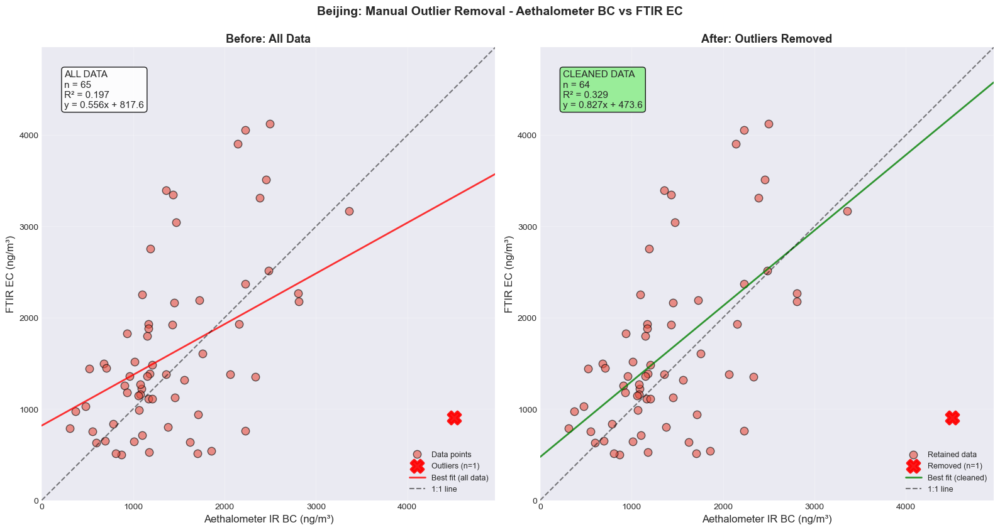


Processing Delhi...
  Matched 24 data points

Delhi: 2 point(s) flagged for removal:
  Date              Aeth BC    Filter EC Reason
  ------------------------------------------------------------
  2024-05-01         9426.1       2193.5 high_aeth_low_ec; 
  2024-05-29         9788.8       2579.6 high_aeth_low_ec; 


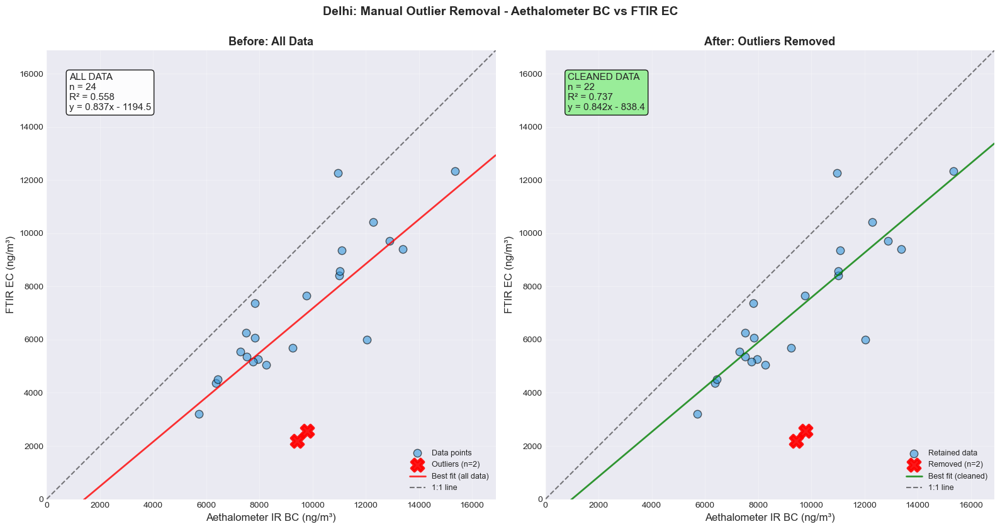


Processing JPL...
  Matched 42 data points

JPL: 2 point(s) flagged for removal:
  Date              Aeth BC    Filter EC Reason
  ------------------------------------------------------------
  2023-06-13         1889.6        519.8 high_either(aeth>1700 OR ec>1000); 
  2023-07-05          686.5       1143.9 high_either(aeth>1700 OR ec>1000); 


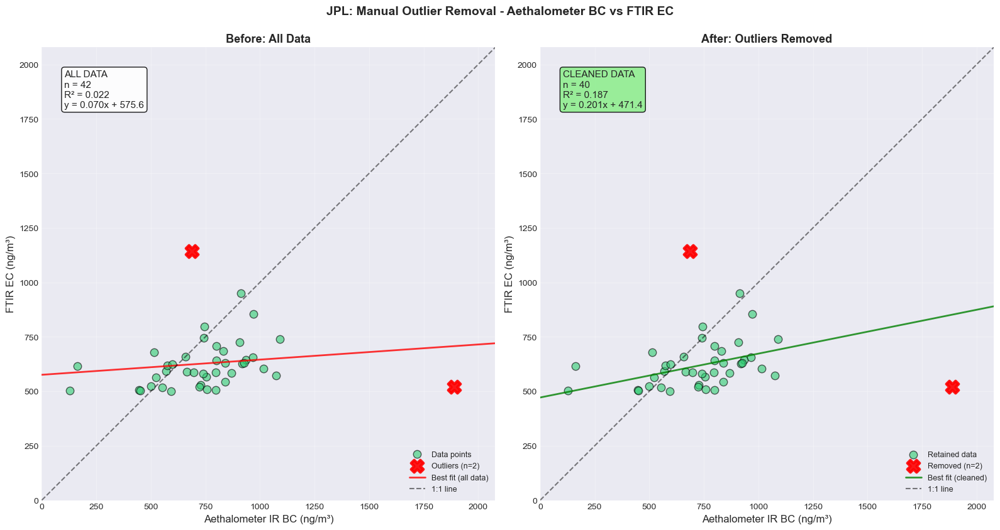


Processing Addis_Ababa...
  Matched 181 data points

Addis_Ababa: No outliers flagged for removal


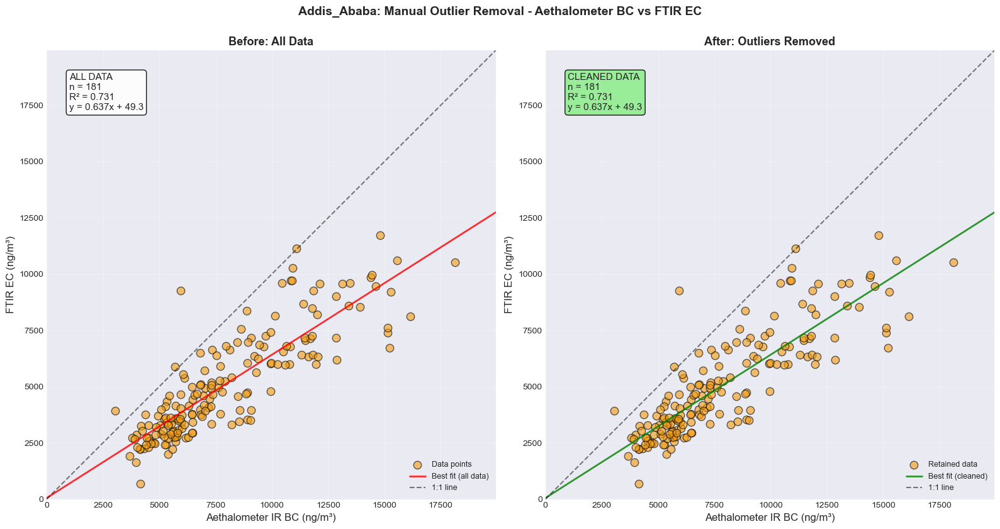


SUMMARY: IMPACT OF OUTLIER REMOVAL

Site            Metric             Before        After       Change
-----------------------------------------------------------------
Beijing         n                      65           64           -1
                R²                  0.197        0.329       +0.131
                Slope               0.556        0.827       +0.272
                Intercept           817.6        473.6       -343.9
-----------------------------------------------------------------
Delhi           n                      24           22           -2
                R²                  0.558        0.737       +0.180
                Slope               0.837        0.842       +0.005
                Intercept         -1194.5       -838.4       +356.1
-----------------------------------------------------------------
JPL             n                      42           40           -2
                R²                  0.022        0.187       +0.164
                S

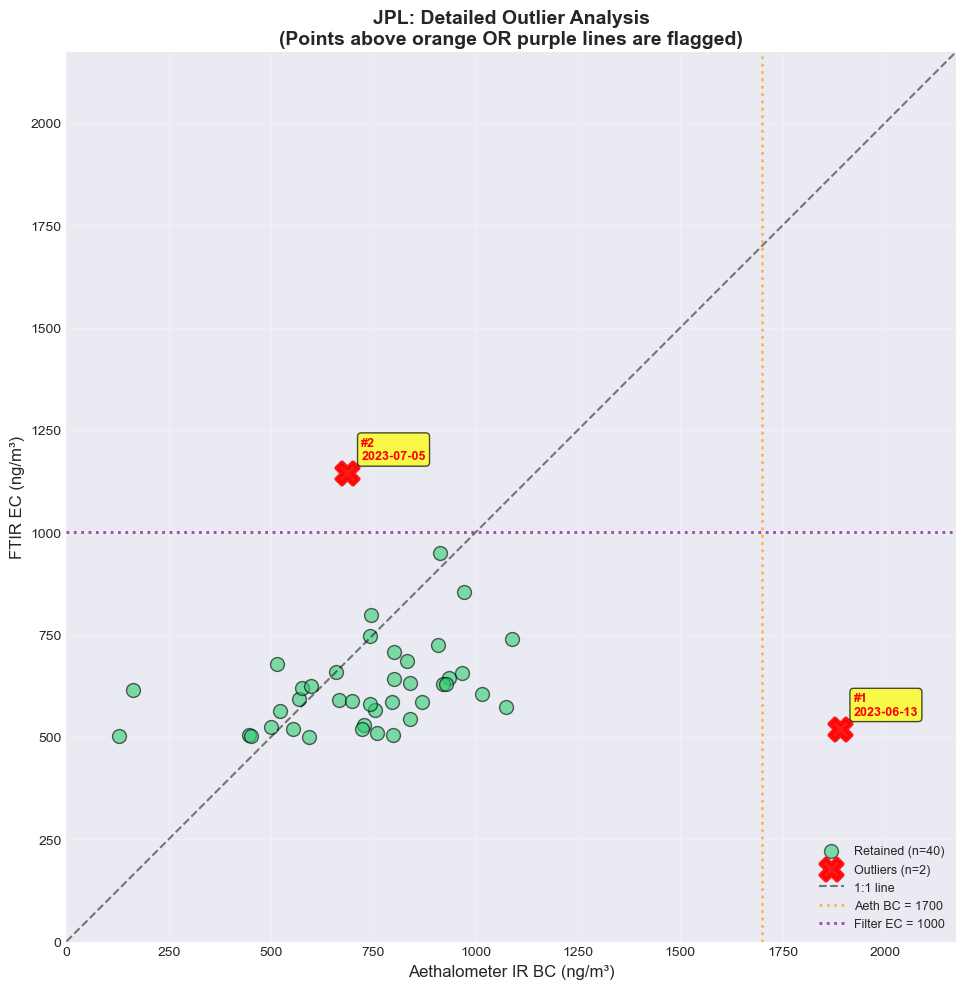


FULL DATA TABLE - ALL JPL POINTS

#    Date            Aeth BC  Filter EC    Ratio    Outlier
------------------------------------------------------------
1    2022-07-22        839.4      631.3     1.33         No
2    2022-07-25        727.1      529.8     1.37         No
3    2022-07-28        799.4      640.8     1.25         No
4    2022-07-31        658.6      659.2     1.00         No
5    2022-08-03        744.5      797.3     0.93         No
6    2022-08-06        568.9      592.9     0.96         No
7    2022-08-09        754.9      565.9     1.33         No
8    2022-08-12        665.8      590.6     1.13         No
9    2022-08-15        797.3      504.8     1.58         No
10   2022-08-18        934.8      643.5     1.45         No
11   2022-08-24       1015.5      604.3     1.68         No
12   2022-08-27        839.2      544.8     1.54         No
13   2022-08-30       1089.9      738.9     1.47         No
14   2023-06-10        127.3      503.0     0.25         No
15  

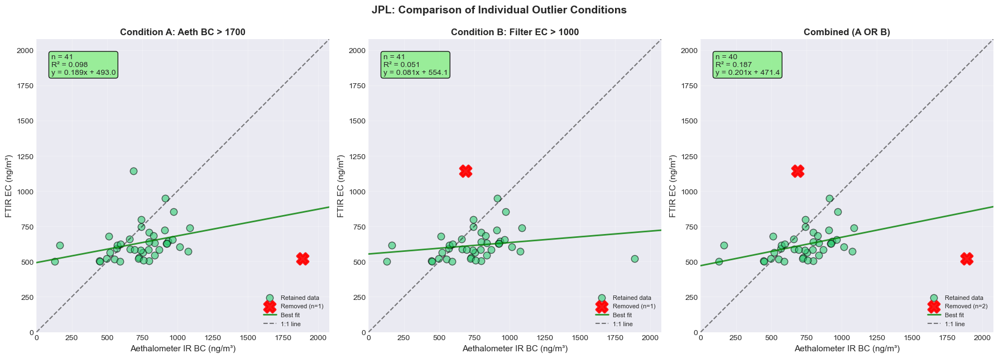


JPL: COMPARISON OF INDIVIDUAL CONDITIONS

Condition                         Removed   Retained         R²      Slope    Intercept
-------------------------------------------------------------------------------------
All Data (no removal)                   0         42      0.022      0.070        575.6
Condition A: Aeth BC > 1700             1         41      0.098      0.189        493.0
Condition B: Filter EC > 1000           1         41      0.051      0.081        554.1
Combined (A OR B)                       2         40      0.187      0.201        471.4
-------------------------------------------------------------------------------------

JPL: POINTS FLAGGED BY EACH CONDITION

Condition A: Aeth BC > 1700: 1 point(s)
  Date              Aeth BC    Filter EC
  ----------------------------------------
  2023-06-13         1889.6        519.8

Condition B: Filter EC > 1000: 1 point(s)
  Date              Aeth BC    Filter EC
  ----------------------------------------
  2023-07-05 

In [77]:
# %% [markdown]
# # Manual Outlier Removal Analysis
# 
# Based on meeting guidance (Dec 3, 2025):
# - **Stop using the algorithmic approach** - it's removing wrong points
# - **Manually identify and remove obvious outliers** based on visual inspection
# - **Create before/after comparison plots** to quantify impact on R² and slope
# 
# ## Outliers to Remove (Identified in Meeting)
# 
# | Site | Points to Remove | Reason |
# |------|-----------------|--------|
# | JPL/Pasadena | Point(s) with FTIR EC > 1000 OR Aeth BC > 1700 | Obvious outlier |
# | Delhi | 2 points with low FTIR EC (~2 μg/m³) but high aethalometer (~10 μg/m³) | High aeth, low EC |
# | Beijing | 1 point way to the far right | Extreme outlier |
# 
# ---

# %%
# =============================================================================
# MANUAL OUTLIER REMOVAL - CONFIGURATION
# =============================================================================
# 
# Define outliers to remove for each site based on visual inspection.
# These are identified by their approximate values - the code will find
# the closest matching points.

MANUAL_OUTLIERS = {
    'Beijing': {
        'description': 'Remove 1 point with extremely high aethalometer BC (far right)',
        'remove_criteria': [
            {'type': 'high_aeth', 'aeth_bc_min': 4000}  # Point with aeth BC > 4000 ng/m³
        ]
    },
    'Delhi': {
        'description': 'Remove 2 points with high aethalometer but low FTIR EC',
        'remove_criteria': [
            {'type': 'high_aeth_low_ec', 'aeth_bc_min': 8000, 'filter_ec_max': 3000}  # High aeth (>8000), low EC (<3000)
        ]
    },
    'JPL': {
        'description': 'Remove point(s) with FTIR EC > 1000 OR aethalometer > 1700',
        'remove_criteria': [
            {'type': 'high_either', 'aeth_bc_min': 1700, 'filter_ec_min': 1000}  # High aeth OR high EC
        ]
    },
    'Addis_Ababa': {
        'description': 'No manual outliers identified yet',
        'remove_criteria': []
    }
}

print("Manual outlier configuration loaded!")
print("\nOutliers to remove:")
for site, config in MANUAL_OUTLIERS.items():
    print(f"  {site}: {config['description']}")

# %%
def match_aeth_filter_data(site_name, df_aeth, filter_data, site_code, min_ec=0.5):
    """
    Match aethalometer and filter data by date.
    
    Parameters:
    -----------
    site_name : str
    df_aeth : DataFrame with aethalometer data
    filter_data : DataFrame with all filter data
    site_code : str (e.g., 'CHTS', 'INDH')
    min_ec : float - minimum EC value to include (μg/m³)
    
    Returns:
    --------
    DataFrame with matched pairs
    """
    # Get FTIR EC data for this site
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'EC_ftir')
    ].copy()
    
    # Filter out values below MDL
    site_filters = site_filters[site_filters['Concentration'] >= min_ec].copy()
    
    if len(site_filters) == 0:
        print(f"  {site_name}: No FTIR EC data available")
        return None
    
    # Match by date (±1 day tolerance)
    matched_records = []
    
    for _, filter_row in site_filters.iterrows():
        filter_date = filter_row['SampleDate']
        
        # Find aethalometer data within ±1 day
        date_match = df_aeth[
            (df_aeth['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
            (df_aeth['day_9am'] <= filter_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0 and 'IR BCc' in date_match.columns:
            if date_match['IR BCc'].notna().any():
                aeth_bc = date_match['IR BCc'].mean()  # ng/m³
                filter_ec = filter_row['Concentration'] * 1000  # μg/m³ to ng/m³
                
                matched_records.append({
                    'date': filter_date,
                    'aeth_bc': aeth_bc,
                    'filter_ec': filter_ec,
                    'filter_id': filter_row.get('FilterId', 'unknown')
                })
    
    if len(matched_records) == 0:
        return None
    
    return pd.DataFrame(matched_records)


def identify_outliers_manual(matched_df, criteria_list):
    """
    Flag outliers based on manual criteria.
    
    Parameters:
    -----------
    matched_df : DataFrame with 'aeth_bc' and 'filter_ec' columns
    criteria_list : list of dicts with removal criteria
    
    Returns:
    --------
    DataFrame with 'is_outlier' and 'outlier_reason' columns added
    """
    matched_df = matched_df.copy()
    matched_df['is_outlier'] = False
    matched_df['outlier_reason'] = ''
    
    for criteria in criteria_list:
        ctype = criteria.get('type', '')
        
        if ctype == 'high_aeth':
            # Flag points with aethalometer BC above threshold
            threshold = criteria.get('aeth_bc_min', np.inf)
            mask = matched_df['aeth_bc'] > threshold
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'high_aeth(>{threshold}); '
            
        elif ctype == 'low_aeth':
            # Flag points with aethalometer BC below threshold
            threshold = criteria.get('aeth_bc_max', 0)
            mask = matched_df['aeth_bc'] < threshold
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'low_aeth(<{threshold}); '
            
        elif ctype == 'high_aeth_low_ec':
            # Flag points with high aethalometer but low filter EC
            aeth_min = criteria.get('aeth_bc_min', np.inf)
            ec_max = criteria.get('filter_ec_max', 0)
            mask = (matched_df['aeth_bc'] > aeth_min) & (matched_df['filter_ec'] < ec_max)
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'high_aeth_low_ec; '
            
        elif ctype == 'low_aeth_high_ec':
            # Flag points with low aethalometer but high filter EC
            aeth_max = criteria.get('aeth_bc_max', 0)
            ec_min = criteria.get('filter_ec_min', np.inf)
            mask = (matched_df['aeth_bc'] < aeth_max) & (matched_df['filter_ec'] > ec_min)
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'low_aeth_high_ec; '
        
        elif ctype == 'high_both':
            # Flag points with BOTH high aethalometer AND high filter EC
            aeth_min = criteria.get('aeth_bc_min', np.inf)
            ec_min = criteria.get('filter_ec_min', np.inf)
            mask = (matched_df['aeth_bc'] > aeth_min) & (matched_df['filter_ec'] > ec_min)
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'high_both(aeth>{aeth_min},ec>{ec_min}); '
        
        elif ctype == 'high_either':
            # Flag points with EITHER high aethalometer OR high filter EC
            aeth_min = criteria.get('aeth_bc_min', np.inf)
            ec_min = criteria.get('filter_ec_min', np.inf)
            mask = (matched_df['aeth_bc'] > aeth_min) | (matched_df['filter_ec'] > ec_min)
            matched_df.loc[mask, 'is_outlier'] = True
            matched_df.loc[mask, 'outlier_reason'] += f'high_either(aeth>{aeth_min} OR ec>{ec_min}); '
    
    return matched_df


def calculate_regression_stats(x, y):
    """Calculate regression statistics."""
    if len(x) < 3:
        return None
    
    # Linear regression
    coefficients = np.polyfit(x, y, 1)
    slope, intercept = coefficients
    
    # R²
    correlation = np.corrcoef(x, y)[0, 1]
    r_squared = correlation ** 2
    
    return {
        'n': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_squared': r_squared
    }


def plot_before_after_outlier_removal(matched_df, site_name, site_color):
    """
    Create side-by-side plots showing data before and after outlier removal.
    
    Left plot: All data with outliers highlighted as red X's
    Right plot: Data with outliers removed (removed points shown as red X's)
    
    Both plots have equal axes locked to the 1:1 line.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # Separate outliers and non-outliers
    outliers = matched_df[matched_df['is_outlier']]
    non_outliers = matched_df[~matched_df['is_outlier']]
    
    # Calculate the axis limits (same for both plots, locked to 1:1)
    all_vals = np.concatenate([matched_df['aeth_bc'].values, matched_df['filter_ec'].values])
    max_val = all_vals.max() * 1.1
    
    # =========================================================================
    # LEFT PLOT: All Data (outliers highlighted as red X's)
    # =========================================================================
    ax1 = axes[0]
    
    # Plot non-outlier points
    ax1.scatter(non_outliers['aeth_bc'], non_outliers['filter_ec'],
               color=site_color, alpha=0.6, s=80,
               edgecolors='black', linewidth=1, label='Data points')
    
    # Highlight outliers as RED X's
    if len(outliers) > 0:
        ax1.scatter(outliers['aeth_bc'], outliers['filter_ec'],
                   color='red', alpha=0.9, s=200, marker='X',
                   linewidths=3, label=f'Outliers (n={len(outliers)})')
    
    # Calculate regression on ALL data
    stats_all = calculate_regression_stats(
        matched_df['aeth_bc'].values, 
        matched_df['filter_ec'].values
    )
    
    if stats_all:
        # Plot regression line
        x_line = np.array([0, max_val])
        y_line = stats_all['slope'] * x_line + stats_all['intercept']
        ax1.plot(x_line, y_line, 'r-', linewidth=2, alpha=0.8, label='Best fit (all data)')
        
        # Stats text
        if stats_all['intercept'] >= 0:
            eq = f"y = {stats_all['slope']:.3f}x + {stats_all['intercept']:.1f}"
        else:
            eq = f"y = {stats_all['slope']:.3f}x - {abs(stats_all['intercept']):.1f}"
        
        stats_text = f"ALL DATA\nn = {stats_all['n']}\nR² = {stats_all['r_squared']:.3f}\n{eq}"
        ax1.text(0.05, 0.95, stats_text, transform=ax1.transAxes, fontsize=11,
                verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
    
    # Lock axes to 1:1
    ax1.set_xlim(0, max_val)
    ax1.set_ylim(0, max_val)
    ax1.set_aspect('equal', adjustable='box')
    
    # Add 1:1 line
    ax1.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
    
    ax1.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=12)
    ax1.set_ylabel('FTIR EC (ng/m³)', fontsize=12)
    ax1.set_title('Before: All Data', fontsize=13, fontweight='bold')
    ax1.legend(loc='lower right', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # =========================================================================
    # RIGHT PLOT: Outliers Removed (shown as red X's)
    # =========================================================================
    ax2 = axes[1]
    
    # Plot non-outliers (retained data)
    ax2.scatter(non_outliers['aeth_bc'], non_outliers['filter_ec'],
               color=site_color, alpha=0.6, s=80,
               edgecolors='black', linewidth=1, label='Retained data')
    
    # Show removed points as RED X's
    if len(outliers) > 0:
        ax2.scatter(outliers['aeth_bc'], outliers['filter_ec'],
                   color='red', alpha=0.9, s=200, marker='X',
                   linewidths=3, label=f'Removed (n={len(outliers)})')
    
    # Calculate regression on CLEANED data only
    if len(non_outliers) >= 3:
        stats_clean = calculate_regression_stats(
            non_outliers['aeth_bc'].values,
            non_outliers['filter_ec'].values
        )
        
        if stats_clean:
            # Plot regression line
            x_line = np.array([0, max_val])
            y_line = stats_clean['slope'] * x_line + stats_clean['intercept']
            ax2.plot(x_line, y_line, 'g-', linewidth=2, alpha=0.8, label='Best fit (cleaned)')
            
            # Stats text
            if stats_clean['intercept'] >= 0:
                eq = f"y = {stats_clean['slope']:.3f}x + {stats_clean['intercept']:.1f}"
            else:
                eq = f"y = {stats_clean['slope']:.3f}x - {abs(stats_clean['intercept']):.1f}"
            
            stats_text = f"CLEANED DATA\nn = {stats_clean['n']}\nR² = {stats_clean['r_squared']:.3f}\n{eq}"
            ax2.text(0.05, 0.95, stats_text, transform=ax2.transAxes, fontsize=11,
                    verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))
    else:
        stats_clean = None
    
    # Lock axes to 1:1 (same limits as left plot)
    ax2.set_xlim(0, max_val)
    ax2.set_ylim(0, max_val)
    ax2.set_aspect('equal', adjustable='box')
    
    # Add 1:1 line
    ax2.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
    
    ax2.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=12)
    ax2.set_ylabel('FTIR EC (ng/m³)', fontsize=12)
    ax2.set_title('After: Outliers Removed', fontsize=13, fontweight='bold')
    ax2.legend(loc='lower right', fontsize=9)
    ax2.grid(True, alpha=0.3)
    
    # Main title
    fig.suptitle(f'{site_name}: Manual Outlier Removal - Aethalometer BC vs FTIR EC',
                fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()
    
    return stats_all, stats_clean


def print_outlier_details(matched_df, site_name):
    """Print details of removed outliers."""
    outliers = matched_df[matched_df['is_outlier']]
    
    if len(outliers) == 0:
        print(f"\n{site_name}: No outliers flagged for removal")
        return
    
    print(f"\n{site_name}: {len(outliers)} point(s) flagged for removal:")
    print(f"  {'Date':<12s} {'Aeth BC':>12s} {'Filter EC':>12s} {'Reason'}")
    print("  " + "-" * 60)
    
    for _, row in outliers.iterrows():
        print(f"  {str(row['date'].date()):<12s} "
              f"{row['aeth_bc']:>12.1f} "
              f"{row['filter_ec']:>12.1f} "
              f"{row['outlier_reason']}")


def print_comparison_table(results):
    """Print a comparison table of before/after statistics."""
    print("\n" + "="*80)
    print("SUMMARY: IMPACT OF OUTLIER REMOVAL")
    print("="*80)
    print(f"\n{'Site':<15s} {'Metric':<12s} {'Before':>12s} {'After':>12s} {'Change':>12s}")
    print("-" * 65)
    
    for site_name, (stats_all, stats_clean) in results.items():
        if stats_all is None:
            continue
            
        # n
        n_before = stats_all['n']
        n_after = stats_clean['n'] if stats_clean else 0
        print(f"{site_name:<15s} {'n':<12s} {n_before:>12d} {n_after:>12d} {n_after - n_before:>+12d}")
        
        # R²
        r2_before = stats_all['r_squared']
        r2_after = stats_clean['r_squared'] if stats_clean else 0
        print(f"{'':<15s} {'R²':<12s} {r2_before:>12.3f} {r2_after:>12.3f} {r2_after - r2_before:>+12.3f}")
        
        # Slope
        slope_before = stats_all['slope']
        slope_after = stats_clean['slope'] if stats_clean else 0
        print(f"{'':<15s} {'Slope':<12s} {slope_before:>12.3f} {slope_after:>12.3f} {slope_after - slope_before:>+12.3f}")
        
        # Intercept
        int_before = stats_all['intercept']
        int_after = stats_clean['intercept'] if stats_clean else 0
        print(f"{'':<15s} {'Intercept':<12s} {int_before:>12.1f} {int_after:>12.1f} {int_after - int_before:>+12.1f}")
        
        print("-" * 65)

print("Functions defined!")

# %% [markdown]
# ## Run Manual Outlier Removal Analysis
# 
# This will:
# 1. Match aethalometer and filter data for each site
# 2. Flag outliers based on the manual criteria defined above
# 3. Create before/after comparison plots
# 4. Print summary statistics

# %%
print("="*80)
print("MANUAL OUTLIER REMOVAL ANALYSIS")
print("="*80)

# Store results for summary table
all_results = {}

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name not in aethalometer_data:
        print(f"\n{site_name}: No aethalometer data available")
        continue
    
    print(f"\n{'='*60}")
    print(f"Processing {site_name}...")
    print(f"{'='*60}")
    
    config = SITES[site_name]
    df_aeth = aethalometer_data[site_name]
    
    # Step 1: Match aethalometer and filter data
    matched_df = match_aeth_filter_data(
        site_name, df_aeth, filter_data, config['code']
    )
    
    if matched_df is None or len(matched_df) < 3:
        print(f"  Insufficient matched data for {site_name}")
        continue
    
    print(f"  Matched {len(matched_df)} data points")
    
    # Step 2: Flag outliers based on manual criteria
    outlier_config = MANUAL_OUTLIERS.get(site_name, {'remove_criteria': []})
    matched_df = identify_outliers_manual(
        matched_df, 
        outlier_config['remove_criteria']
    )
    
    # Step 3: Print outlier details
    print_outlier_details(matched_df, site_name)
    
    # Step 4: Create before/after plots
    stats_all, stats_clean = plot_before_after_outlier_removal(
        matched_df, site_name, config['color']
    )
    
    all_results[site_name] = (stats_all, stats_clean)

# Step 5: Print comparison summary
print_comparison_table(all_results)

# %% [markdown]
# ## JPL Detailed Outlier Analysis
# 
# Show each point flagged for removal at JPL with full details.

# %%
# =============================================================================
# JPL - DETAILED POINT-BY-POINT ANALYSIS
# =============================================================================

if 'JPL' in aethalometer_data:
    print("="*80)
    print("JPL - DETAILED POINT-BY-POINT OUTLIER ANALYSIS")
    print("="*80)
    
    config = SITES['JPL']
    df_aeth = aethalometer_data['JPL']
    
    # Match data
    matched_df = match_aeth_filter_data('JPL', df_aeth, filter_data, config['code'])
    
    if matched_df is not None and len(matched_df) >= 3:
        # Apply outlier criteria
        outlier_config = MANUAL_OUTLIERS.get('JPL', {'remove_criteria': []})
        matched_df = identify_outliers_manual(matched_df, outlier_config['remove_criteria'])
        
        # Calculate ratio and distance from 1:1 for context
        matched_df['ratio'] = matched_df['aeth_bc'] / matched_df['filter_ec']
        matched_df['distance_from_1to1'] = abs(matched_df['filter_ec'] - matched_df['aeth_bc']) / np.sqrt(2)
        
        # Separate outliers
        outliers = matched_df[matched_df['is_outlier']].copy()
        non_outliers = matched_df[~matched_df['is_outlier']].copy()
        
        print(f"\nTotal matched points: {len(matched_df)}")
        print(f"Points flagged as outliers: {len(outliers)}")
        print(f"Points retained: {len(non_outliers)}")
        
        # Show thresholds being used
        print(f"\n--- Current Thresholds ---")
        print(f"  Flagging points where: Aeth BC > 1700 OR Filter EC > 1000 ng/m³")
        
        # Show all outlier points with full details
        if len(outliers) > 0:
            print(f"\n{'='*80}")
            print("FLAGGED OUTLIER POINTS (will be removed)")
            print("="*80)
            
            for idx, (_, row) in enumerate(outliers.iterrows(), 1):
                print(f"\n--- Outlier #{idx} ---")
                print(f"  Date:              {row['date'].date()}")
                print(f"  Filter ID:         {row['filter_id']}")
                print(f"  Aethalometer BC:   {row['aeth_bc']:.1f} ng/m³", end="")
                if row['aeth_bc'] > 1700:
                    print("  ⚠️ EXCEEDS 1700 threshold")
                else:
                    print("")
                print(f"  Filter EC:         {row['filter_ec']:.1f} ng/m³", end="")
                if row['filter_ec'] > 1000:
                    print("  ⚠️ EXCEEDS 1000 threshold")
                else:
                    print("")
                print(f"  Aeth/EC Ratio:     {row['ratio']:.2f}")
                print(f"  Distance from 1:1: {row['distance_from_1to1']:.1f} ng/m³")
                print(f"  Removal Reason:    {row['outlier_reason']}")
        
        # Show summary statistics for comparison
        print(f"\n{'='*80}")
        print("COMPARISON: Outliers vs Retained Data")
        print("="*80)
        
        print(f"\n{'Metric':<25s} {'Outliers':>15s} {'Retained':>15s}")
        print("-" * 55)
        
        if len(outliers) > 0:
            print(f"{'n':<25s} {len(outliers):>15d} {len(non_outliers):>15d}")
            print(f"{'Mean Aeth BC (ng/m³)':<25s} {outliers['aeth_bc'].mean():>15.1f} {non_outliers['aeth_bc'].mean():>15.1f}")
            print(f"{'Mean Filter EC (ng/m³)':<25s} {outliers['filter_ec'].mean():>15.1f} {non_outliers['filter_ec'].mean():>15.1f}")
            print(f"{'Mean Ratio (Aeth/EC)':<25s} {outliers['ratio'].mean():>15.2f} {non_outliers['ratio'].mean():>15.2f}")
            print(f"{'Mean Dist from 1:1':<25s} {outliers['distance_from_1to1'].mean():>15.1f} {non_outliers['distance_from_1to1'].mean():>15.1f}")
        
        # Create a detailed scatter plot for JPL only
        fig, ax = plt.subplots(figsize=(10, 10))
        
        # Plot retained points
        ax.scatter(non_outliers['aeth_bc'], non_outliers['filter_ec'],
                  color=config['color'], alpha=0.6, s=100,
                  edgecolors='black', linewidth=1, label=f'Retained (n={len(non_outliers)})')
        
        # Plot outliers as red X with labels
        if len(outliers) > 0:
            ax.scatter(outliers['aeth_bc'], outliers['filter_ec'],
                      color='red', alpha=0.9, s=250, marker='X',
                      linewidths=3, label=f'Outliers (n={len(outliers)})')
            
            # Add labels to each outlier point
            for idx, (_, row) in enumerate(outliers.iterrows(), 1):
                ax.annotate(f'#{idx}\n{row["date"].date()}',
                           xy=(row['aeth_bc'], row['filter_ec']),
                           xytext=(10, 10), textcoords='offset points',
                           fontsize=9, color='red', fontweight='bold',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7))
        
        # Lock axes to 1:1
        all_vals = np.concatenate([matched_df['aeth_bc'].values, matched_df['filter_ec'].values])
        max_val = all_vals.max() * 1.15
        ax.set_xlim(0, max_val)
        ax.set_ylim(0, max_val)
        ax.set_aspect('equal', adjustable='box')
        
        # Add 1:1 line
        ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
        
        # Add threshold lines
        ax.axvline(x=1700, color='orange', linestyle=':', linewidth=2, alpha=0.7, label='Aeth BC = 1700')
        ax.axhline(y=1000, color='purple', linestyle=':', linewidth=2, alpha=0.7, label='Filter EC = 1000')
        
        ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=12)
        ax.set_ylabel('FTIR EC (ng/m³)', fontsize=12)
        ax.set_title('JPL: Detailed Outlier Analysis\n(Points above orange OR purple lines are flagged)', 
                    fontsize=14, fontweight='bold')
        ax.legend(loc='lower right', fontsize=9)
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Print the full data table
        print(f"\n{'='*80}")
        print("FULL DATA TABLE - ALL JPL POINTS")
        print("="*80)
        print(f"\n{'#':<4s} {'Date':<12s} {'Aeth BC':>10s} {'Filter EC':>10s} {'Ratio':>8s} {'Outlier':>10s}")
        print("-" * 60)
        
        for idx, (_, row) in enumerate(matched_df.sort_values('date').iterrows(), 1):
            outlier_flag = "⚠️ YES" if row['is_outlier'] else "No"
            print(f"{idx:<4d} {str(row['date'].date()):<12s} {row['aeth_bc']:>10.1f} {row['filter_ec']:>10.1f} {row['ratio']:>8.2f} {outlier_flag:>10s}")
    
    else:
        print("Insufficient matched data for JPL")
else:
    print("JPL data not available")

# %% [markdown]
# ## JPL: Individual Condition Analysis
# 
# This section shows the impact of each outlier condition separately for JPL:
# 1. **Condition A**: Remove points where `aeth_bc > 1700` only
# 2. **Condition B**: Remove points where `filter_ec > 1000` only
# 3. **Combined**: Remove points where either condition is true (OR)
# 
# This helps you see which condition has more impact on R² and slope.

# %%
def plot_jpl_individual_conditions(df_aeth, filter_data, site_config):
    """
    Create separate plots for JPL showing the effect of each outlier condition individually.
    """
    site_code = site_config['code']
    site_color = site_config['color']
    
    # Match data
    matched_df = match_aeth_filter_data('JPL', df_aeth, filter_data, site_code)
    
    if matched_df is None or len(matched_df) < 3:
        print("Insufficient matched data for JPL")
        return
    
    print(f"JPL: {len(matched_df)} matched data points")
    
    # Define the three conditions
    conditions = {
        'Condition A: Aeth BC > 1700': matched_df['aeth_bc'] > 1700,
        'Condition B: Filter EC > 1000': matched_df['filter_ec'] > 1000,
        'Combined (A OR B)': (matched_df['aeth_bc'] > 1700) | (matched_df['filter_ec'] > 1000)
    }
    
    # Calculate axis limits (same for all plots)
    all_vals = np.concatenate([matched_df['aeth_bc'].values, matched_df['filter_ec'].values])
    max_val = all_vals.max() * 1.1
    
    # Create figure with 3 columns
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    results = {}
    
    for idx, (condition_name, mask) in enumerate(conditions.items()):
        ax = axes[idx]
        
        outliers = matched_df[mask]
        non_outliers = matched_df[~mask]
        
        # Plot retained data points
        ax.scatter(non_outliers['aeth_bc'], non_outliers['filter_ec'],
                  color=site_color, alpha=0.6, s=80,
                  edgecolors='black', linewidth=1, label='Retained data')
        
        # Plot removed points as red X's
        if len(outliers) > 0:
            ax.scatter(outliers['aeth_bc'], outliers['filter_ec'],
                      color='red', alpha=0.9, s=200, marker='X',
                      linewidths=3, label=f'Removed (n={len(outliers)})')
        
        # Calculate regression on cleaned data
        if len(non_outliers) >= 3:
            stats = calculate_regression_stats(
                non_outliers['aeth_bc'].values,
                non_outliers['filter_ec'].values
            )
            
            if stats:
                # Plot regression line
                x_line = np.array([0, max_val])
                y_line = stats['slope'] * x_line + stats['intercept']
                ax.plot(x_line, y_line, 'g-', linewidth=2, alpha=0.8, label='Best fit')
                
                # Stats text
                if stats['intercept'] >= 0:
                    eq = f"y = {stats['slope']:.3f}x + {stats['intercept']:.1f}"
                else:
                    eq = f"y = {stats['slope']:.3f}x - {abs(stats['intercept']):.1f}"
                
                stats_text = f"n = {stats['n']}\nR² = {stats['r_squared']:.3f}\n{eq}"
                ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
                       verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))
                
                results[condition_name] = {
                    'n_removed': len(outliers),
                    'n_retained': len(non_outliers),
                    **stats
                }
        
        # Lock axes to 1:1
        ax.set_xlim(0, max_val)
        ax.set_ylim(0, max_val)
        ax.set_aspect('equal', adjustable='box')
        
        # Add 1:1 line
        ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
        
        ax.set_xlabel('Aethalometer IR BC (ng/m³)', fontsize=11)
        ax.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
        ax.set_title(condition_name, fontsize=12, fontweight='bold')
        ax.legend(loc='lower right', fontsize=8)
        ax.grid(True, alpha=0.3)
    
    fig.suptitle('JPL: Comparison of Individual Outlier Conditions', 
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Also calculate stats for ALL data (no removal)
    stats_all = calculate_regression_stats(
        matched_df['aeth_bc'].values,
        matched_df['filter_ec'].values
    )
    
    # Print comparison table
    print("\n" + "="*80)
    print("JPL: COMPARISON OF INDIVIDUAL CONDITIONS")
    print("="*80)
    print(f"\n{'Condition':<30s} {'Removed':>10s} {'Retained':>10s} {'R²':>10s} {'Slope':>10s} {'Intercept':>12s}")
    print("-" * 85)
    
    # All data row
    print(f"{'All Data (no removal)':<30s} {0:>10d} {stats_all['n']:>10d} {stats_all['r_squared']:>10.3f} {stats_all['slope']:>10.3f} {stats_all['intercept']:>12.1f}")
    
    # Each condition
    for condition_name, stats in results.items():
        print(f"{condition_name:<30s} {stats['n_removed']:>10d} {stats['n_retained']:>10d} {stats['r_squared']:>10.3f} {stats['slope']:>10.3f} {stats['intercept']:>12.1f}")
    
    print("-" * 85)
    
    # Show which points are flagged by each condition
    print("\n" + "="*80)
    print("JPL: POINTS FLAGGED BY EACH CONDITION")
    print("="*80)
    
    for condition_name, mask in conditions.items():
        outliers = matched_df[mask]
        print(f"\n{condition_name}: {len(outliers)} point(s)")
        if len(outliers) > 0:
            print(f"  {'Date':<12s} {'Aeth BC':>12s} {'Filter EC':>12s}")
            print("  " + "-" * 40)
            for _, row in outliers.iterrows():
                print(f"  {str(row['date'].date()):<12s} {row['aeth_bc']:>12.1f} {row['filter_ec']:>12.1f}")
    
    return results


# Run JPL individual condition analysis
if 'JPL' in aethalometer_data:
    print("="*80)
    print("JPL: INDIVIDUAL CONDITION ANALYSIS")
    print("="*80)
    
    jpl_results = plot_jpl_individual_conditions(
        aethalometer_data['JPL'],
        filter_data,
        SITES['JPL']
    )
else:
    print("JPL data not available")

# %% [markdown]
# ## Adjust Outlier Thresholds
# 
# If the automatic flagging isn't catching the right points, you can:
# 
# 1. **Look at the "Before" plot** to identify the exact values of outliers
# 2. **Update the thresholds** in the `MANUAL_OUTLIERS` configuration above
# 3. **Re-run the analysis**
# 
# ### Current Thresholds:
# 
# - **Beijing**: `aeth_bc > 4000` ng/m³
# - **Delhi**: `aeth_bc > 8000` AND `filter_ec < 3000` ng/m³
# - **JPL**: `aeth_bc > 1700` OR `filter_ec > 1000` ng/m³

# %%
# =============================================================================
# INTERACTIVE THRESHOLD ADJUSTMENT
# =============================================================================
# 
# Use this cell to explore your data and find the right thresholds.

def explore_data_for_thresholds(site_name):
    """Show data distribution to help set thresholds."""
    if site_name not in aethalometer_data:
        print(f"No data for {site_name}")
        return
    
    config = SITES[site_name]
    matched_df = match_aeth_filter_data(
        site_name, 
        aethalometer_data[site_name], 
        filter_data, 
        config['code']
    )
    
    if matched_df is None:
        print(f"No matched data for {site_name}")
        return
    
    print(f"\n{site_name} Data Summary:")
    print(f"  n = {len(matched_df)}")
    print(f"\n  Aethalometer BC (ng/m³):")
    print(f"    Min:    {matched_df['aeth_bc'].min():>10.1f}")
    print(f"    25%:    {matched_df['aeth_bc'].quantile(0.25):>10.1f}")
    print(f"    Median: {matched_df['aeth_bc'].median():>10.1f}")
    print(f"    75%:    {matched_df['aeth_bc'].quantile(0.75):>10.1f}")
    print(f"    Max:    {matched_df['aeth_bc'].max():>10.1f}")
    
    print(f"\n  Filter EC (ng/m³):")
    print(f"    Min:    {matched_df['filter_ec'].min():>10.1f}")
    print(f"    25%:    {matched_df['filter_ec'].quantile(0.25):>10.1f}")
    print(f"    Median: {matched_df['filter_ec'].median():>10.1f}")
    print(f"    75%:    {matched_df['filter_ec'].quantile(0.75):>10.1f}")
    print(f"    Max:    {matched_df['filter_ec'].max():>10.1f}")
    
    # Show potential outliers (top/bottom 3 by aeth_bc)
    print(f"\n  Top 3 by Aethalometer BC:")
    top3 = matched_df.nlargest(3, 'aeth_bc')
    for _, row in top3.iterrows():
        print(f"    {row['date'].date()}: Aeth={row['aeth_bc']:.1f}, EC={row['filter_ec']:.1f}")
    
    print(f"\n  Bottom 3 by Aethalometer BC:")
    bottom3 = matched_df.nsmallest(3, 'aeth_bc')
    for _, row in bottom3.iterrows():
        print(f"    {row['date'].date()}: Aeth={row['aeth_bc']:.1f}, EC={row['filter_ec']:.1f}")
    
    # Show points with high aeth/ec ratio (potential Delhi-style outliers)
    matched_df['ratio'] = matched_df['aeth_bc'] / matched_df['filter_ec']
    print(f"\n  Top 3 by Aeth/EC Ratio (potential outliers):")
    top_ratio = matched_df.nlargest(3, 'ratio')
    for _, row in top_ratio.iterrows():
        print(f"    {row['date'].date()}: Aeth={row['aeth_bc']:.1f}, EC={row['filter_ec']:.1f}, Ratio={row['ratio']:.2f}")
    
    return matched_df

# Explore each site
print("="*80)
print("DATA EXPLORATION FOR THRESHOLD SETTING")
print("="*80)

for site in ['Beijing', 'Delhi', 'JPL']:
    explore_data_for_thresholds(site)
    print()

# %% [markdown]
# ## Optional: Future Systematic Approaches
# 
# Once you understand the data better, you can implement these approaches:
# 
# ### Option 1: Ratio-Based Flagging
# Flag points where (aethalometer/EC) ratio is far from 1

# %%
def flag_by_ratio(matched_df, ratio_min=0.3, ratio_max=3.0):
    """
    Flag points where aethalometer/EC ratio is outside acceptable range.
    
    Parameters:
    -----------
    matched_df : DataFrame
    ratio_min : float - minimum acceptable ratio (default 0.3 = EC is 3x higher than aeth)
    ratio_max : float - maximum acceptable ratio (default 3.0 = aeth is 3x higher than EC)
    """
    df = matched_df.copy()
    df['ratio'] = df['aeth_bc'] / df['filter_ec']
    df['is_outlier_ratio'] = (df['ratio'] < ratio_min) | (df['ratio'] > ratio_max)
    
    outliers = df[df['is_outlier_ratio']]
    print(f"Ratio-based flagging (acceptable range: {ratio_min} to {ratio_max}):")
    print(f"  Flagged {len(outliers)} of {len(df)} points")
    
    if len(outliers) > 0:
        print(f"\n  Flagged points:")
        for _, row in outliers.iterrows():
            print(f"    {row['date'].date()}: Aeth={row['aeth_bc']:.1f}, EC={row['filter_ec']:.1f}, Ratio={row['ratio']:.2f}")
    
    return df

# Example usage (uncomment to run):
# matched_df = match_aeth_filter_data('Beijing', aethalometer_data['Beijing'], filter_data, 'CHTS')
# flag_by_ratio(matched_df, ratio_min=0.5, ratio_max=2.0)

# %% [markdown]
# ### Option 2: Distance from 1:1 Line
# Flag points furthest from where they "should" be on the 1:1 line

# %%
def flag_by_distance_from_1to1(matched_df, distance_threshold_pct=50):
    """
    Flag points based on perpendicular distance from the 1:1 line.
    
    Parameters:
    -----------
    matched_df : DataFrame
    distance_threshold_pct : float - flag points with distance > this percentile
    """
    df = matched_df.copy()
    
    # Perpendicular distance from y=x line
    # For point (x0, y0), distance to line y=x is |y0-x0|/sqrt(2)
    df['distance_from_1to1'] = abs(df['filter_ec'] - df['aeth_bc']) / np.sqrt(2)
    
    # Calculate threshold based on percentile
    threshold = np.percentile(df['distance_from_1to1'], distance_threshold_pct)
    df['is_outlier_distance'] = df['distance_from_1to1'] > threshold
    
    outliers = df[df['is_outlier_distance']]
    print(f"Distance-based flagging (threshold: {distance_threshold_pct}th percentile = {threshold:.1f} ng/m³):")
    print(f"  Flagged {len(outliers)} of {len(df)} points")
    
    if len(outliers) > 0:
        print(f"\n  Flagged points:")
        for _, row in outliers.iterrows():
            print(f"    {row['date'].date()}: Aeth={row['aeth_bc']:.1f}, EC={row['filter_ec']:.1f}, Distance={row['distance_from_1to1']:.1f}")
    
    return df

# Example usage (uncomment to run):
# matched_df = match_aeth_filter_data('Delhi', aethalometer_data['Delhi'], filter_data, 'INDH')
# flag_by_distance_from_1to1(matched_df, distance_threshold_pct=90)

# %% [markdown]
# ## Key Takeaways
# 
# 1. **Manual removal is preferred** for now until you understand the data better
# 2. **Document every point removed** and why (the code does this automatically)
# 3. **Compare R² and slope** before/after to quantify the impact
# 4. **"Influential points"** are points that significantly change regression results when removed
# 5. **Don't force identical methods** across all sites - understand each dataset first

In [78]:
# =============================================================================
# CENTRALIZED OUTLIER REGISTRY (HYBRID: THRESHOLD + DATE-BASED)
# =============================================================================
# 
# This registry supports TWO modes of exclusion:
#   1. THRESHOLD-BASED: Automatically excludes points matching criteria (like before)
#   2. DATE-BASED: Excludes specific dates/filter_ids for precise control
#
# The 'reason' field documents WHY the point was excluded.
#
# ADVANTAGES:
# - Single source of truth - All exclusions defined in one place
# - Documented - Each exclusion has a reason attached
# - Consistent - Same exclusions applied to all analyses
# - Flexible - Use thresholds for automatic detection OR dates for precision
#

EXCLUDED_SAMPLES = {
    'Beijing': {
        'description': 'Remove 1 point with extremely high aethalometer BC (far right)',
        # THRESHOLD-BASED CRITERIA (automatic detection)
        'threshold_criteria': [
            {'type': 'high_aeth', 'aeth_bc_min': 4000, 
             'reason': 'Extreme aethalometer BC outlier (>4000 ng/m³)'}
        ],
        # DATE-BASED EXCLUSIONS (for specific known outliers - optional)
        'date_exclusions': [
            # Add specific dates here once identified:
            # {'date': '2022-05-15', 'filter_id': None, 'reason': 'Manual exclusion'}
        ]
    },
    'Delhi': {
        'description': 'Remove 2 points with high aethalometer but low FTIR EC',
        'threshold_criteria': [
            {'type': 'high_aeth_low_ec', 'aeth_bc_min': 8000, 'filter_ec_max': 3000,
             'reason': 'High aethalometer (>8000) with low FTIR EC (<3000) - measurement issue'}
        ],
        'date_exclusions': []
    },
    'JPL': {
        'description': 'Remove point(s) with FTIR EC > 1000 OR aethalometer > 1700',
        'threshold_criteria': [
            {'type': 'high_either', 'aeth_bc_min': 1700, 'filter_ec_min': 1000,
             'reason': 'High aethalometer (>1700) OR high FTIR EC (>1000)'}
        ],
        'date_exclusions': []
    },
    'Addis_Ababa': {
        'description': 'No manual outliers identified yet',
        'threshold_criteria': [],
        'date_exclusions': []
    }
}


def apply_exclusion_flags(matched_df, site_name, date_tolerance_days=1):
    """
    Apply exclusion flags based on BOTH threshold criteria AND date-based exclusions.
    
    Parameters:
    -----------
    matched_df : DataFrame with 'date', 'aeth_bc', 'filter_ec' columns
    site_name : str
    date_tolerance_days : int - tolerance for date matching (default ±1 day)
    
    Returns:
    --------
    DataFrame with added columns:
    - 'is_excluded': Boolean flag
    - 'exclusion_reason': String explaining why (empty if not excluded)
    """
    matched_df = matched_df.copy()
    matched_df['is_excluded'] = False
    matched_df['exclusion_reason'] = ''
    
    site_config = EXCLUDED_SAMPLES.get(site_name, {})
    
    # =========================================================================
    # 1. APPLY THRESHOLD-BASED CRITERIA (like original MANUAL_OUTLIERS)
    # =========================================================================
    for criteria in site_config.get('threshold_criteria', []):
        crit_type = criteria.get('type', '')
        reason = criteria.get('reason', f'Threshold: {crit_type}')
        mask = pd.Series([False] * len(matched_df), index=matched_df.index)
        
        if crit_type == 'high_aeth':
            threshold = criteria.get('aeth_bc_min', float('inf'))
            mask = matched_df['aeth_bc'] > threshold
            
        elif crit_type == 'low_aeth':
            threshold = criteria.get('aeth_bc_max', 0)
            mask = matched_df['aeth_bc'] < threshold
            
        elif crit_type == 'high_aeth_low_ec':
            aeth_min = criteria.get('aeth_bc_min', float('inf'))
            ec_max = criteria.get('filter_ec_max', 0)
            mask = (matched_df['aeth_bc'] > aeth_min) & (matched_df['filter_ec'] < ec_max)
            
        elif crit_type == 'low_aeth_high_ec':
            aeth_max = criteria.get('aeth_bc_max', 0)
            ec_min = criteria.get('filter_ec_min', float('inf'))
            mask = (matched_df['aeth_bc'] < aeth_max) & (matched_df['filter_ec'] > ec_min)
            
        elif crit_type == 'high_both':
            aeth_min = criteria.get('aeth_bc_min', float('inf'))
            ec_min = criteria.get('filter_ec_min', float('inf'))
            mask = (matched_df['aeth_bc'] > aeth_min) & (matched_df['filter_ec'] > ec_min)
            
        elif crit_type == 'high_either':
            aeth_min = criteria.get('aeth_bc_min', float('inf'))
            ec_min = criteria.get('filter_ec_min', float('inf'))
            mask = (matched_df['aeth_bc'] > aeth_min) | (matched_df['filter_ec'] > ec_min)
        
        # Apply exclusion
        matched_df.loc[mask, 'is_excluded'] = True
        for idx in matched_df[mask].index:
            existing = matched_df.loc[idx, 'exclusion_reason']
            if existing:
                matched_df.loc[idx, 'exclusion_reason'] = f"{existing}; {reason}"
            else:
                matched_df.loc[idx, 'exclusion_reason'] = reason
    
    # =========================================================================
    # 2. APPLY DATE-BASED EXCLUSIONS (for precise control)
    # =========================================================================
    for exclusion in site_config.get('date_exclusions', []):
        excl_date = pd.to_datetime(exclusion['date'])
        excl_filter_id = exclusion.get('filter_id')
        excl_reason = exclusion.get('reason', 'Manual date exclusion')
        
        # Match by date (with tolerance)
        date_mask = (
            (matched_df['date'] >= excl_date - pd.Timedelta(days=date_tolerance_days)) &
            (matched_df['date'] <= excl_date + pd.Timedelta(days=date_tolerance_days))
        )
        
        # Optionally also match by filter_id if provided
        if excl_filter_id and 'filter_id' in matched_df.columns:
            date_mask = date_mask & (matched_df['filter_id'] == excl_filter_id)
        
        # Apply exclusion
        matched_df.loc[date_mask, 'is_excluded'] = True
        for idx in matched_df[date_mask].index:
            existing = matched_df.loc[idx, 'exclusion_reason']
            if existing:
                matched_df.loc[idx, 'exclusion_reason'] = f"{existing}; {excl_reason}"
            else:
                matched_df.loc[idx, 'exclusion_reason'] = excl_reason
    
    return matched_df


def get_clean_data(matched_df):
    """Return only non-excluded data points."""
    if 'is_excluded' not in matched_df.columns:
        return matched_df
    return matched_df[~matched_df['is_excluded']].copy()


def get_excluded_data(matched_df):
    """Return only excluded data points."""
    if 'is_excluded' not in matched_df.columns:
        return pd.DataFrame()
    return matched_df[matched_df['is_excluded']].copy()


def print_exclusion_summary(matched_df, site_name):
    """Print a summary of excluded vs retained data."""
    if 'is_excluded' not in matched_df.columns:
        print(f"{site_name}: No exclusion flags applied")
        return
    
    n_total = len(matched_df)
    n_excluded = matched_df['is_excluded'].sum()
    n_retained = n_total - n_excluded
    
    print(f"\n
{site_name} Exclusion Summary:")
    print(f"  Total matched points: {n_total}")
    print(f"  Excluded: {n_excluded}")
    print(f"  Retained: {n_retained}")
    
    if n_excluded > 0:
        excluded = matched_df[matched_df['is_excluded']]
        print(f"\n
  Excluded points:")
        print(f"  {'Date':<12s} {'Aeth BC':>10s} {'Filter EC':>10s} {'Reason'}")
        print("  " + "-" * 70)
        
        for _, row in excluded.iterrows():
            aeth_bc = row.get('aeth_bc', np.nan)
            filter_ec = row.get('filter_ec', np.nan)
            date_str = str(row['date'].date()) if hasattr(row['date'], 'date') else str(row['date'])[:10]
            reason = row['exclusion_reason'][:40] if len(row['exclusion_reason']) > 40 else row['exclusion_reason']
            
            print(f"  {date_str:<12s} {aeth_bc:>10.0f} {filter_ec:>10.0f} {reason}")


def match_aeth_filter_data_with_exclusions(site_name, df_aeth, filter_data, site_code, min_ec=0.5):
    """
    Match aethalometer and filter data, then apply exclusion flags from the registry.
    
    This is a wrapper around match_aeth_filter_data that automatically applies
    the centralized exclusion flags (both threshold and date-based).
    """
    # First, do the regular matching
    matched_df = match_aeth_filter_data(site_name, df_aeth, filter_data, site_code, min_ec)
    
    if matched_df is None:
        return None
    
    # Apply exclusion flags from the centralized registry
    matched_df = apply_exclusion_flags(matched_df, site_name)
    
    return matched_df


def identify_outlier_dates(site_name, matched_df):
    """
    Helper to show which points are being excluded and their exact dates.
    Run this AFTER applying exclusion flags to see what's being caught.
    """
    if 'is_excluded' not in matched_df.columns:
        print(f"{site_name}: No exclusion flags applied yet")
        return
    
    excluded = matched_df[matched_df['is_excluded']]
    
    print(f"\n
# {site_name}: {len(excluded)} point(s) excluded")
    if len(excluded) > 0:
        print(f"# To add to date_exclusions (for explicit tracking):")
        print(f"'date_exclusions': [")
        for _, row in excluded.iterrows():
            date_str = str(row['date'].date()) if hasattr(row['date'], 'date') else str(row['date'])[:10]
            filter_id = row.get('filter_id', None)
            print(f"    {{'date': '{date_str}', 'filter_id': {repr(filter_id)}, 'reason': '{row['exclusion_reason'][:50]}'}},")
        print(f"],")


print("=" * 80)
print("CENTRALIZED OUTLIER REGISTRY LOADED!")
print("=" * 80)
print("\n
Registry supports BOTH threshold-based AND date-based exclusions.")
print("\n
Currently registered exclusions:")
for site, config in EXCLUDED_SAMPLES.items():
    n_thresh = len(config.get('threshold_criteria', []))
    n_dates = len(config.get('date_exclusions', []))
    print(f"  {site}: {n_thresh} threshold rule(s), {n_dates} date exclusion(s)")
print("\n
Threshold criteria will automatically flag outliers (like before).")
print("Date exclusions allow precise control over specific samples.")
print("=" * 80)


SyntaxError: unterminated f-string literal (detected at line 177) (4134925715.py, line 177)

In [ ]:
# =============================================================================
# PREVIEW: SEE WHICH POINTS WILL BE EXCLUDED
# =============================================================================
# 
# This cell shows which points will be excluded by the current threshold criteria
# in EXCLUDED_SAMPLES, WITHOUT creating plots.
#
# Run this BEFORE running the cross-plot cell to verify exclusions are correct.

print("=" * 80)
print("PREVIEW OF EXCLUSIONS FROM CURRENT REGISTRY")
print("=" * 80)

if 'aethalometer_data' not in dir() or 'filter_data' not in dir():
    print("\n
ERROR: Data not loaded yet. Please run the data loading cells first.")
else:
    print("\n
Showing which points will be excluded by threshold criteria...\n
")
    
    for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
        if site_name not in aethalometer_data:
            continue
            
        config = SITES[site_name]
        
        # Match data with exclusions
        matched_df = match_aeth_filter_data_with_exclusions(
            site_name, 
            aethalometer_data[site_name], 
            filter_data, 
            config['code']
        )
        
        if matched_df is None:
            print(f"{site_name}: No matched data\n
")
            continue
        
        # Print summary
        n_total = len(matched_df)
        n_excluded = matched_df['is_excluded'].sum()
        
        print(f"{site_name}:")
        print(f"  Total points: {n_total}")
        print(f"  Will be excluded: {n_excluded}")
        
        # Show excluded points
        excluded = matched_df[matched_df['is_excluded']]
        if len(excluded) > 0:
            print(f"\n
  Excluded points:")
            for _, row in excluded.iterrows():
                date_str = str(row['date'].date()) if hasattr(row['date'], 'date') else str(row['date'])[:10]
                print(f"    {date_str}: Aeth={row['aeth_bc']:.0f}, EC={row['filter_ec']:.0f}")
                print(f"      Reason: {row['exclusion_reason']}")
        
        # Show current criteria
        site_config = EXCLUDED_SAMPLES.get(site_name, {})
        print(f"\n
  Current criteria in registry:")
        for crit in site_config.get('threshold_criteria', []):
            print(f"    - {crit}")
        if not site_config.get('threshold_criteria'):
            print(f"    - (none defined)")
        
        print()

print("=" * 80)
print("To change exclusion criteria, edit EXCLUDED_SAMPLES in Cell 31")
print("=" * 80)


In [ ]:
# =============================================================================
# CROSS-PLOT ANALYSIS WITH CENTRALIZED EXCLUSION REGISTRY
# =============================================================================
# 
# This cell uses the hybrid registry (threshold + date-based exclusions)
# to create cross-plots with outliers shown as red X's.

def run_crossplot_with_exclusions(site_name, df_aeth, filter_data, site_config):
    """
    Run cross-plot analysis with centralized exclusion registry.
    Outliers are automatically flagged based on EXCLUDED_SAMPLES criteria.
    
    Returns matched data with exclusions applied and creates visualization.
    """
    # Match data WITH exclusion flags automatically applied
    matched_df = match_aeth_filter_data_with_exclusions(
        site_name, 
        df_aeth, 
        filter_data, 
        site_config['code']
    )
    
    if matched_df is None:
        print(f"  {site_name}: No matched data")
        return None
    
    # Print exclusion summary
    print_exclusion_summary(matched_df, site_name)
    
    # Get clean and excluded data
    clean_df = get_clean_data(matched_df)
    excluded_df = get_excluded_data(matched_df)
    
    # Create visualization
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Determine axis limits
    all_aeth = matched_df['aeth_bc'].dropna()
    all_ec = matched_df['filter_ec'].dropna()
    max_val = max(all_aeth.max(), all_ec.max()) * 1.1 if len(all_aeth) > 0 and len(all_ec) > 0 else 5000
    
    # LEFT: All data with exclusions highlighted as RED X's
    ax1 = axes[0]
    ax1.scatter(clean_df['aeth_bc'], clean_df['filter_ec'],
                alpha=0.7, s=100, c=site_config['color'], 
                edgecolors='black', linewidth=1,
                label=f'Retained (n={len(clean_df)})')
    
    # Plot excluded points as RED X's
    if len(excluded_df) > 0:
        ax1.scatter(excluded_df['aeth_bc'], excluded_df['filter_ec'],
                    color='red', alpha=0.9, s=200, marker='X',
                    linewidths=3, label=f'Excluded (n={len(excluded_df)})')
    
    # Add 1:1 line
    ax1.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='1:1 line')
    
    ax1.set_xlabel('Aethalometer BC (ng/m³)')
    ax1.set_ylabel('FTIR EC (ng/m³)')
    ax1.set_title(f'{site_name}: All Data\n
(Red X = Excluded by Registry)')
    ax1.legend(loc='upper left')
    ax1.set_xlim(0, max_val)
    ax1.set_ylim(0, max_val)
    ax1.set_aspect('equal')
    ax1.grid(True, alpha=0.3)
    
    # RIGHT: Clean data only with regression
    ax2 = axes[1]
    ax2.scatter(clean_df['aeth_bc'], clean_df['filter_ec'],
                alpha=0.7, s=100, c=site_config['color'], 
                edgecolors='black', linewidth=1,
                label=f'Clean data (n={len(clean_df)})')
    
    # Show removed points as faded red X's for reference
    if len(excluded_df) > 0:
        ax2.scatter(excluded_df['aeth_bc'], excluded_df['filter_ec'],
                    color='red', alpha=0.3, s=150, marker='X',
                    linewidths=2, label=f'Removed (n={len(excluded_df)})')
    
    # Fit regression on clean data
    if len(clean_df) >= 3:
        from scipy import stats
        slope, intercept, r_value, p_value, std_err = stats.linregress(
            clean_df['aeth_bc'].values,
            clean_df['filter_ec'].values
        )
        r_squared = r_value ** 2
        
        x_fit = np.array([0, max_val])
        y_fit = slope * x_fit + intercept
        ax2.plot(x_fit, y_fit, 'r-', linewidth=2, 
                 label=f'Fit: y={slope:.3f}x+{intercept:.1f}\n
R²={r_squared:.3f}')
    
    ax2.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='1:1 line')
    
    ax2.set_xlabel('Aethalometer BC (ng/m³)')
    ax2.set_ylabel('FTIR EC (ng/m³)')
    ax2.set_title(f'{site_name}: Clean Data Only\n
(Regression on retained points)')
    ax2.legend(loc='upper left')
    ax2.set_xlim(0, max_val)
    ax2.set_ylim(0, max_val)
    ax2.set_aspect('equal')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Show the dates of excluded points
    if len(excluded_df) > 0:
        identify_outlier_dates(site_name, matched_df)
    
    return matched_df


# =============================================================================
# RUN ANALYSIS FOR ALL SITES
# =============================================================================

print("=" * 80)
print("CROSS-PLOT ANALYSIS WITH CENTRALIZED EXCLUSION REGISTRY")
print("=" * 80)
print("\n
Outliers are flagged using threshold criteria from EXCLUDED_SAMPLES.")
print("Red X markers show excluded points.\n
")

results = {}

if 'aethalometer_data' in dir() and 'filter_data' in dir():
    for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
        if site_name in aethalometer_data:
            print(f"\n
{'=' * 60}")
            print(f"Processing {site_name}...")
            print('=' * 60)
            
            matched_df = run_crossplot_with_exclusions(
                site_name,
                aethalometer_data[site_name],
                filter_data,
                SITES[site_name]
            )
            
            if matched_df is not None:
                results[site_name] = matched_df
else:
    print("\n
ERROR: Data not loaded. Please run the data loading cells first.")

# =============================================================================
# SUMMARY TABLE
# =============================================================================
if results:
    print("\n
" + "=" * 80)
    print("EXCLUSION SUMMARY TABLE")
    print("=" * 80)
    print(f"\n
{'Site':<15s} {'Total':>8s} {'Excluded':>10s} {'Retained':>10s} {'% Excluded':>12s}")
    print("-" * 60)
    
    for site_name, df in results.items():
        n_total = len(df)
        n_excluded = df['is_excluded'].sum()
        n_retained = n_total - n_excluded
        pct_excluded = (n_excluded / n_total * 100) if n_total > 0 else 0
        
        print(f"{site_name:<15s} {n_total:>8d} {n_excluded:>10d} {n_retained:>10d} {pct_excluded:>11.1f}%")
    
    print("\n
" + "=" * 80)
    print("NOTE: To change exclusion criteria, edit EXCLUDED_SAMPLES in Cell 31")
    print("      Then re-run Cell 31 and this cell to see updated results.")
    print("=" * 80)


MAC value for HIPS conversion: 10 m²/g

Outlier thresholds derived from MANUAL_OUTLIERS:
  Beijing: {'aeth_bc_max': 4000}
  Delhi: {'aeth_bc_max': 8000, 'filter_ec_min': 3000}
  JPL: {'aeth_bc_max': 1700, 'filter_ec_max': 1000}
  Addis_Ababa: No outliers defined
Cross-plot functions defined!

CROSS-COMPARISON ANALYSIS: Beijing
  Total matched days: 193
  Outliers flagged: 1
  Available parameters: hips_fabs, ftir_ec, iron, ir_bcc


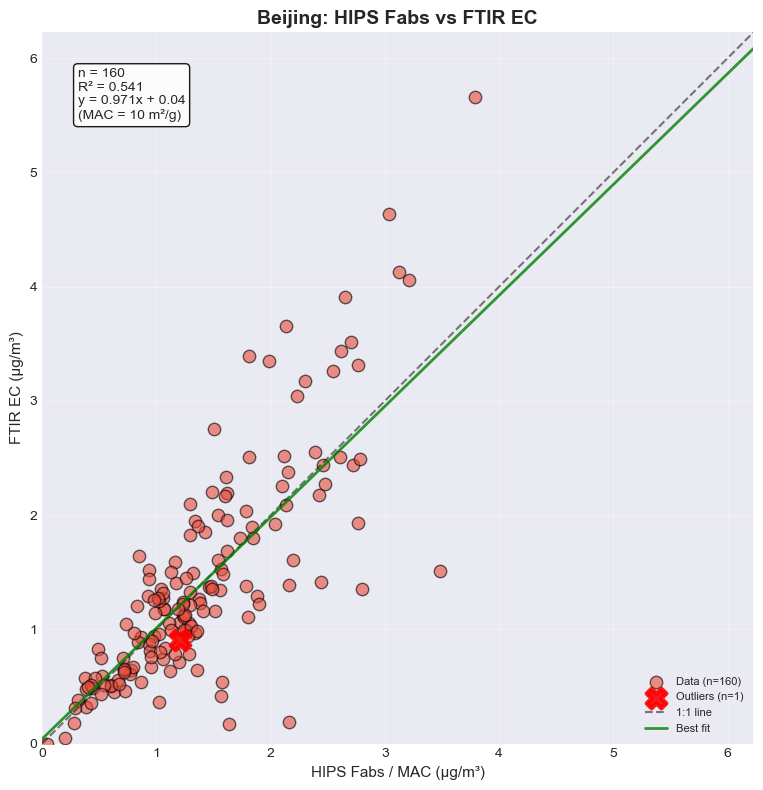


  HIPS Fabs vs FTIR EC:
    n = 160, R² = 0.541, Slope = 0.971, Outliers removed = 1


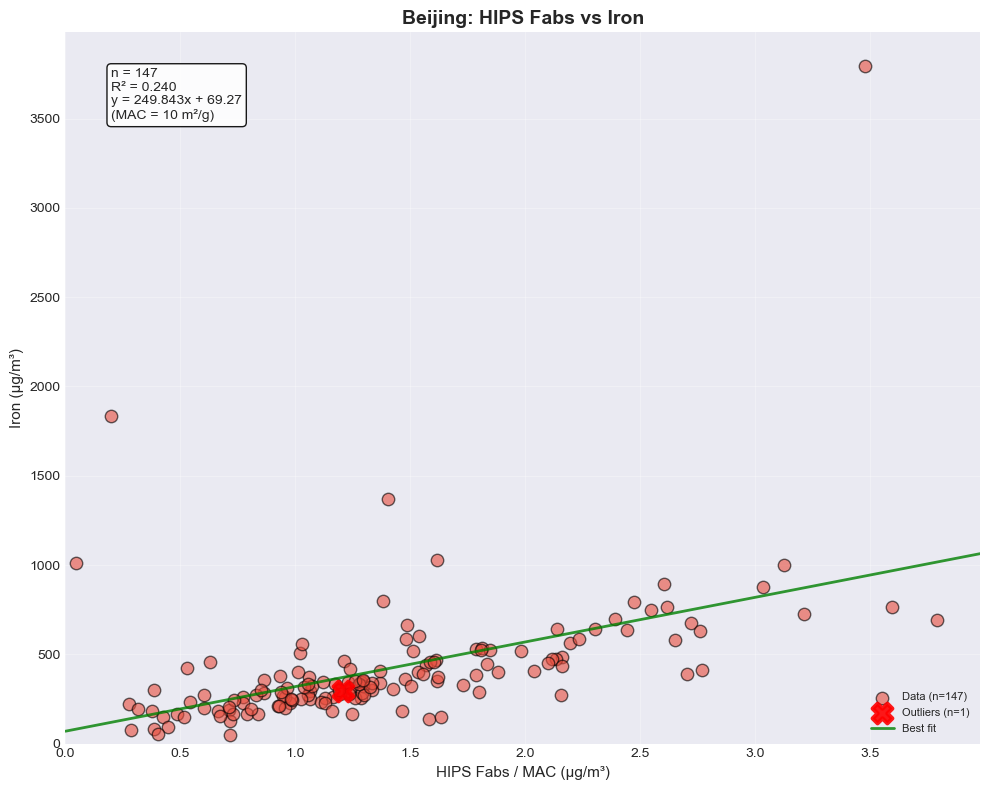


  HIPS Fabs vs Iron:
    n = 147, R² = 0.240, Slope = 249.843, Outliers removed = 1


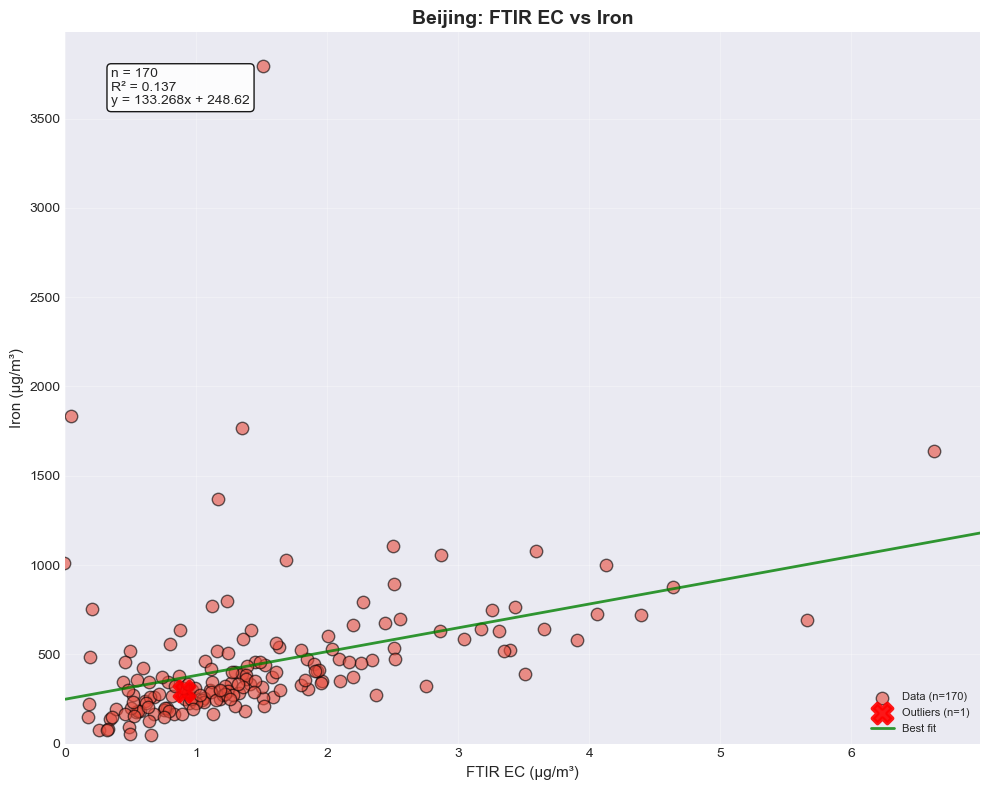


  FTIR EC vs Iron:
    n = 170, R² = 0.137, Slope = 133.268, Outliers removed = 1


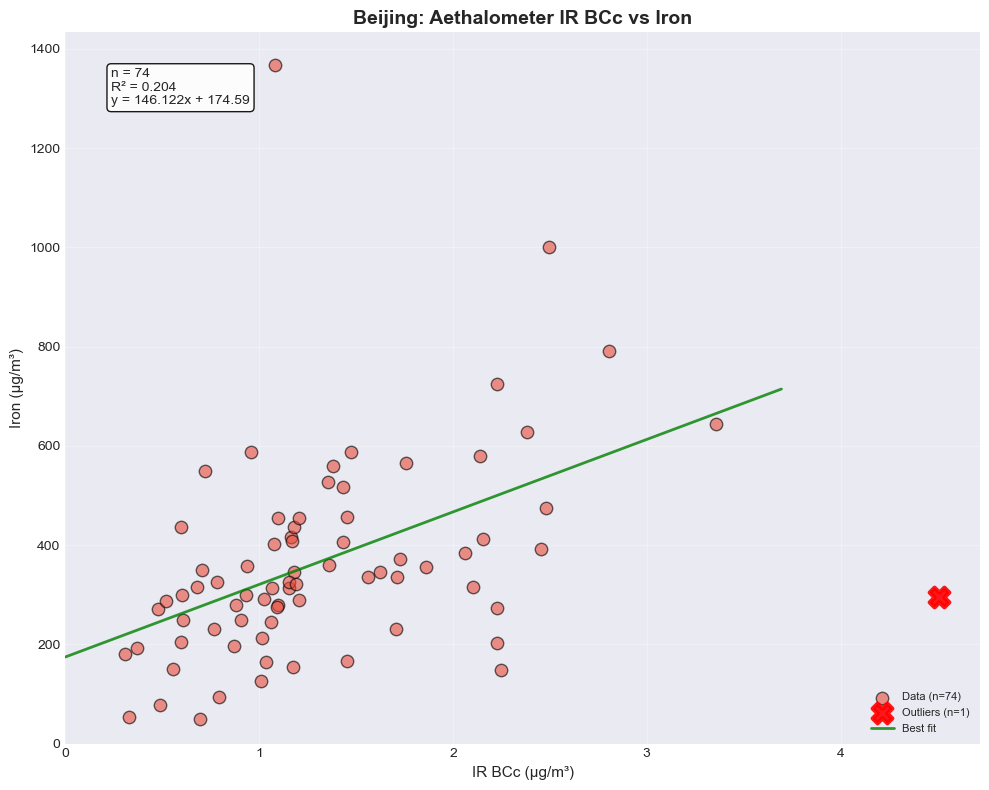


  Aethalometer IR BCc vs Iron:
    n = 74, R² = 0.204, Slope = 146.122, Outliers removed = 1


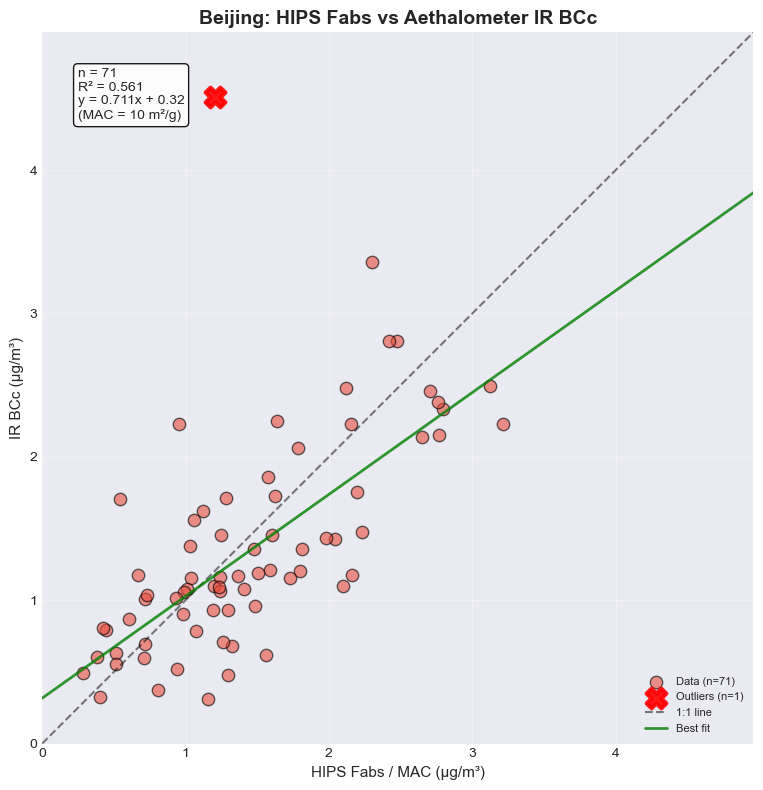


  HIPS Fabs vs Aethalometer IR BCc:
    n = 71, R² = 0.561, Slope = 0.711, Outliers removed = 1

CROSS-COMPARISON ANALYSIS: Delhi
  Total matched days: 63
  Outliers flagged: 2
  Available parameters: hips_fabs, ftir_ec, iron, ir_bcc


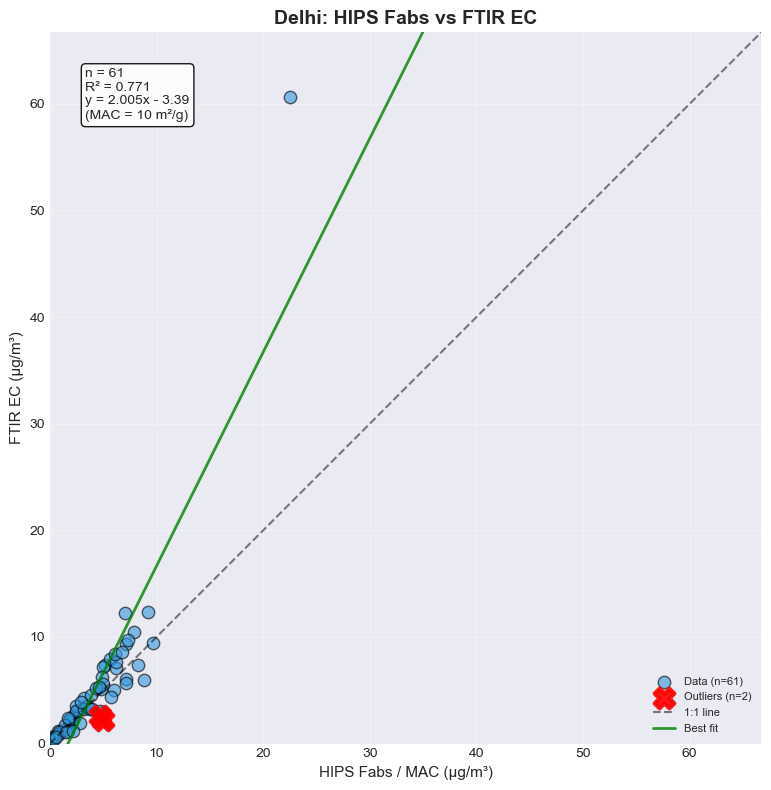


  HIPS Fabs vs FTIR EC:
    n = 61, R² = 0.771, Slope = 2.005, Outliers removed = 2


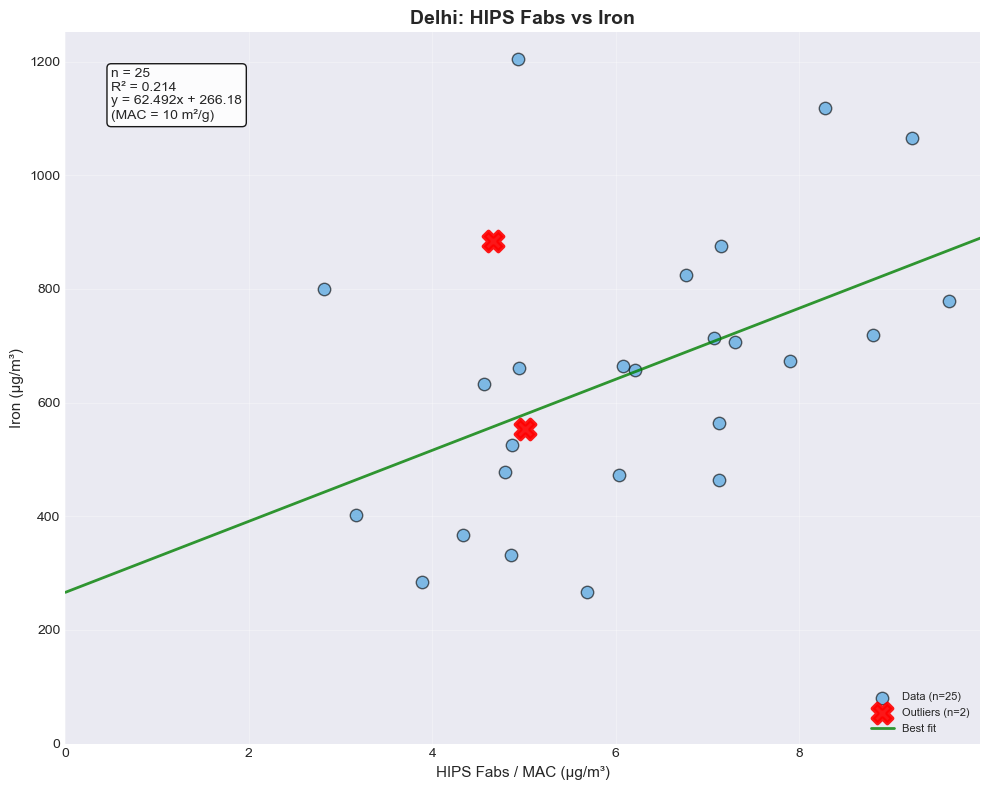


  HIPS Fabs vs Iron:
    n = 25, R² = 0.214, Slope = 62.492, Outliers removed = 2


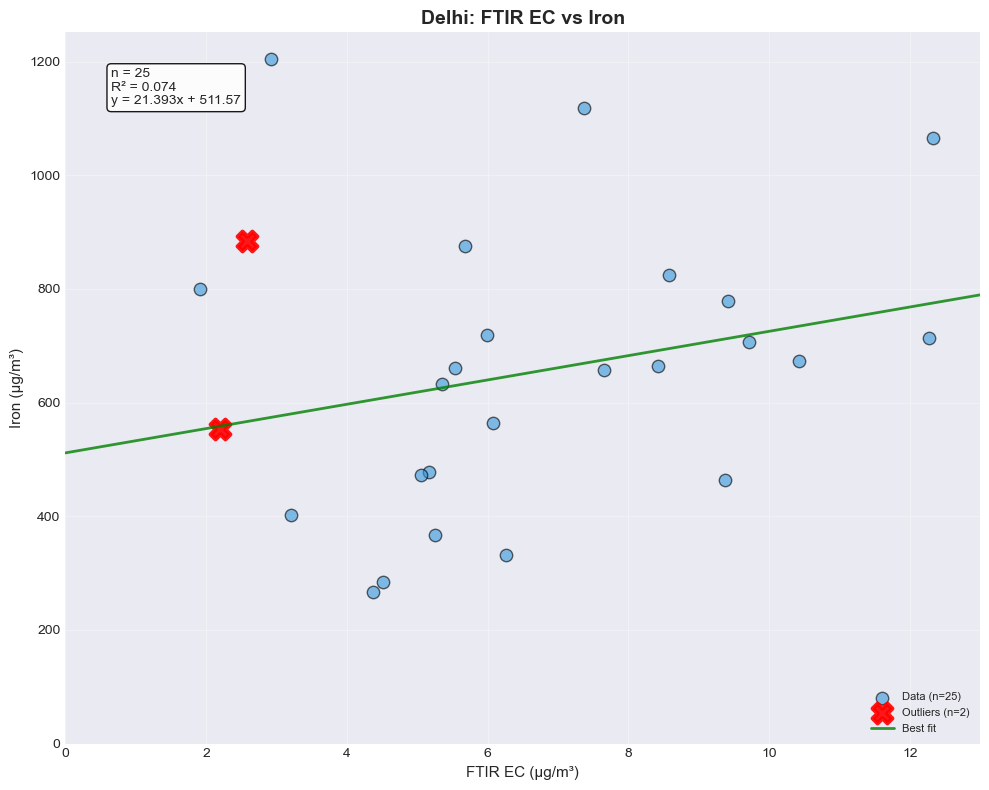


  FTIR EC vs Iron:
    n = 25, R² = 0.074, Slope = 21.393, Outliers removed = 2


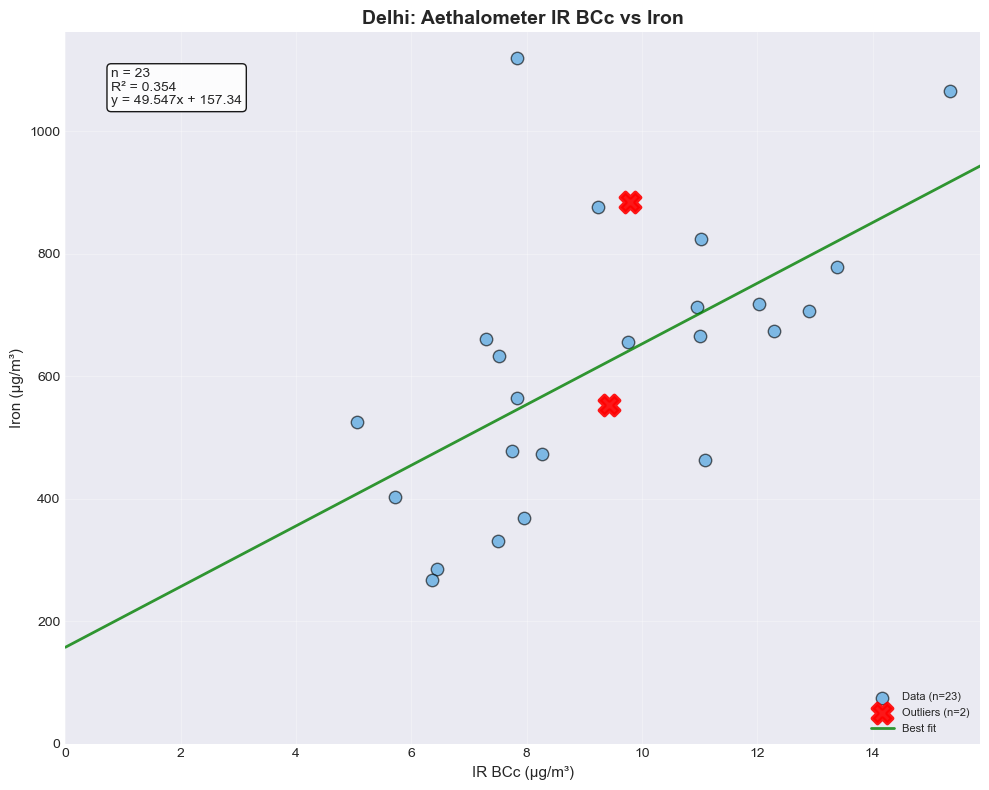


  Aethalometer IR BCc vs Iron:
    n = 23, R² = 0.354, Slope = 49.547, Outliers removed = 2


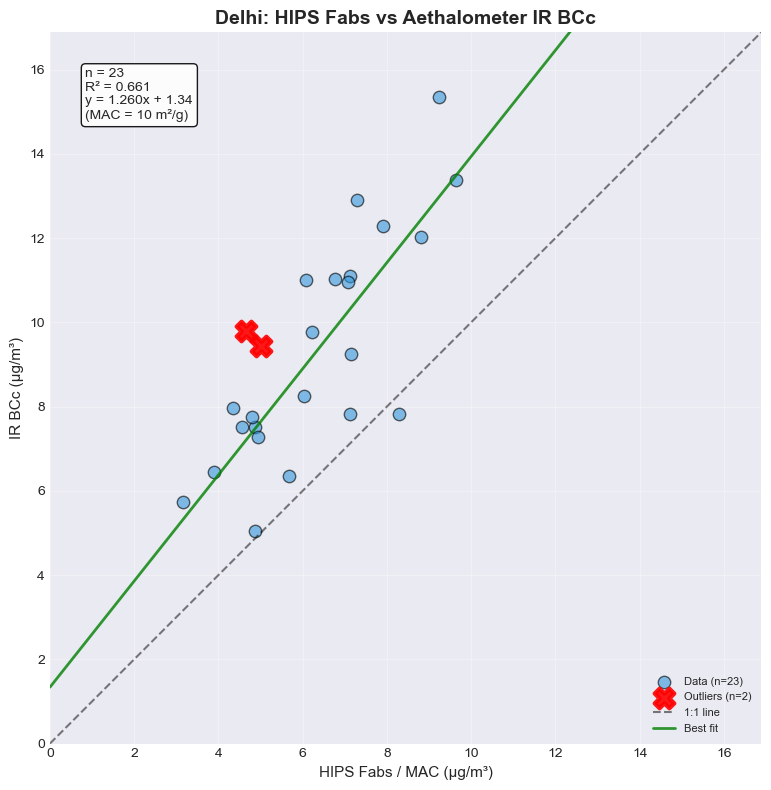


  HIPS Fabs vs Aethalometer IR BCc:
    n = 23, R² = 0.661, Slope = 1.260, Outliers removed = 2

CROSS-COMPARISON ANALYSIS: JPL
  Total matched days: 253
  Outliers flagged: 5
  Available parameters: hips_fabs, ftir_ec, iron, ir_bcc


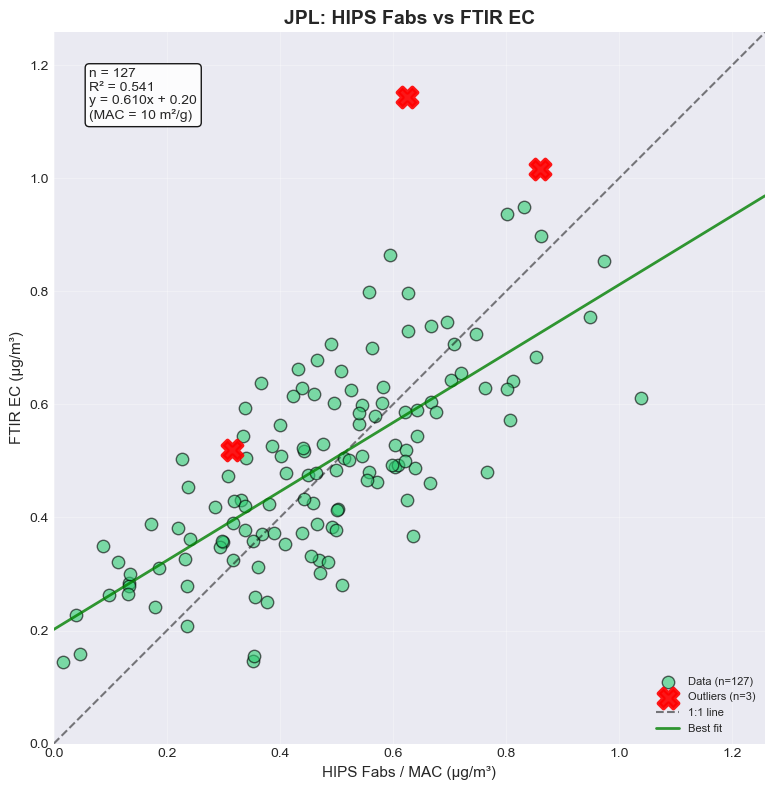


  HIPS Fabs vs FTIR EC:
    n = 127, R² = 0.541, Slope = 0.610, Outliers removed = 3


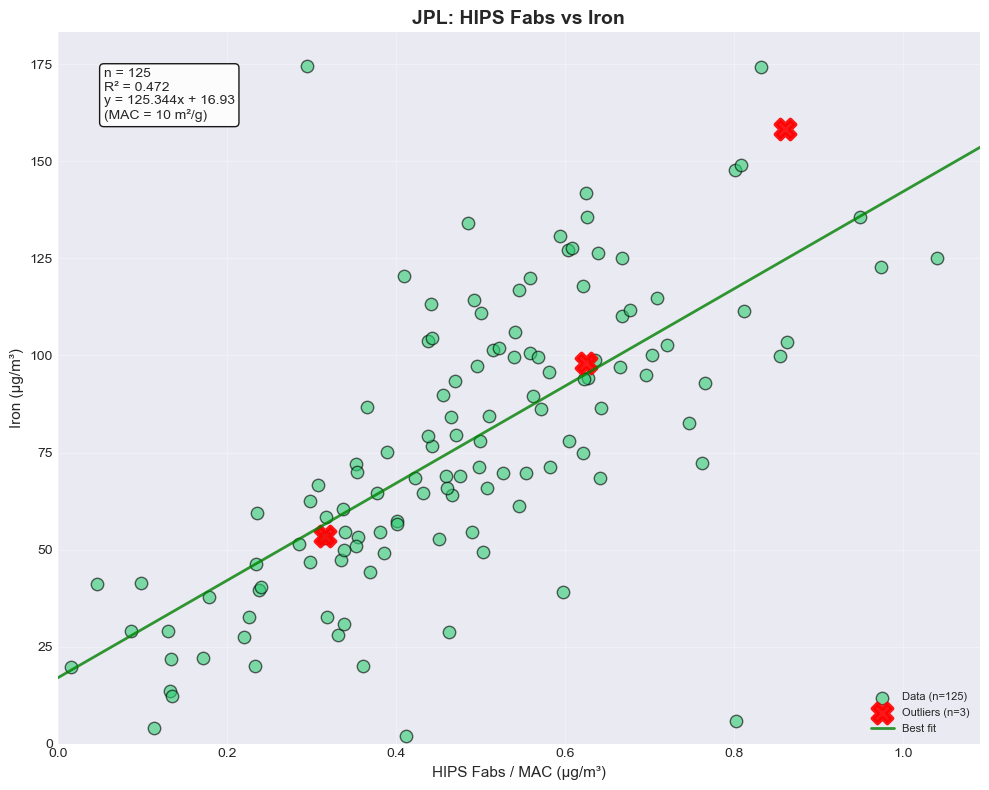


  HIPS Fabs vs Iron:
    n = 125, R² = 0.472, Slope = 125.344, Outliers removed = 3


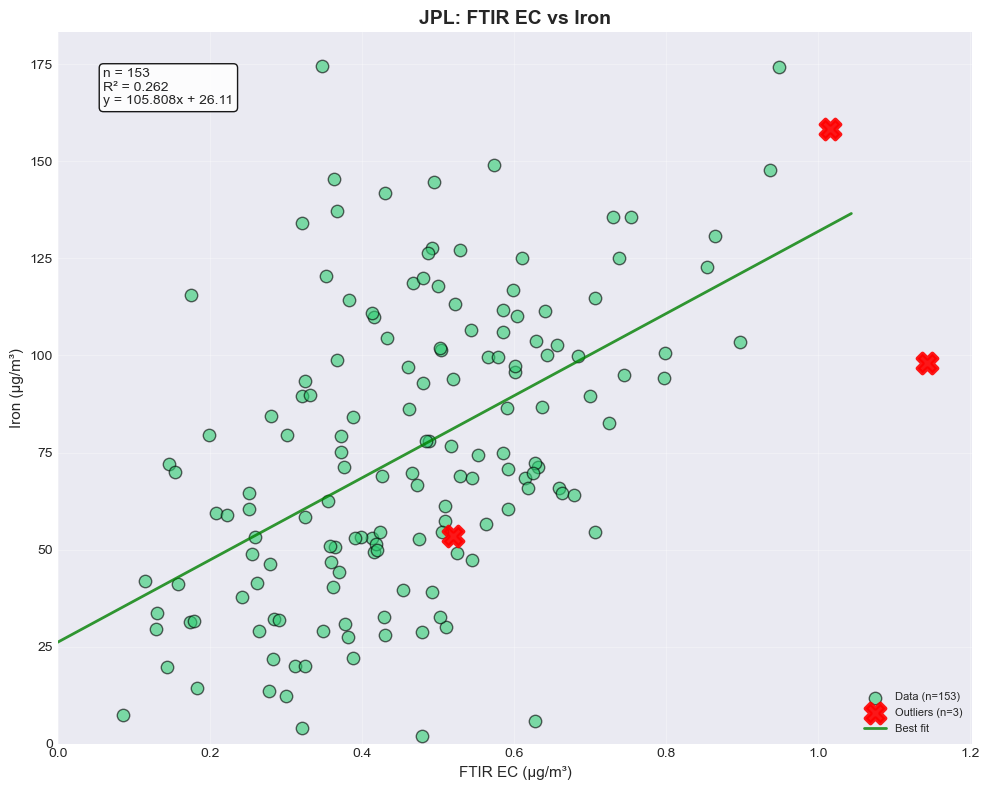


  FTIR EC vs Iron:
    n = 153, R² = 0.262, Slope = 105.808, Outliers removed = 3


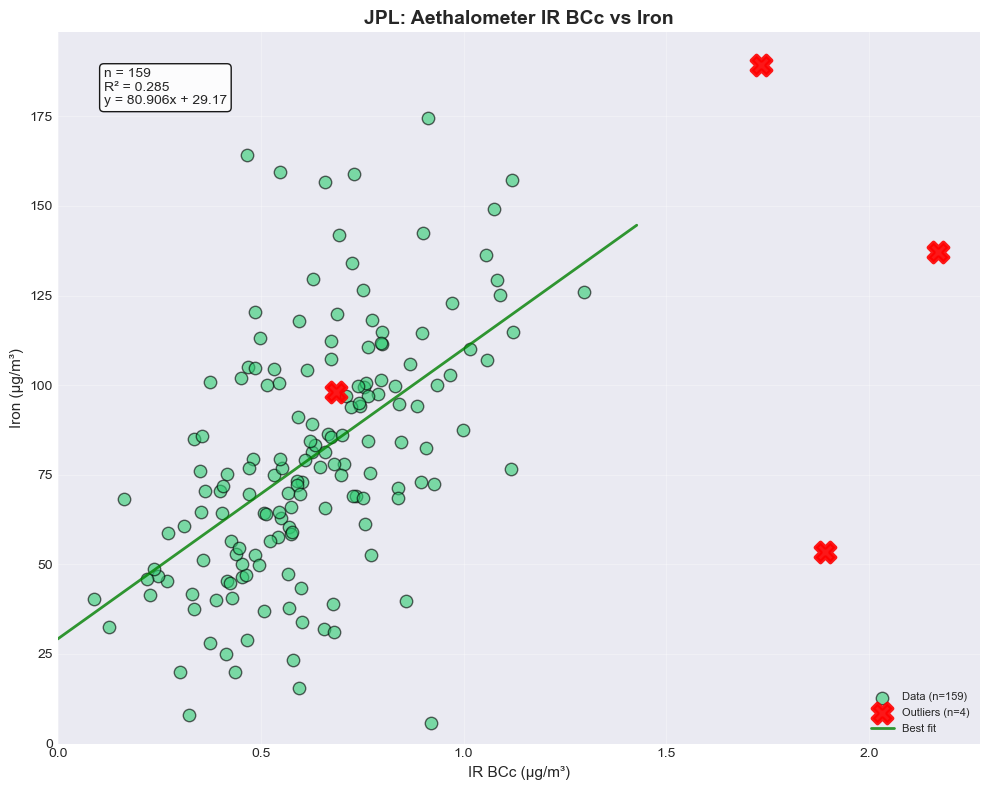


  Aethalometer IR BCc vs Iron:
    n = 159, R² = 0.285, Slope = 80.906, Outliers removed = 4


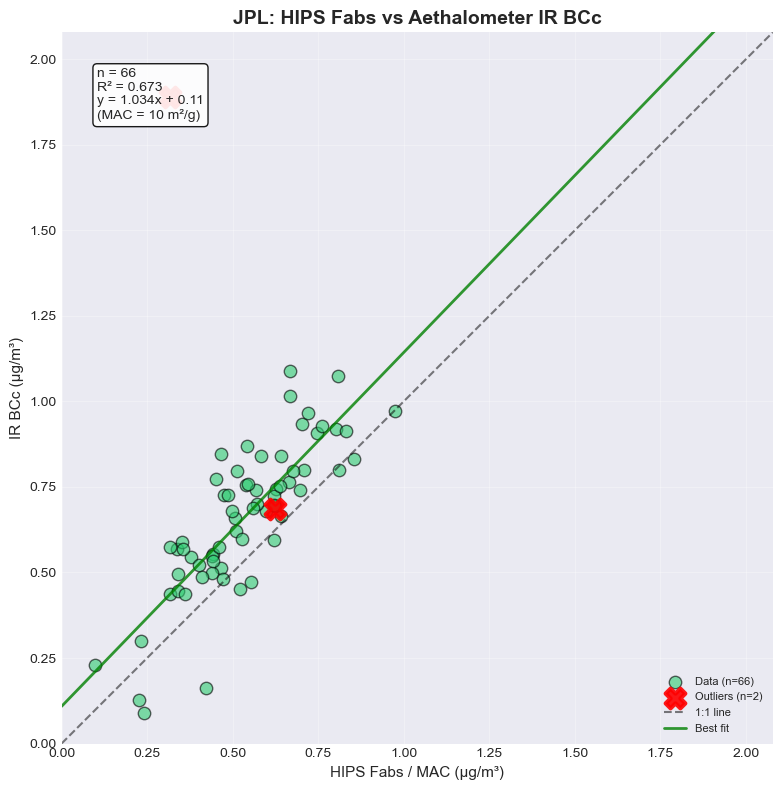


  HIPS Fabs vs Aethalometer IR BCc:
    n = 66, R² = 0.673, Slope = 1.034, Outliers removed = 2

CROSS-COMPARISON ANALYSIS: Addis_Ababa
  Total matched days: 189
  Outliers flagged: 0
  Available parameters: hips_fabs, ftir_ec, iron, ir_bcc


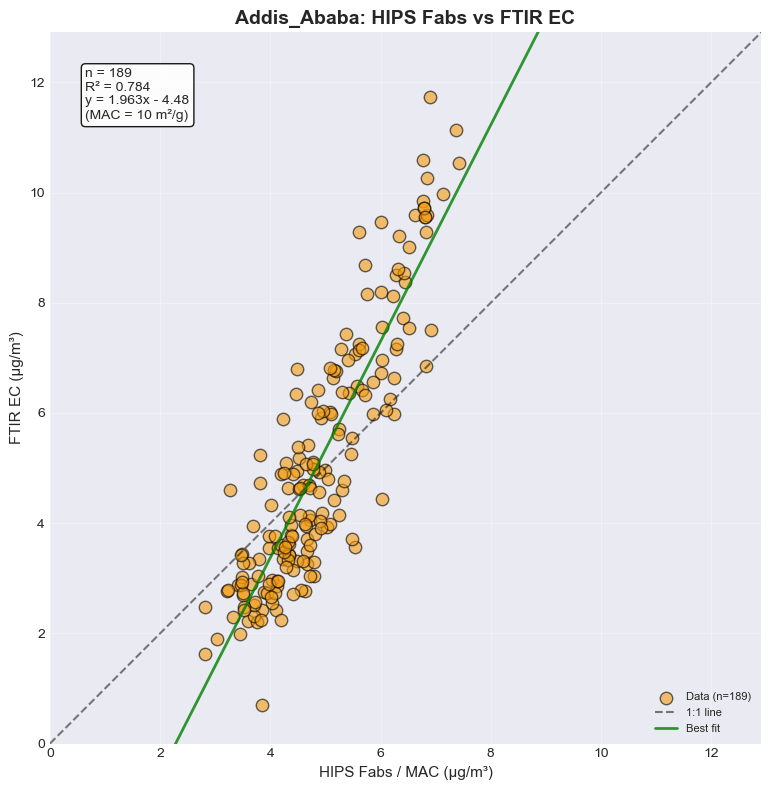


  HIPS Fabs vs FTIR EC:
    n = 189, R² = 0.784, Slope = 1.963, Outliers removed = 0


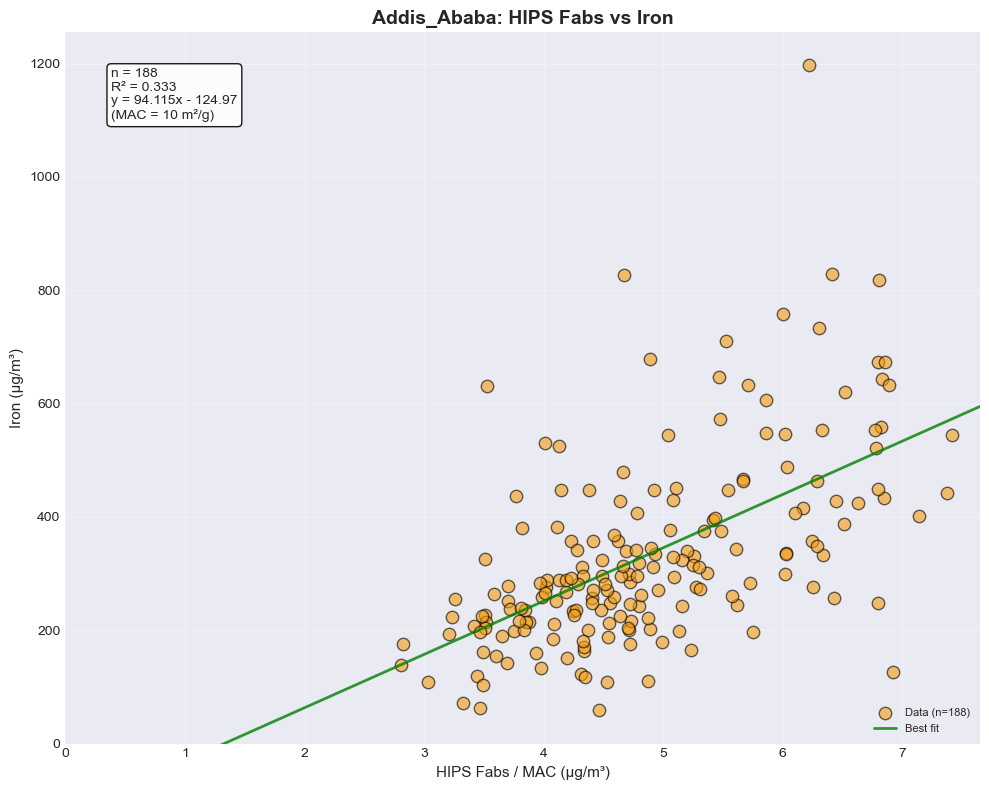


  HIPS Fabs vs Iron:
    n = 188, R² = 0.333, Slope = 94.115, Outliers removed = 0


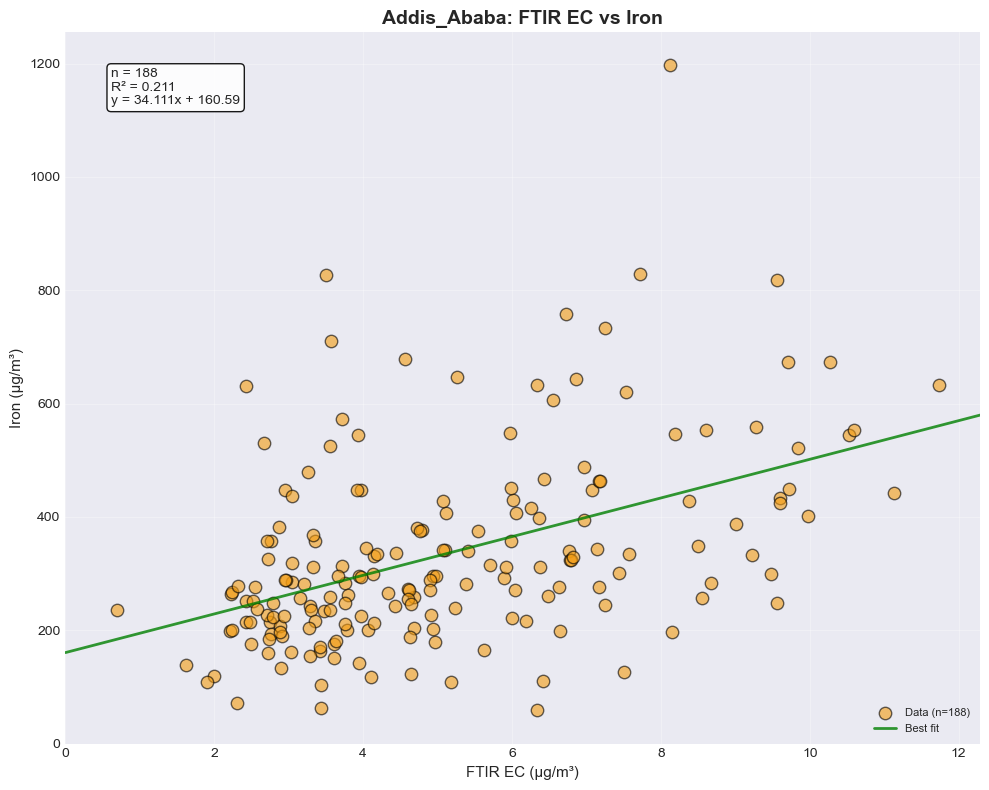


  FTIR EC vs Iron:
    n = 188, R² = 0.211, Slope = 34.111, Outliers removed = 0


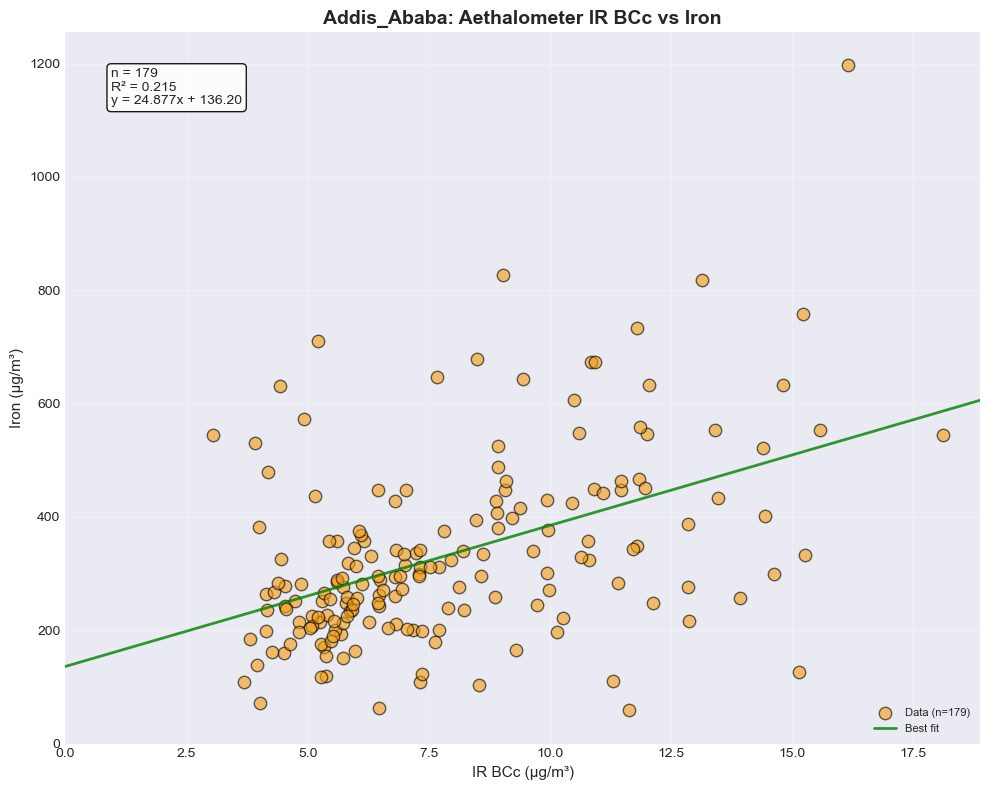


  Aethalometer IR BCc vs Iron:
    n = 179, R² = 0.215, Slope = 24.877, Outliers removed = 0


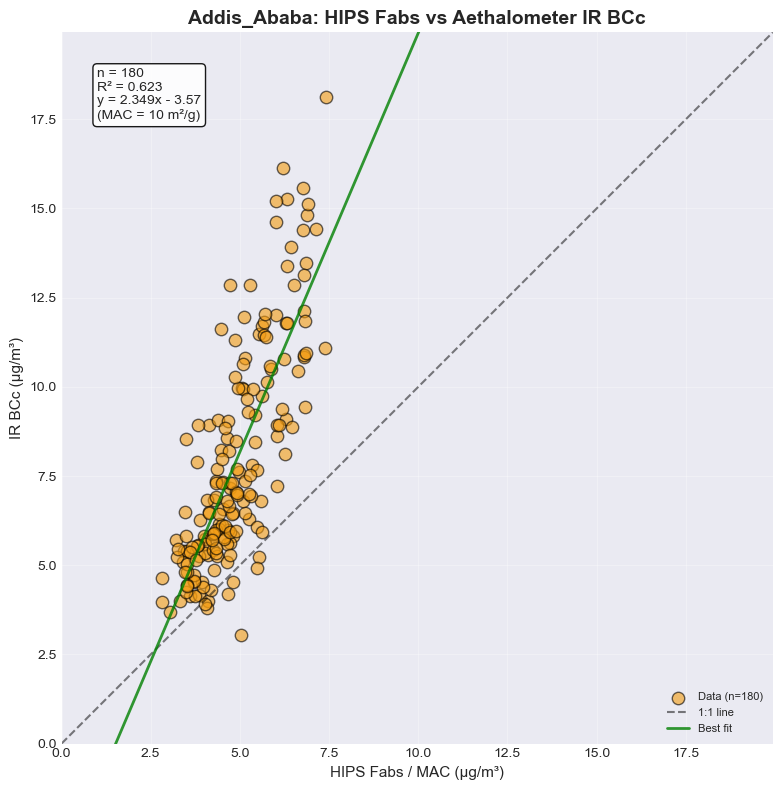


  HIPS Fabs vs Aethalometer IR BCc:
    n = 180, R² = 0.623, Slope = 2.349, Outliers removed = 0

SUMMARY: CROSS-COMPARISON RESULTS (Outliers Removed)

Note: HIPS Fabs divided by MAC = 10 m²/g to convert to μg/m³ equivalent
----------------------------------------------------------------------------------------------------

HIPS Fabs vs FTIR EC:
Site                   n         R²      Slope    Intercept   Outliers
-----------------------------------------------------------------
Beijing              160      0.541      0.971         0.04          1
Delhi                 61      0.771      2.005        -3.39          2
JPL                  127      0.541      0.610         0.20          3
Addis_Ababa          189      0.784      1.963        -4.48          0

HIPS Fabs vs Iron:
Site                   n         R²      Slope    Intercept   Outliers
-----------------------------------------------------------------
Beijing              147      0.240    249.843        69.27          1
De

In [ ]:
# =============================================================================
# CONFIGURATION
# =============================================================================

# MAC value for HIPS conversion (Fabs / MAC = BC equivalent in μg/m³)
MAC_VALUE = 10

print(f"MAC value for HIPS conversion: {MAC_VALUE} m²/g")
print("\nUsing EXCLUDED_SAMPLES registry for outlier detection")
print("(Threshold criteria defined in Cell 31)")
print("\nCurrent exclusion criteria:")
for site, config in EXCLUDED_SAMPLES.items():
    n_thresh = len(config.get('threshold_criteria', []))
    n_dates = len(config.get('date_exclusions', []))
    if n_thresh > 0 or n_dates > 0:
        print(f"  {site}: {n_thresh} threshold rule(s), {n_dates} date exclusion(s)")
    else:
        print(f"  {site}: No outliers defined")


Smooth vs. Raw Threshold Analysis Configuration:
  Thresholds to test: [1, 2.5, 4, 5]%
  BC wavelength: IR
Helper functions defined!
Tiled cross-plot function defined!
Distribution analysis function defined!
Outlier correspondence analysis function defined!
SMOOTH VS. RAW THRESHOLD ANALYSIS

PROCESSING BEIJING
  Matched 65 data points
  Points with smooth data: 65/65

--- Distribution Analysis ---


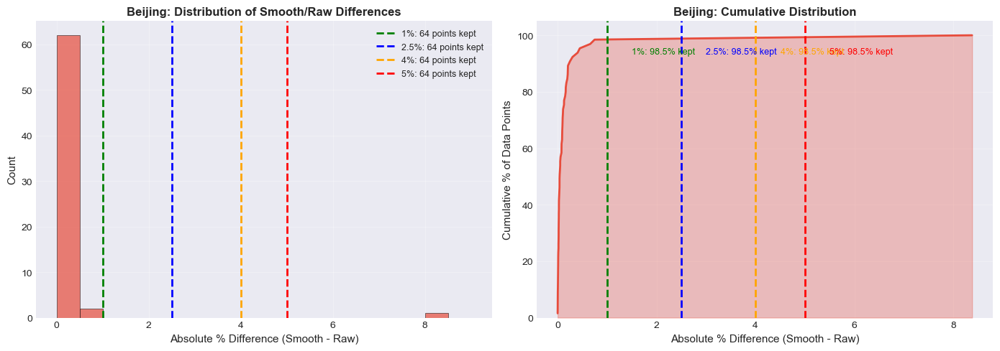


Beijing - Smooth/Raw Difference Statistics:
  Total matched points with smooth data: 65
  Mean absolute % difference: 0.23%
  Median absolute % difference: 0.04%
  Std deviation: 1.04%
  Min: 0.00%, Max: 8.38%

  Points kept at each threshold:
    ≤1%: 64/65 (98.5%)
    ≤2.5%: 64/65 (98.5%)
    ≤4%: 64/65 (98.5%)
    ≤5%: 64/65 (98.5%)

--- Tiled Cross-Plots ---


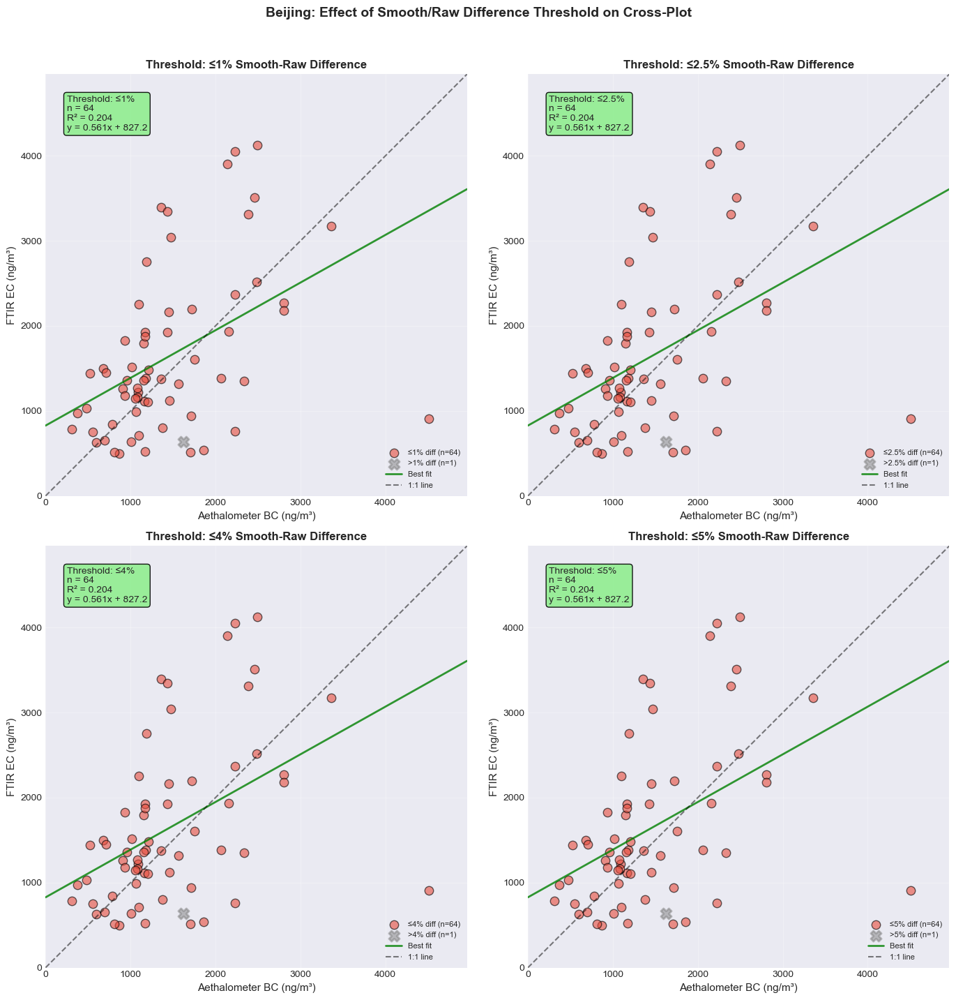


--- Outlier Correspondence Analysis ---


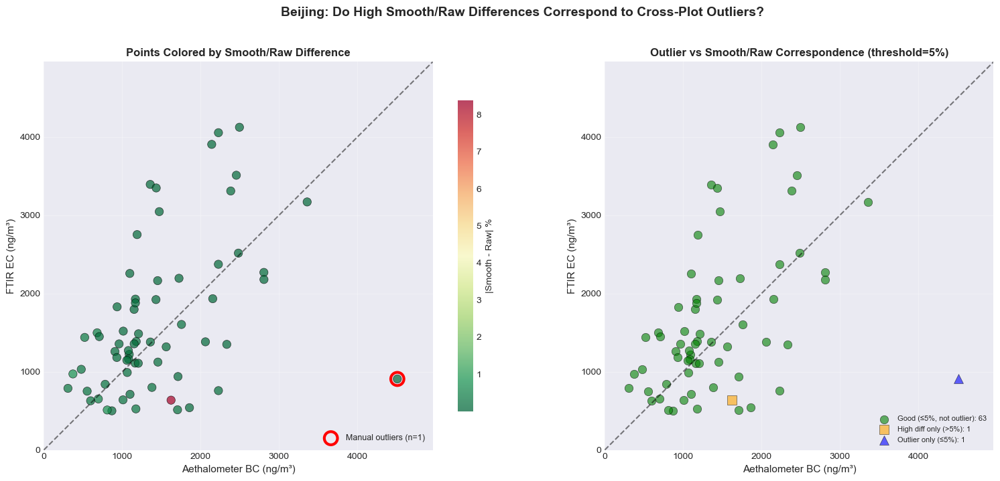


Beijing - Outlier Correspondence Analysis:
  Total matched points: 65
  Points with smooth data: 65
  Manual outliers identified: 1

  Outlier smooth/raw differences:
    2023-10-21: 0.0% (Aeth=4510, EC=908)

  Average smooth/raw difference:
    Outliers: 0.0%
    Non-outliers: 0.2%

  ✗ No strong correspondence between outliers and smooth/raw differences

PROCESSING DELHI
  Matched 24 data points
  Points with smooth data: 24/24

--- Distribution Analysis ---


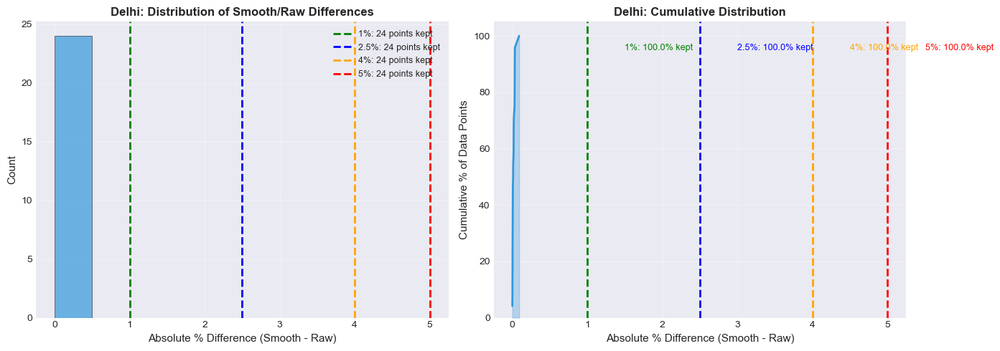


Delhi - Smooth/Raw Difference Statistics:
  Total matched points with smooth data: 24
  Mean absolute % difference: 0.02%
  Median absolute % difference: 0.01%
  Std deviation: 0.02%
  Min: 0.00%, Max: 0.09%

  Points kept at each threshold:
    ≤1%: 24/24 (100.0%)
    ≤2.5%: 24/24 (100.0%)
    ≤4%: 24/24 (100.0%)
    ≤5%: 24/24 (100.0%)

--- Tiled Cross-Plots ---


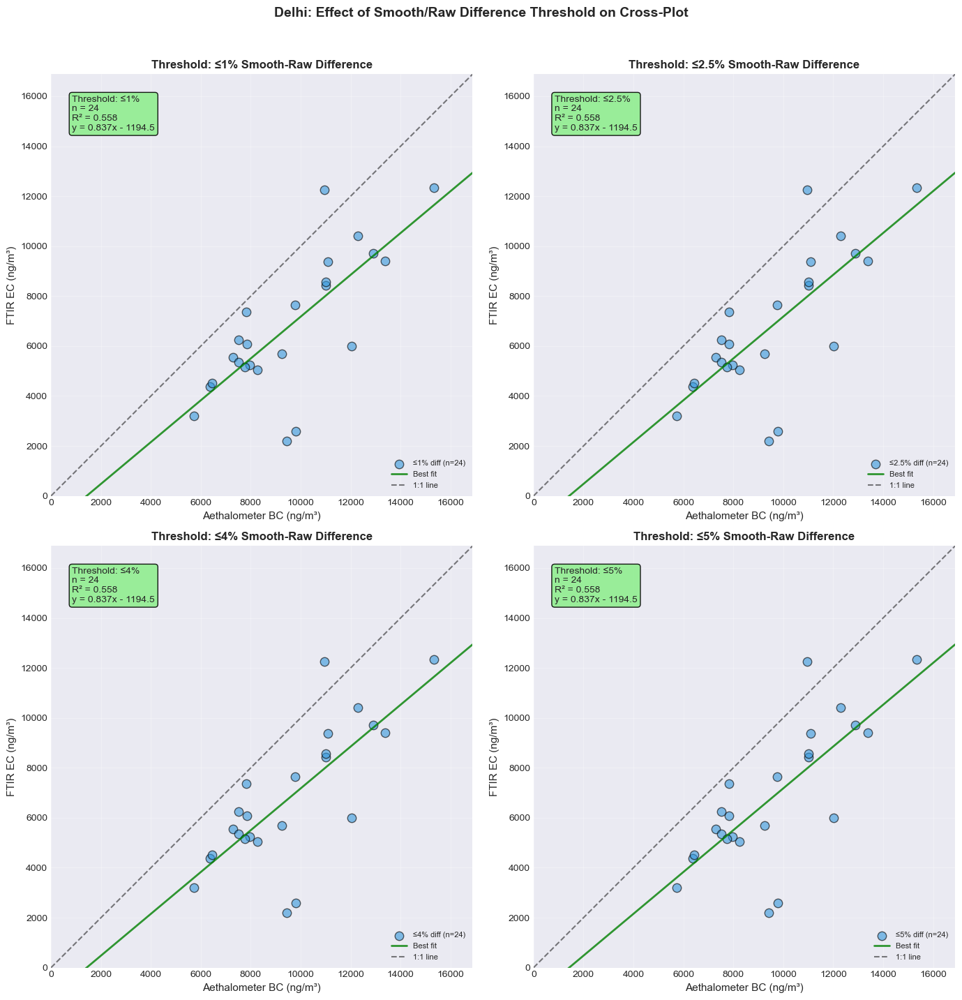


--- Outlier Correspondence Analysis ---


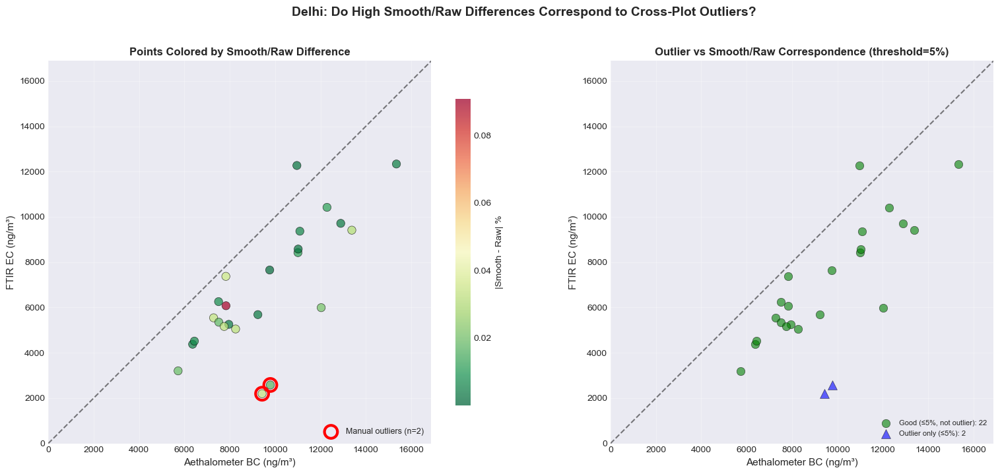


Delhi - Outlier Correspondence Analysis:
  Total matched points: 24
  Points with smooth data: 24
  Manual outliers identified: 2

  Outlier smooth/raw differences:
    2024-05-01: 0.0% (Aeth=9426, EC=2194)
    2024-05-29: 0.0% (Aeth=9789, EC=2580)

  Average smooth/raw difference:
    Outliers: 0.0%
    Non-outliers: 0.0%

  ✗ No strong correspondence between outliers and smooth/raw differences

PROCESSING JPL
  Matched 42 data points
  Points with smooth data: 42/42

--- Distribution Analysis ---


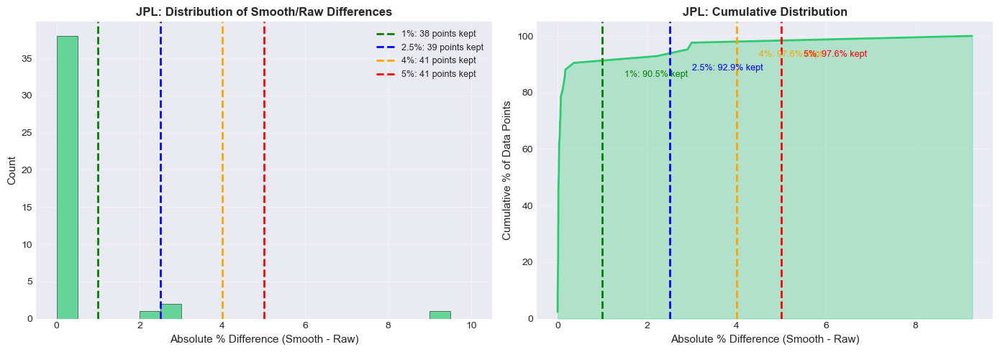


JPL - Smooth/Raw Difference Statistics:
  Total matched points with smooth data: 42
  Mean absolute % difference: 0.46%
  Median absolute % difference: 0.03%
  Std deviation: 1.56%
  Min: 0.00%, Max: 9.26%

  Points kept at each threshold:
    ≤1%: 38/42 (90.5%)
    ≤2.5%: 39/42 (92.9%)
    ≤4%: 41/42 (97.6%)
    ≤5%: 41/42 (97.6%)

--- Tiled Cross-Plots ---


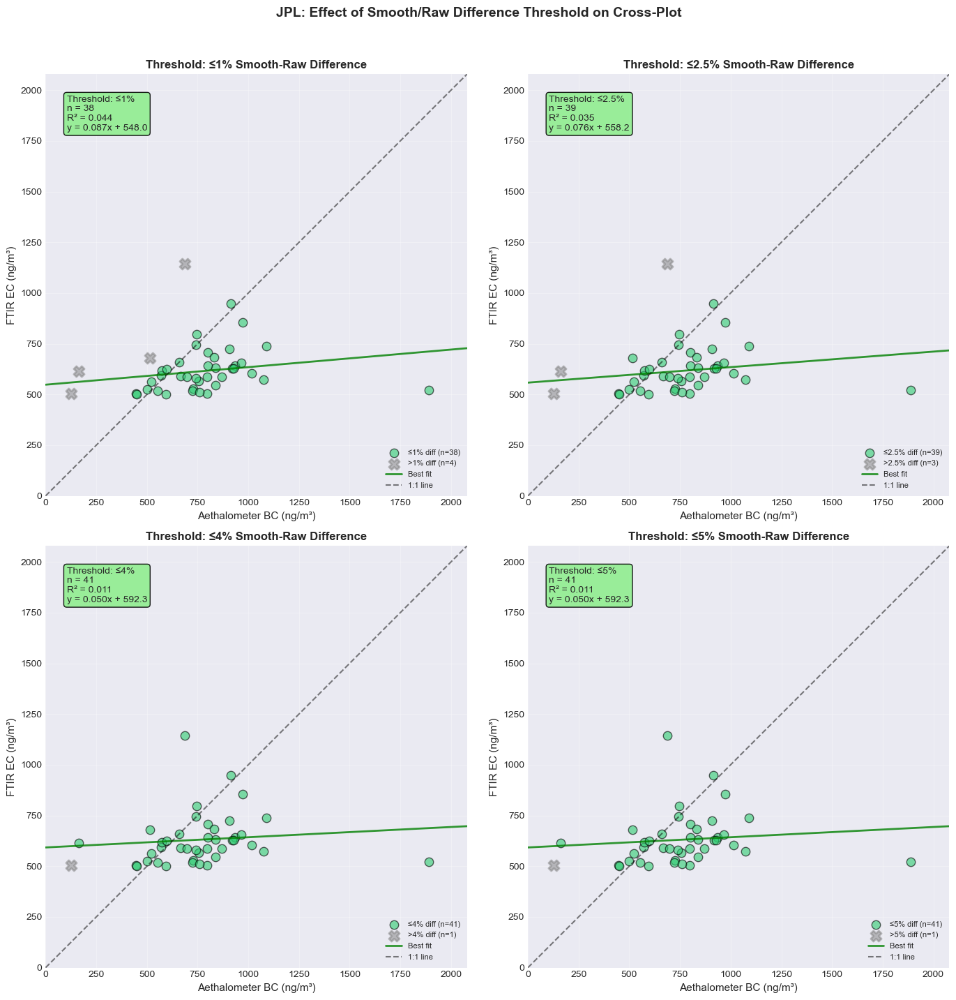


--- Outlier Correspondence Analysis ---


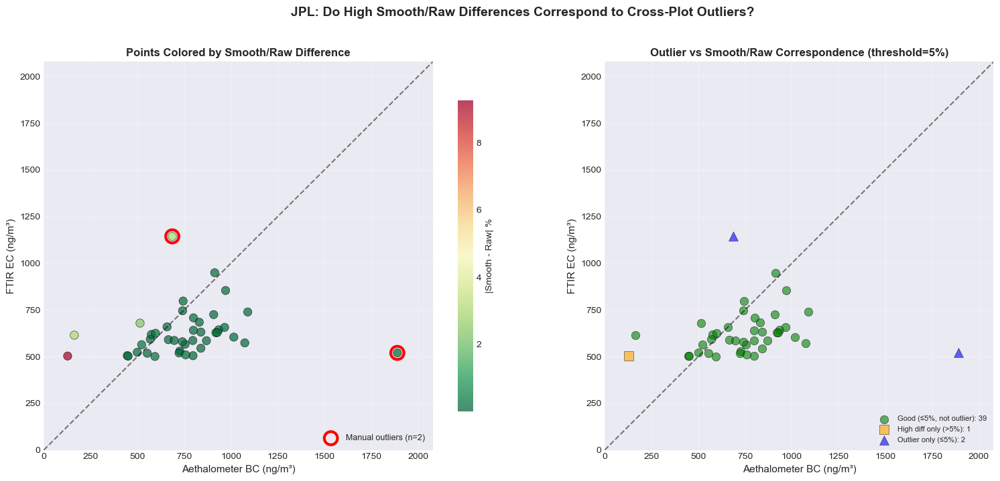


JPL - Outlier Correspondence Analysis:
  Total matched points: 42
  Points with smooth data: 42
  Manual outliers identified: 2

  Outlier smooth/raw differences:
    2023-06-13: 0.1% (Aeth=1890, EC=520)
    2023-07-05: 3.0% (Aeth=687, EC=1144)

  Average smooth/raw difference:
    Outliers: 1.5%
    Non-outliers: 0.4%

  ✓ CORRESPONDENCE FOUND: Outliers have 3.8x higher smooth/raw differences on average

PROCESSING ADDIS_ABABA
  Matched 181 data points
  Points with smooth data: 181/181

--- Distribution Analysis ---


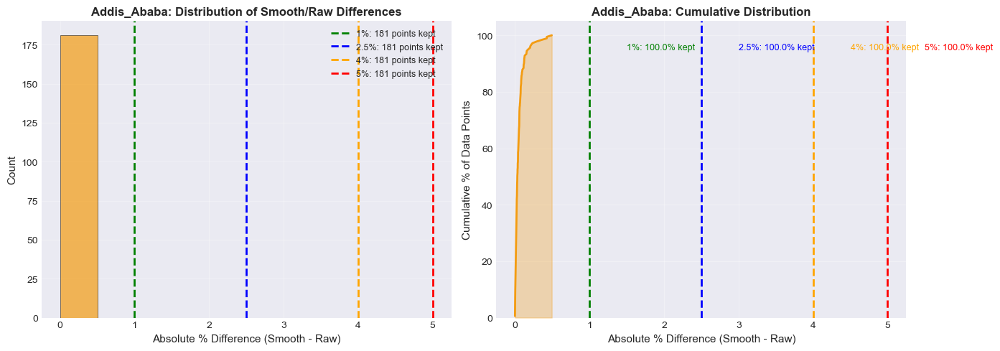


Addis_Ababa - Smooth/Raw Difference Statistics:
  Total matched points with smooth data: 181
  Mean absolute % difference: 0.06%
  Median absolute % difference: 0.03%
  Std deviation: 0.07%
  Min: 0.00%, Max: 0.49%

  Points kept at each threshold:
    ≤1%: 181/181 (100.0%)
    ≤2.5%: 181/181 (100.0%)
    ≤4%: 181/181 (100.0%)
    ≤5%: 181/181 (100.0%)

--- Tiled Cross-Plots ---


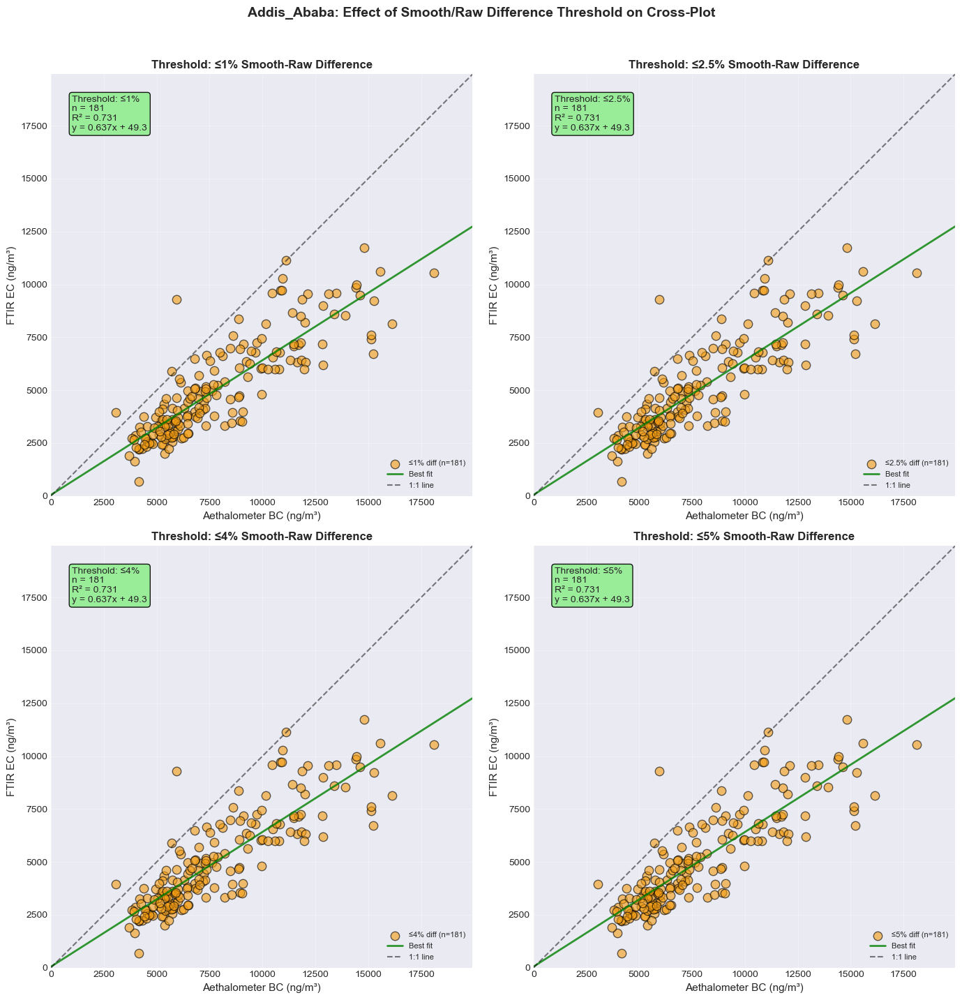


--- Outlier Correspondence Analysis ---


/var/folders/7q/3m0wqxpd2719blfvfs1_4vpr0000gn/T/ipykernel_61189/1636305490.py:517: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax1.legend(loc='lower right', fontsize=9)


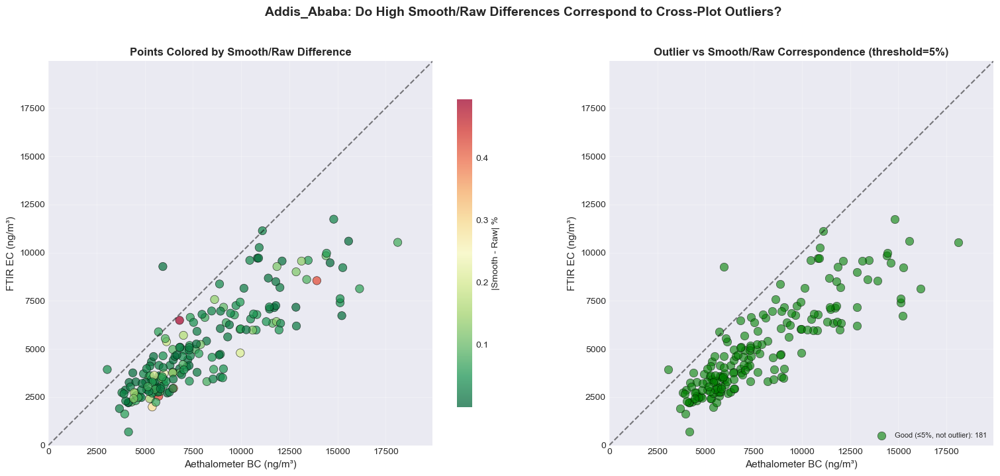


Addis_Ababa - Outlier Correspondence Analysis:
  Total matched points: 181
  Points with smooth data: 181
  Manual outliers identified: 0

SUMMARY: IMPACT OF SMOOTH/RAW THRESHOLD ON CROSS-PLOT STATISTICS

--- Threshold: ≤1% ---
Site               n_total     n_kept    % removed         R²      Slope
----------------------------------------------------------------------
Beijing                 65         64         1.5%      0.204      0.561
Delhi                   24         24         0.0%      0.558      0.837
JPL                     42         38         9.5%      0.044      0.087
Addis_Ababa            181        181         0.0%      0.731      0.637

--- Threshold: ≤2.5% ---
Site               n_total     n_kept    % removed         R²      Slope
----------------------------------------------------------------------
Beijing                 65         64         1.5%      0.204      0.561
Delhi                   24         24         0.0%      0.558      0.837
JPL                

In [ ]:
# %% [markdown]
# # Smooth vs. Raw Data Threshold Analysis
# 
# This section analyzes the impact of smooth vs. raw BC differences on data quality
# and cross-plot results.
# 
# ## Objectives:
# 1. Calculate % difference between smoothed and raw BC for each day
# 2. Create **tiled cross-plots** at different threshold levels (1%, 2.5%, 4%, 5%)
# 3. Identify if days with high smooth/raw differences are also cross-plot outliers
# 4. Determine optimal threshold for data filtering
# 
# ## Key Questions:
# - Do problematic aethalometer days (high smooth/raw %) correspond to cross-plot outliers?
# - What threshold removes the most problematic points while preserving data?
# - How does filtering affect R² and slope?
# 
# ---

# %%
# =============================================================================
# CONFIGURATION
# =============================================================================

# Thresholds to test (% difference between smooth and raw)
THRESHOLDS = [1, 2.5, 4, 5]

# Which BC wavelength to use
BC_WAVELENGTH = 'IR'  # Options: 'IR', 'Red', 'Blue', 'UV'

print("Smooth vs. Raw Threshold Analysis Configuration:")
print(f"  Thresholds to test: {THRESHOLDS}%")
print(f"  BC wavelength: {BC_WAVELENGTH}")

# %%
# =============================================================================
# HELPER FUNCTIONS
# =============================================================================

def calculate_smooth_raw_difference(df, wavelength='IR'):
    """
    Calculate the % difference between smoothed and raw BC values.
    
    % Difference = ((Smooth - Raw) / Raw) * 100
    
    Parameters:
    -----------
    df : DataFrame with aethalometer data
    wavelength : str - 'IR', 'Red', 'Blue', 'UV'
    
    Returns:
    --------
    DataFrame with added columns:
    - bc_raw: Raw BC value
    - bc_smooth: Smoothed BC value
    - smooth_raw_diff: Absolute difference (ng/m³)
    - smooth_raw_pct: % difference
    - smooth_raw_abs_pct: Absolute % difference
    """
    df = df.copy()
    
    raw_col = f'{wavelength} BCc'
    smooth_col = f'{wavelength} BCc smoothed'
    
    # Check if columns exist
    if raw_col not in df.columns:
        print(f"  Warning: {raw_col} not found")
        return None
    if smooth_col not in df.columns:
        print(f"  Warning: {smooth_col} not found")
        return None
    
    # Calculate differences
    df['bc_raw'] = df[raw_col]
    df['bc_smooth'] = df[smooth_col]
    df['smooth_raw_diff'] = df['bc_smooth'] - df['bc_raw']
    
    # % difference (relative to raw)
    # Avoid division by zero
    df['smooth_raw_pct'] = np.where(
        df['bc_raw'] != 0,
        (df['smooth_raw_diff'] / df['bc_raw']) * 100,
        np.nan
    )
    
    # Absolute % difference (for thresholding)
    df['smooth_raw_abs_pct'] = np.abs(df['smooth_raw_pct'])
    
    return df


def match_with_smooth_raw_info(site_name, df_aeth, filter_data, site_code, 
                                wavelength='IR', min_ec=0.5):
    """
    Match aethalometer and filter data, including smooth/raw difference info.
    
    Returns DataFrame with:
    - date
    - aeth_bc (using raw BC)
    - filter_ec
    - smooth_raw_pct
    - smooth_raw_abs_pct
    """
    # First calculate smooth/raw differences
    df_with_diff = calculate_smooth_raw_difference(df_aeth, wavelength)
    
    if df_with_diff is None:
        return None
    
    # Get FTIR EC data for this site
    site_filters = filter_data[
        (filter_data['Site'] == site_code) & 
        (filter_data['Parameter'] == 'EC_ftir')
    ].copy()
    
    # Filter out values below MDL
    site_filters = site_filters[site_filters['Concentration'] >= min_ec].copy()
    
    if len(site_filters) == 0:
        print(f"  {site_name}: No FTIR EC data available")
        return None
    
    # Match by date
    matched_records = []
    
    for _, filter_row in site_filters.iterrows():
        filter_date = filter_row['SampleDate']
        
        date_match = df_with_diff[
            (df_with_diff['day_9am'] >= filter_date - pd.Timedelta(days=1)) &
            (df_with_diff['day_9am'] <= filter_date + pd.Timedelta(days=1))
        ]
        
        if len(date_match) > 0:
            # Use raw BC for the cross-plot
            bc_raw = date_match['bc_raw'].mean()
            bc_smooth = date_match['bc_smooth'].mean()
            
            if pd.notna(bc_raw):
                filter_ec = filter_row['Concentration'] * 1000  # μg/m³ to ng/m³
                
                # Calculate % difference for this matched day
                if bc_raw != 0:
                    pct_diff = ((bc_smooth - bc_raw) / bc_raw) * 100
                else:
                    pct_diff = np.nan
                
                matched_records.append({
                    'date': filter_date,
                    'aeth_bc': bc_raw,
                    'aeth_bc_smooth': bc_smooth,
                    'filter_ec': filter_ec,
                    'smooth_raw_pct': pct_diff,
                    'smooth_raw_abs_pct': abs(pct_diff) if pd.notna(pct_diff) else np.nan,
                    'filter_id': filter_row.get('FilterId', 'unknown')
                })
    
    if len(matched_records) == 0:
        return None
    
    return pd.DataFrame(matched_records)


def calculate_regression_stats(x, y):
    """Calculate regression statistics."""
    if len(x) < 3:
        return None
    
    # Remove any remaining NaN
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x = x[mask]
    y = y[mask]
    
    if len(x) < 3:
        return None
    
    coefficients = np.polyfit(x, y, 1)
    slope, intercept = coefficients
    correlation = np.corrcoef(x, y)[0, 1]
    r_squared = correlation ** 2
    
    return {
        'n': len(x),
        'slope': slope,
        'intercept': intercept,
        'r_squared': r_squared
    }


print("Helper functions defined!")

# %%
# =============================================================================
# TILED CROSS-PLOT FUNCTION
# =============================================================================

def create_tiled_threshold_plots(matched_df, site_name, site_color, 
                                  thresholds=[1, 2.5, 4, 5]):
    """
    Create a 2x2 tiled plot showing cross-plots at different smooth/raw thresholds.
    
    Each tile shows:
    - Points with smooth/raw % ≤ threshold (kept, colored)
    - Points with smooth/raw % > threshold (removed, gray X's)
    - Regression line and stats for kept points only
    
    Parameters:
    -----------
    matched_df : DataFrame with aeth_bc, filter_ec, smooth_raw_abs_pct
    site_name : str
    site_color : str
    thresholds : list of % thresholds to test
    
    Returns:
    --------
    dict with stats for each threshold
    """
    fig, axes = plt.subplots(2, 2, figsize=(14, 14))
    axes = axes.flatten()
    
    # Calculate axis limits (same for all plots)
    all_vals = np.concatenate([
        matched_df['aeth_bc'].dropna().values, 
        matched_df['filter_ec'].dropna().values
    ])
    max_val = all_vals.max() * 1.1 if len(all_vals) > 0 else 100
    
    results = {}
    
    for idx, threshold in enumerate(thresholds):
        ax = axes[idx]
        
        # Separate data by threshold
        below_threshold = matched_df[matched_df['smooth_raw_abs_pct'] <= threshold].copy()
        above_threshold = matched_df[matched_df['smooth_raw_abs_pct'] > threshold].copy()
        
        # Also include points with NaN smooth_raw_abs_pct (no smooth data available)
        nan_threshold = matched_df[matched_df['smooth_raw_abs_pct'].isna()].copy()
        
        n_kept = len(below_threshold)
        n_removed = len(above_threshold)
        n_nan = len(nan_threshold)
        
        # Plot kept points (below threshold)
        if len(below_threshold) > 0:
            ax.scatter(below_threshold['aeth_bc'], below_threshold['filter_ec'],
                      color=site_color, alpha=0.6, s=80,
                      edgecolors='black', linewidth=1, 
                      label=f'≤{threshold}% diff (n={n_kept})')
        
        # Plot removed points (above threshold) as gray X's
        if len(above_threshold) > 0:
            ax.scatter(above_threshold['aeth_bc'], above_threshold['filter_ec'],
                      color='gray', alpha=0.5, s=120, marker='X',
                      linewidths=2, label=f'>{threshold}% diff (n={n_removed})')
        
        # Plot NaN points (no smooth data) as small gray dots
        if len(nan_threshold) > 0:
            ax.scatter(nan_threshold['aeth_bc'], nan_threshold['filter_ec'],
                      color='lightgray', alpha=0.4, s=40, marker='o',
                      label=f'No smooth data (n={n_nan})')
        
        # Calculate regression on KEPT points only
        if len(below_threshold) >= 3:
            stats = calculate_regression_stats(
                below_threshold['aeth_bc'].values,
                below_threshold['filter_ec'].values
            )
            
            if stats:
                # Plot regression line
                x_line = np.array([0, max_val])
                y_line = stats['slope'] * x_line + stats['intercept']
                ax.plot(x_line, y_line, 'g-', linewidth=2, alpha=0.8, label='Best fit')
                
                # Stats text
                if stats['intercept'] >= 0:
                    eq = f"y = {stats['slope']:.3f}x + {stats['intercept']:.1f}"
                else:
                    eq = f"y = {stats['slope']:.3f}x - {abs(stats['intercept']):.1f}"
                
                stats_text = (f"Threshold: ≤{threshold}%\n"
                             f"n = {stats['n']}\n"
                             f"R² = {stats['r_squared']:.3f}\n"
                             f"{eq}")
                
                ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=10,
                       verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.9))
                
                results[threshold] = {
                    'n_total': len(matched_df),
                    'n_kept': n_kept,
                    'n_removed': n_removed,
                    'pct_removed': (n_removed / len(matched_df)) * 100 if len(matched_df) > 0 else 0,
                    **stats
                }
        else:
            ax.text(0.5, 0.5, f'Insufficient data\nat ≤{threshold}% threshold\n(n={n_kept})',
                   transform=ax.transAxes, ha='center', va='center', fontsize=12)
            results[threshold] = None
        
        # Lock axes to 1:1
        ax.set_xlim(0, max_val)
        ax.set_ylim(0, max_val)
        ax.set_aspect('equal', adjustable='box')
        
        # Add 1:1 line
        ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5, label='1:1 line')
        
        ax.set_xlabel('Aethalometer BC (ng/m³)', fontsize=11)
        ax.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
        ax.set_title(f'Threshold: ≤{threshold}% Smooth-Raw Difference', 
                    fontsize=12, fontweight='bold')
        ax.legend(loc='lower right', fontsize=8)
        ax.grid(True, alpha=0.3)
    
    fig.suptitle(f'{site_name}: Effect of Smooth/Raw Difference Threshold on Cross-Plot',
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    return results


print("Tiled cross-plot function defined!")

# %%
# =============================================================================
# DISTRIBUTION ANALYSIS FUNCTION
# =============================================================================

def plot_smooth_raw_distribution(matched_df, site_name, site_color, thresholds=[1, 2.5, 4, 5]):
    """
    Plot the distribution of smooth/raw % differences with threshold lines.
    
    Shows:
    1. Histogram of % differences
    2. Cumulative distribution
    3. Threshold lines showing how many points would be removed
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Get valid differences
    valid_diffs = matched_df['smooth_raw_abs_pct'].dropna()
    
    if len(valid_diffs) == 0:
        print(f"  {site_name}: No smooth/raw difference data available")
        return
    
    # Left plot: Histogram
    ax1 = axes[0]
    
    # Create histogram
    bins = np.arange(0, valid_diffs.max() + 1, 0.5)
    ax1.hist(valid_diffs, bins=bins, color=site_color, alpha=0.7, 
             edgecolor='black', linewidth=0.5)
    
    # Add threshold lines
    threshold_colors = ['green', 'blue', 'orange', 'red']
    for threshold, color in zip(thresholds, threshold_colors):
        ax1.axvline(x=threshold, color=color, linestyle='--', linewidth=2,
                   label=f'{threshold}%: {(valid_diffs <= threshold).sum()} points kept')
    
    ax1.set_xlabel('Absolute % Difference (Smooth - Raw)', fontsize=11)
    ax1.set_ylabel('Count', fontsize=11)
    ax1.set_title(f'{site_name}: Distribution of Smooth/Raw Differences', 
                 fontsize=12, fontweight='bold')
    ax1.legend(loc='upper right', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # Right plot: Cumulative distribution
    ax2 = axes[1]
    
    sorted_diffs = np.sort(valid_diffs)
    cumulative = np.arange(1, len(sorted_diffs) + 1) / len(sorted_diffs) * 100
    
    ax2.plot(sorted_diffs, cumulative, color=site_color, linewidth=2)
    ax2.fill_between(sorted_diffs, cumulative, alpha=0.3, color=site_color)
    
    # Add threshold lines with annotations
    for threshold, color in zip(thresholds, threshold_colors):
        pct_below = (valid_diffs <= threshold).sum() / len(valid_diffs) * 100
        ax2.axvline(x=threshold, color=color, linestyle='--', linewidth=2)
        ax2.annotate(f'{threshold}%: {pct_below:.1f}% kept', 
                    xy=(threshold, pct_below), xytext=(threshold + 0.5, pct_below - 5),
                    fontsize=9, color=color)
    
    ax2.set_xlabel('Absolute % Difference (Smooth - Raw)', fontsize=11)
    ax2.set_ylabel('Cumulative % of Data Points', fontsize=11)
    ax2.set_title(f'{site_name}: Cumulative Distribution', fontsize=12, fontweight='bold')
    ax2.set_ylim(0, 105)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\n{site_name} - Smooth/Raw Difference Statistics:")
    print(f"  Total matched points with smooth data: {len(valid_diffs)}")
    print(f"  Mean absolute % difference: {valid_diffs.mean():.2f}%")
    print(f"  Median absolute % difference: {valid_diffs.median():.2f}%")
    print(f"  Std deviation: {valid_diffs.std():.2f}%")
    print(f"  Min: {valid_diffs.min():.2f}%, Max: {valid_diffs.max():.2f}%")
    
    print(f"\n  Points kept at each threshold:")
    for threshold in thresholds:
        n_kept = (valid_diffs <= threshold).sum()
        pct_kept = n_kept / len(valid_diffs) * 100
        print(f"    ≤{threshold}%: {n_kept}/{len(valid_diffs)} ({pct_kept:.1f}%)")


print("Distribution analysis function defined!")

# %%
# =============================================================================
# OUTLIER CORRESPONDENCE ANALYSIS
# =============================================================================

def analyze_outlier_correspondence(matched_df, site_name, manual_outlier_criteria=None):
    """
    Check if days with high smooth/raw differences correspond to cross-plot outliers.
    
    Creates a visualization showing:
    - Points colored by smooth/raw % difference
    - Manual outliers (if defined) marked
    - Analysis of whether high-difference days are also outliers
    
    Parameters:
    -----------
    matched_df : DataFrame
    site_name : str
    manual_outlier_criteria : dict with outlier detection criteria
    """
    if matched_df is None or len(matched_df) < 3:
        print(f"  {site_name}: Insufficient data")
        return
    
    # Apply manual outlier detection if criteria provided
    matched_df = matched_df.copy()
    matched_df['is_manual_outlier'] = False
    
    if manual_outlier_criteria:
        for criteria in manual_outlier_criteria.get('remove_criteria', []):
            ctype = criteria.get('type', '')
            
            if ctype == 'high_aeth':
                threshold = criteria.get('aeth_bc_min', np.inf)
                mask = matched_df['aeth_bc'] > threshold
                matched_df.loc[mask, 'is_manual_outlier'] = True
                
            elif ctype == 'high_aeth_low_ec':
                aeth_min = criteria.get('aeth_bc_min', np.inf)
                ec_max = criteria.get('filter_ec_max', 0)
                mask = (matched_df['aeth_bc'] > aeth_min) & (matched_df['filter_ec'] < ec_max)
                matched_df.loc[mask, 'is_manual_outlier'] = True
                
            elif ctype == 'high_either':
                aeth_min = criteria.get('aeth_bc_min', np.inf)
                ec_min = criteria.get('filter_ec_min', np.inf)
                mask = (matched_df['aeth_bc'] > aeth_min) | (matched_df['filter_ec'] > ec_min)
                matched_df.loc[mask, 'is_manual_outlier'] = True
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    # Calculate axis limits
    all_vals = np.concatenate([
        matched_df['aeth_bc'].dropna().values,
        matched_df['filter_ec'].dropna().values
    ])
    max_val = all_vals.max() * 1.1 if len(all_vals) > 0 else 100
    
    # =========================================================================
    # Left plot: Color by smooth/raw % difference
    # =========================================================================
    ax1 = axes[0]
    
    # Points with valid smooth/raw data
    valid_diff = matched_df[matched_df['smooth_raw_abs_pct'].notna()].copy()
    nan_diff = matched_df[matched_df['smooth_raw_abs_pct'].isna()].copy()
    
    if len(valid_diff) > 0:
        # Create scatter plot colored by % difference
        scatter = ax1.scatter(
            valid_diff['aeth_bc'], 
            valid_diff['filter_ec'],
            c=valid_diff['smooth_raw_abs_pct'],
            cmap='RdYlGn_r',  # Red = high difference, Green = low
            alpha=0.7, s=80, edgecolors='black', linewidth=0.5
        )
        
        # Add colorbar
        cbar = plt.colorbar(scatter, ax=ax1, shrink=0.8)
        cbar.set_label('|Smooth - Raw| %', fontsize=10)
    
    # Plot NaN points as gray
    if len(nan_diff) > 0:
        ax1.scatter(nan_diff['aeth_bc'], nan_diff['filter_ec'],
                   color='lightgray', alpha=0.5, s=60, marker='o',
                   label='No smooth data')
    
    # Mark manual outliers with red circles
    manual_outliers = matched_df[matched_df['is_manual_outlier']]
    if len(manual_outliers) > 0:
        ax1.scatter(manual_outliers['aeth_bc'], manual_outliers['filter_ec'],
                   facecolors='none', edgecolors='red', s=200, linewidths=3,
                   label=f'Manual outliers (n={len(manual_outliers)})')
    
    ax1.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5)
    ax1.set_xlim(0, max_val)
    ax1.set_ylim(0, max_val)
    ax1.set_aspect('equal', adjustable='box')
    ax1.set_xlabel('Aethalometer BC (ng/m³)', fontsize=11)
    ax1.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
    ax1.set_title('Points Colored by Smooth/Raw Difference', fontsize=12, fontweight='bold')
    ax1.legend(loc='lower right', fontsize=9)
    ax1.grid(True, alpha=0.3)
    
    # =========================================================================
    # Right plot: Categorize points
    # =========================================================================
    ax2 = axes[1]
    
    # Define categories based on 5% threshold
    threshold = 5
    
    # Category 1: Low diff, not outlier (good points) - Green
    good_points = matched_df[
        (matched_df['smooth_raw_abs_pct'] <= threshold) & 
        (~matched_df['is_manual_outlier'])
    ]
    
    # Category 2: High diff, not outlier (potential issues) - Orange
    high_diff_not_outlier = matched_df[
        (matched_df['smooth_raw_abs_pct'] > threshold) & 
        (~matched_df['is_manual_outlier'])
    ]
    
    # Category 3: Low diff, is outlier (outlier from other reasons) - Blue
    low_diff_is_outlier = matched_df[
        (matched_df['smooth_raw_abs_pct'] <= threshold) & 
        (matched_df['is_manual_outlier'])
    ]
    
    # Category 4: High diff AND outlier (correspondence!) - Red
    high_diff_and_outlier = matched_df[
        (matched_df['smooth_raw_abs_pct'] > threshold) & 
        (matched_df['is_manual_outlier'])
    ]
    
    # Category 5: No smooth data - Gray
    no_smooth = matched_df[matched_df['smooth_raw_abs_pct'].isna()]
    
    # Plot each category
    if len(good_points) > 0:
        ax2.scatter(good_points['aeth_bc'], good_points['filter_ec'],
                   color='green', alpha=0.6, s=80, edgecolors='black', linewidth=0.5,
                   label=f'Good (≤{threshold}%, not outlier): {len(good_points)}')
    
    if len(high_diff_not_outlier) > 0:
        ax2.scatter(high_diff_not_outlier['aeth_bc'], high_diff_not_outlier['filter_ec'],
                   color='orange', alpha=0.6, s=100, marker='s', edgecolors='black', linewidth=0.5,
                   label=f'High diff only (>{threshold}%): {len(high_diff_not_outlier)}')
    
    if len(low_diff_is_outlier) > 0:
        ax2.scatter(low_diff_is_outlier['aeth_bc'], low_diff_is_outlier['filter_ec'],
                   color='blue', alpha=0.6, s=100, marker='^', edgecolors='black', linewidth=0.5,
                   label=f'Outlier only (≤{threshold}%): {len(low_diff_is_outlier)}')
    
    if len(high_diff_and_outlier) > 0:
        ax2.scatter(high_diff_and_outlier['aeth_bc'], high_diff_and_outlier['filter_ec'],
                   color='red', alpha=0.8, s=150, marker='X', linewidths=2,
                   label=f'BOTH high diff AND outlier: {len(high_diff_and_outlier)}')
    
    if len(no_smooth) > 0:
        ax2.scatter(no_smooth['aeth_bc'], no_smooth['filter_ec'],
                   color='lightgray', alpha=0.4, s=40,
                   label=f'No smooth data: {len(no_smooth)}')
    
    ax2.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, linewidth=1.5)
    ax2.set_xlim(0, max_val)
    ax2.set_ylim(0, max_val)
    ax2.set_aspect('equal', adjustable='box')
    ax2.set_xlabel('Aethalometer BC (ng/m³)', fontsize=11)
    ax2.set_ylabel('FTIR EC (ng/m³)', fontsize=11)
    ax2.set_title(f'Outlier vs Smooth/Raw Correspondence (threshold={threshold}%)', 
                 fontsize=12, fontweight='bold')
    ax2.legend(loc='lower right', fontsize=8)
    ax2.grid(True, alpha=0.3)
    
    fig.suptitle(f'{site_name}: Do High Smooth/Raw Differences Correspond to Cross-Plot Outliers?',
                fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # =========================================================================
    # Print analysis summary
    # =========================================================================
    print(f"\n{site_name} - Outlier Correspondence Analysis:")
    print(f"  Total matched points: {len(matched_df)}")
    print(f"  Points with smooth data: {len(valid_diff)}")
    print(f"  Manual outliers identified: {matched_df['is_manual_outlier'].sum()}")
    
    if matched_df['is_manual_outlier'].sum() > 0:
        outliers_with_smooth = matched_df[
            (matched_df['is_manual_outlier']) & 
            (matched_df['smooth_raw_abs_pct'].notna())
        ]
        
        if len(outliers_with_smooth) > 0:
            print(f"\n  Outlier smooth/raw differences:")
            for _, row in outliers_with_smooth.iterrows():
                print(f"    {row['date'].date()}: {row['smooth_raw_abs_pct']:.1f}% "
                      f"(Aeth={row['aeth_bc']:.0f}, EC={row['filter_ec']:.0f})")
            
            avg_outlier_diff = outliers_with_smooth['smooth_raw_abs_pct'].mean()
            avg_non_outlier_diff = matched_df[
                (~matched_df['is_manual_outlier']) & 
                (matched_df['smooth_raw_abs_pct'].notna())
            ]['smooth_raw_abs_pct'].mean()
            
            print(f"\n  Average smooth/raw difference:")
            print(f"    Outliers: {avg_outlier_diff:.1f}%")
            print(f"    Non-outliers: {avg_non_outlier_diff:.1f}%")
            
            if avg_outlier_diff > avg_non_outlier_diff * 1.5:
                print(f"\n  ✓ CORRESPONDENCE FOUND: Outliers have {avg_outlier_diff/avg_non_outlier_diff:.1f}x "
                      f"higher smooth/raw differences on average")
            else:
                print(f"\n  ✗ No strong correspondence between outliers and smooth/raw differences")
    
    return matched_df


print("Outlier correspondence analysis function defined!")

# %%
# =============================================================================
# RUN ANALYSIS FOR ALL SITES
# =============================================================================

print("="*80)
print("SMOOTH VS. RAW THRESHOLD ANALYSIS")
print("="*80)

# Store all results
all_threshold_results = {}

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name not in aethalometer_data:
        print(f"\n{site_name}: No aethalometer data available")
        continue
    
    print(f"\n{'='*80}")
    print(f"PROCESSING {site_name.upper()}")
    print(f"{'='*80}")
    
    config = SITES[site_name]
    df_aeth = aethalometer_data[site_name]
    
    # Check if smoothed data exists
    smooth_col = f'{BC_WAVELENGTH} BCc smoothed'
    if smooth_col not in df_aeth.columns:
        print(f"  {site_name}: No smoothed BC data available (missing '{smooth_col}')")
        continue
    
    # Match data with smooth/raw info
    matched_df = match_with_smooth_raw_info(
        site_name, df_aeth, filter_data, config['code'],
        wavelength=BC_WAVELENGTH
    )
    
    if matched_df is None or len(matched_df) < 3:
        print(f"  Insufficient matched data for {site_name}")
        continue
    
    print(f"  Matched {len(matched_df)} data points")
    
    # Check how many have smooth data
    n_with_smooth = matched_df['smooth_raw_abs_pct'].notna().sum()
    print(f"  Points with smooth data: {n_with_smooth}/{len(matched_df)}")
    
    if n_with_smooth < 3:
        print(f"  Insufficient smooth data for analysis")
        continue
    
    # 1. Plot distribution of smooth/raw differences
    print(f"\n--- Distribution Analysis ---")
    plot_smooth_raw_distribution(matched_df, site_name, config['color'], THRESHOLDS)
    
    # 2. Create tiled cross-plots at different thresholds
    print(f"\n--- Tiled Cross-Plots ---")
    threshold_results = create_tiled_threshold_plots(
        matched_df, site_name, config['color'], THRESHOLDS
    )
    
    all_threshold_results[site_name] = threshold_results
    
    # 3. Analyze correspondence between outliers and high smooth/raw differences
    print(f"\n--- Outlier Correspondence Analysis ---")
    
    # Get manual outlier criteria if defined
    manual_criteria = MANUAL_OUTLIERS.get(site_name, {'remove_criteria': []})
    
    analyze_outlier_correspondence(matched_df, site_name, manual_criteria)

# %%
# =============================================================================
# SUMMARY TABLE - THRESHOLD IMPACT ACROSS SITES
# =============================================================================

print("\n" + "="*100)
print("SUMMARY: IMPACT OF SMOOTH/RAW THRESHOLD ON CROSS-PLOT STATISTICS")
print("="*100)

for threshold in THRESHOLDS:
    print(f"\n--- Threshold: ≤{threshold}% ---")
    print(f"{'Site':<15s} {'n_total':>10s} {'n_kept':>10s} {'% removed':>12s} {'R²':>10s} {'Slope':>10s}")
    print("-" * 70)
    
    for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
        if site_name in all_threshold_results:
            site_results = all_threshold_results[site_name]
            if threshold in site_results and site_results[threshold] is not None:
                stats = site_results[threshold]
                print(f"{site_name:<15s} "
                      f"{stats['n_total']:>10d} "
                      f"{stats['n_kept']:>10d} "
                      f"{stats['pct_removed']:>11.1f}% "
                      f"{stats['r_squared']:>10.3f} "
                      f"{stats['slope']:>10.3f}")
            else:
                print(f"{site_name:<15s} {'--':>10s} {'--':>10s} {'--':>12s} {'--':>10s} {'--':>10s}")
        else:
            print(f"{site_name:<15s} {'--':>10s} {'--':>10s} {'--':>12s} {'--':>10s} {'--':>10s}")

# %%
# =============================================================================
# COMPARISON: NO FILTER vs BEST THRESHOLD
# =============================================================================

print("\n" + "="*100)
print("COMPARISON: NO FILTERING vs BEST THRESHOLD")
print("="*100)

for site_name in ['Beijing', 'Delhi', 'JPL', 'Addis_Ababa']:
    if site_name not in all_threshold_results:
        continue
    
    site_results = all_threshold_results[site_name]
    
    # Get stats for each threshold
    valid_results = {t: r for t, r in site_results.items() if r is not None}
    
    if len(valid_results) == 0:
        continue
    
    # Find best threshold (highest R²)
    best_threshold = max(valid_results.keys(), key=lambda t: valid_results[t]['r_squared'])
    best_stats = valid_results[best_threshold]
    
    # Get "no filter" stats (highest threshold or compute separately)
    # Approximate with the loosest threshold we have
    loosest_threshold = max(valid_results.keys())
    loosest_stats = valid_results[loosest_threshold]
    
    print(f"\n{site_name}:")
    print(f"  Best threshold: ≤{best_threshold}%")
    print(f"  {'Metric':<15s} {'Loosest ({loosest_threshold}%)':>20s} {'Best ({best_threshold}%)':>20s} {'Change':>15s}")
    print("  " + "-" * 70)
    print(f"  {'R²':<15s} {loosest_stats['r_squared']:>20.3f} {best_stats['r_squared']:>20.3f} "
          f"{best_stats['r_squared'] - loosest_stats['r_squared']:>+15.3f}")
    print(f"  {'Slope':<15s} {loosest_stats['slope']:>20.3f} {best_stats['slope']:>20.3f} "
          f"{best_stats['slope'] - loosest_stats['slope']:>+15.3f}")
    print(f"  {'n':<15s} {loosest_stats['n_kept']:>20d} {best_stats['n_kept']:>20d} "
          f"{best_stats['n_kept'] - loosest_stats['n_kept']:>+15d}")

# %% [markdown]
# ## Key Findings
# 
# After running this analysis, look for:
# 
# 1. **Distribution patterns**: 
#    - Delhi should show nearly 0% differences (smoothing unnecessary)
#    - Beijing/JPL may show higher differences, especially in early data
#    
# 2. **Threshold impact**:
#    - If R² improves significantly at stricter thresholds → smooth/raw differences indicate data quality issues
#    - If R² doesn't change much → smoothing differences may just be noise
#    
# 3. **Outlier correspondence**:
#    - RED points (high diff AND outlier) indicate that smooth/raw differences are a good predictor of cross-plot outliers
#    - If outliers have similar smooth/raw differences to non-outliers → other factors causing outliers
# 
# ## Recommendations
# 
# Based on meeting guidance:
# - If a site shows >5% smooth/raw differences frequently, investigate those days
# - Consider removing days with >4-5% differences if they correspond to outliers
# - Document the threshold used and justify the choice

# %%
# =============================================================================
# DETAILED POINT-BY-POINT TABLE
# =============================================================================

def print_detailed_table(site_name, matched_df, threshold=5):
    """Print detailed table of all points sorted by smooth/raw difference."""
    
    if matched_df is None or len(matched_df) == 0:
        print(f"{site_name}: No data")
        return
    
    # Sort by smooth/raw difference (descending)
    sorted_df = matched_df.sort_values('smooth_raw_abs_pct', ascending=False)
    
    print(f"\n{'='*90}")
    print(f"{site_name}: ALL POINTS SORTED BY SMOOTH/RAW DIFFERENCE (>{threshold}% highlighted)")
    print(f"{'='*90}")
    print(f"\n{'#':<4s} {'Date':<12s} {'Aeth BC':>10s} {'Filter EC':>10s} {'|Diff|%':>10s} {'Flag':>15s}")
    print("-" * 65)
    
    for idx, (_, row) in enumerate(sorted_df.iterrows(), 1):
        diff_pct = row['smooth_raw_abs_pct']
        flag = ""
        
        if pd.notna(diff_pct):
            if diff_pct > threshold:
                flag = "⚠️ HIGH DIFF"
            diff_str = f"{diff_pct:>10.1f}"
        else:
            diff_str = f"{'N/A':>10s}"
        
        print(f"{idx:<4d} {str(row['date'].date()):<12s} "
              f"{row['aeth_bc']:>10.0f} {row['filter_ec']:>10.0f} "
              f"{diff_str} {flag:>15s}")
    
    # Summary
    n_high = (sorted_df['smooth_raw_abs_pct'] > threshold).sum()
    print(f"\nTotal: {len(sorted_df)} points, {n_high} with >{threshold}% difference")


# Print detailed tables for sites with issues
print("\n" + "="*100)
print("DETAILED POINT-BY-POINT ANALYSIS")
print("="*100)

for site_name in ['Beijing', 'JPL']:  # Sites mentioned in meeting as having smooth/raw issues
    if site_name in aethalometer_data:
        config = SITES[site_name]
        matched_df = match_with_smooth_raw_info(
            site_name, 
            aethalometer_data[site_name], 
            filter_data, 
            config['code'],
            wavelength=BC_WAVELENGTH
        )
        
        if matched_df is not None:
            print_detailed_table(site_name, matched_df, threshold=5)

print("\n" + "="*100)
print("ANALYSIS COMPLETE")
print("="*100)
print("\nNext steps:")
print("1. Review the tiled cross-plots to see how each threshold affects R² and slope")
print("2. Check if outlier points correspond to high smooth/raw differences")
print("3. Consider using the threshold that maximizes R² while keeping enough data points")
print("4. Document findings in meeting notes")